In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import statsmodels.api as sm
import scipy.stats as stats
from sklearn.model_selection import train_test_split

In [ ]:
#Importing the dataset as a pandas dataframe
dataset = '/content/drive/MyDrive/ML Labs/Project/loan_approval_dataset.csv'
df = pd.read_csv(dataset)
df

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
0,1,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved
1,2,0,Not Graduate,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected
2,3,3,Graduate,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected
3,4,3,Graduate,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected
4,5,5,Not Graduate,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4264,4265,5,Graduate,Yes,1000000,2300000,12,317,2800000,500000,3300000,800000,Rejected
4265,4266,0,Not Graduate,Yes,3300000,11300000,20,559,4200000,2900000,11000000,1900000,Approved
4266,4267,2,Not Graduate,No,6500000,23900000,18,457,1200000,12400000,18100000,7300000,Rejected
4267,4268,1,Not Graduate,No,4100000,12800000,8,780,8200000,700000,14100000,5800000,Approved


In [ ]:
df = df.drop(['loan_id'], axis=1)

# Data Cleaning

Checking for duplicates and no duplicates were found

In [ ]:
# Getting Duplicate rows
duplicate_rows = df[df.duplicated(keep = False)]
print("Duplicate Rows:")
print(duplicate_rows)

Duplicate Rows:
Empty DataFrame
Columns: [ no_of_dependents,  education,  self_employed,  income_annum,  loan_amount,  loan_term,  cibil_score,  residential_assets_value,  commercial_assets_value,  luxury_assets_value,  bank_asset_value,  loan_status]
Index: []


Upon calling df.describe(), the residental_assets_value had a minimum negative value(anomoly)

In [ ]:
df.describe()

,no_of_dependents,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value
count,4269.000000,4.269000e+03,4.269000e+03,4269.000000,4269.000000,4.269000e+03,4.269000e+03,4.269000e+03,4.269000e+03
mean,2.498712,5.059124e+06,1.513345e+07,10.900445,599.936051,7.472617e+06,4.973155e+06,1.512631e+07,4.976692e+06
std,1.695910,2.806840e+06,9.043363e+06,5.709187,172.430401,6.503637e+06,4.388966e+06,9.103754e+06,3.250185e+06
min,0.000000,2.000000e+05,3.000000e+05,2.000000,300.000000,-1.000000e+05,0.000000e+00,3.000000e+05,0.000000e+00
25%,1.000000,2.700000e+06,7.700000e+06,6.000000,453.000000,2.200000e+06,1.300000e+06,7.500000e+06,2.300000e+06
50%,3.000000,5.100000e+06,1.450000e+07,10.000000,600.000000,5.600000e+06,3.700000e+06,1.460000e+07,4.600000e+06
75%,4.000000,7.500000e+06,2.150000e+07,16.000000,748.000000,1.130000e+07,7.600000e+06,2.170000e+07,7.100000e+06
max,5.000000,9.900000e+06,3.950000e+07,20.000000,900.000000,2.910000e+07,1.940000e+07,3.920000e+07,1.470000e+07


Box plot to check for outliers

 no_of_dependents               Axes(0.125,0.747241;0.227941x0.132759)
 income_annum                Axes(0.398529,0.747241;0.227941x0.132759)
 loan_amount                 Axes(0.672059,0.747241;0.227941x0.132759)
 loan_term                      Axes(0.125,0.587931;0.227941x0.132759)
 cibil_score                 Axes(0.398529,0.587931;0.227941x0.132759)
 residential_assets_value    Axes(0.672059,0.587931;0.227941x0.132759)
 commercial_assets_value        Axes(0.125,0.428621;0.227941x0.132759)
 luxury_assets_value         Axes(0.398529,0.428621;0.227941x0.132759)
 bank_asset_value            Axes(0.672059,0.428621;0.227941x0.132759)
dtype: object

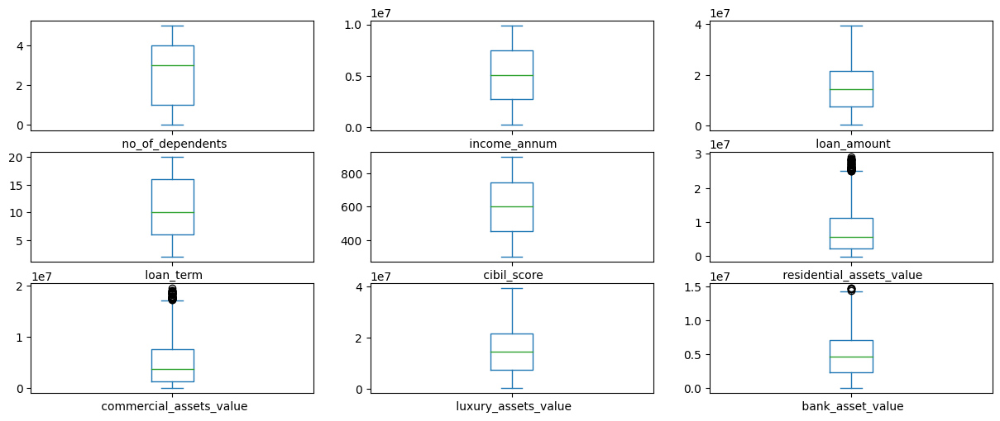

In [ ]:
df.plot(kind='box', subplots=True, sharex=False, sharey=False, layout=(5,3), figsize=(15,10))

checking for null values


In [ ]:
# Checking for null values
import numpy as np
pd.isnull(df).sum()

 no_of_dependents            0
 education                   0
 self_employed               0
 income_annum                0
 loan_amount                 0
 loan_term                   0
 cibil_score                 0
 residential_assets_value    0
 commercial_assets_value     0
 luxury_assets_value         0
 bank_asset_value            0
 loan_status                 0
dtype: int64

In [ ]:
df.columns

Index([' no_of_dependents', ' education', ' self_employed', ' income_annum',
       ' loan_amount', ' loan_term', ' cibil_score',
       ' residential_assets_value', ' commercial_assets_value',
       ' luxury_assets_value', ' bank_asset_value', ' loan_status'],
      dtype='object')

Upon analysis of the outliers , it was shown that there not anomolies, they were just higher than average

In [ ]:
Q1 = np.percentile(df[' residential_assets_value'], 25)
Q3 = np.percentile(df[' residential_assets_value'], 75)
IQR = Q3 - Q1
norm_data_clean =df[(df[' residential_assets_value'] <= (Q1-1.5 * IQR) )|  (df[' residential_assets_value'] >(Q3+1.5*IQR ))]
print(norm_data_clean.count())
norm_data_clean
# plt.hist(norm_data_clean)

 no_of_dependents            52
 education                   52
 self_employed               52
 income_annum                52
 loan_amount                 52
 loan_term                   52
 cibil_score                 52
 residential_assets_value    52
 commercial_assets_value     52
 luxury_assets_value         52
 bank_asset_value            52
 loan_status                 52
dtype: int64


,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
82,2,Not Graduate,Yes,9900000,21200000,16,363,25500000,11400000,26600000,6800000,Rejected
98,4,Graduate,No,9400000,29400000,12,562,25900000,15200000,36400000,7100000,Approved
123,0,Not Graduate,Yes,9000000,18700000,18,865,26800000,0,20900000,11300000,Approved
228,1,Not Graduate,Yes,8700000,27000000,10,717,25500000,8600000,17500000,9100000,Approved
262,3,Graduate,No,9200000,34300000,18,523,25600000,4000000,29100000,8800000,Rejected
693,0,Graduate,No,9200000,25400000,2,783,25400000,2000000,19600000,12400000,Approved
714,4,Not Graduate,No,9900000,22700000,12,567,28300000,9900000,29700000,5400000,Approved
781,3,Not Graduate,Yes,9900000,20400000,4,865,26300000,3600000,36500000,12800000,Approved
892,4,Graduate,No,9300000,24900000,14,455,27600000,4700000,35100000,13900000,Rejected
905,5,Not Graduate,No,9700000,37000000,14,459,28700000,17900000,22800000,5600000,Rejected


Replacement of the negative value found and checking that no other negative values are found

In [ ]:
df[' residential_assets_value'].replace(-100000,100000 , inplace=True)

In [ ]:
df[' residential_assets_value'].min()

0

 no_of_dependents               Axes(0.125,0.747241;0.227941x0.132759)
 income_annum                Axes(0.398529,0.747241;0.227941x0.132759)
 loan_amount                 Axes(0.672059,0.747241;0.227941x0.132759)
 loan_term                      Axes(0.125,0.587931;0.227941x0.132759)
 cibil_score                 Axes(0.398529,0.587931;0.227941x0.132759)
 residential_assets_value    Axes(0.672059,0.587931;0.227941x0.132759)
 commercial_assets_value        Axes(0.125,0.428621;0.227941x0.132759)
 luxury_assets_value         Axes(0.398529,0.428621;0.227941x0.132759)
 bank_asset_value            Axes(0.672059,0.428621;0.227941x0.132759)
dtype: object

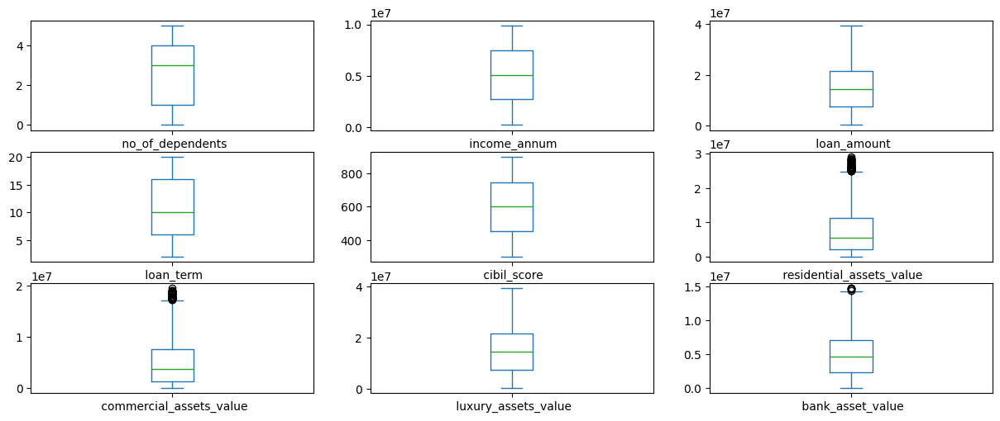

In [ ]:
df.plot(kind='box', subplots=True, sharex=False, sharey=False, layout=(5,3), figsize=(15,10))

In [ ]:
Q1 = np.percentile(df[' bank_asset_value'], 25)
Q3 = np.percentile(df[' bank_asset_value'], 75)
IQR = Q3 - Q1
norm_data_clean =df[(df[' bank_asset_value'] <= (Q1-1.5 * IQR) )|  (df[' bank_asset_value'] >(Q3+1.5*IQR ))]
print(norm_data_clean.count())
norm_data_clean

 no_of_dependents            5
 education                   5
 self_employed               5
 income_annum                5
 loan_amount                 5
 loan_term                   5
 cibil_score                 5
 residential_assets_value    5
 commercial_assets_value     5
 luxury_assets_value         5
 bank_asset_value            5
 loan_status                 5
dtype: int64


,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
200,4,Not Graduate,Yes,9800000,21200000,20,355,22000000,8900000,31800000,14400000,Rejected
1272,5,Not Graduate,No,9900000,35800000,20,470,9500000,18400000,39100000,14700000,Rejected
1633,0,Graduate,Yes,9800000,23200000,10,573,23900000,3300000,23600000,14600000,Approved
1674,1,Not Graduate,No,9800000,21300000,2,356,23000000,12300000,25700000,14600000,Rejected
1805,5,Not Graduate,No,9900000,33600000,20,580,7000000,10800000,37400000,14700000,Approved


In [ ]:
Q1 = np.percentile(df[' commercial_assets_value'], 25)
Q3 = np.percentile(df[' commercial_assets_value'], 75)
IQR = Q3 - Q1
norm_data_clean =df[(df[' commercial_assets_value'] <= (Q1-1.5 * IQR) )|  (df[' commercial_assets_value'] >(Q3+1.5*IQR ))]
print(norm_data_clean.count())
norm_data_clean

 no_of_dependents            37
 education                   37
 self_employed               37
 income_annum                37
 loan_amount                 37
 loan_term                   37
 cibil_score                 37
 residential_assets_value    37
 commercial_assets_value     37
 luxury_assets_value         37
 bank_asset_value            37
 loan_status                 37
dtype: int64


,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
0,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved
157,5,Not Graduate,Yes,9900000,33300000,6,364,5300000,18700000,27800000,8300000,Rejected
231,2,Graduate,No,9800000,32400000,2,543,24200000,17500000,25700000,7700000,Approved
258,0,Graduate,No,9800000,38800000,8,652,23200000,19000000,29700000,5400000,Approved
323,3,Not Graduate,Yes,9500000,24200000,8,879,3100000,17200000,26400000,12700000,Approved
367,1,Not Graduate,Yes,9400000,29800000,10,377,24100000,18500000,30900000,11700000,Rejected
554,3,Not Graduate,Yes,9500000,22800000,6,319,200000,18800000,34100000,9400000,Rejected
791,4,Graduate,Yes,9300000,35500000,6,547,2800000,17800000,27000000,13900000,Rejected
895,0,Graduate,No,9400000,27900000,6,456,21400000,18500000,35600000,7800000,Rejected
905,5,Not Graduate,No,9700000,37000000,14,459,28700000,17900000,22800000,5600000,Rejected


array([[<Axes: title={'center': ' no_of_dependents'}>,
        <Axes: title={'center': ' income_annum'}>,
        <Axes: title={'center': ' loan_amount'}>],
       [<Axes: title={'center': ' loan_term'}>,
        <Axes: title={'center': ' cibil_score'}>,
        <Axes: title={'center': ' residential_assets_value'}>],
       [<Axes: title={'center': ' commercial_assets_value'}>,
        <Axes: title={'center': ' luxury_assets_value'}>,
        <Axes: title={'center': ' bank_asset_value'}>]], dtype=object)

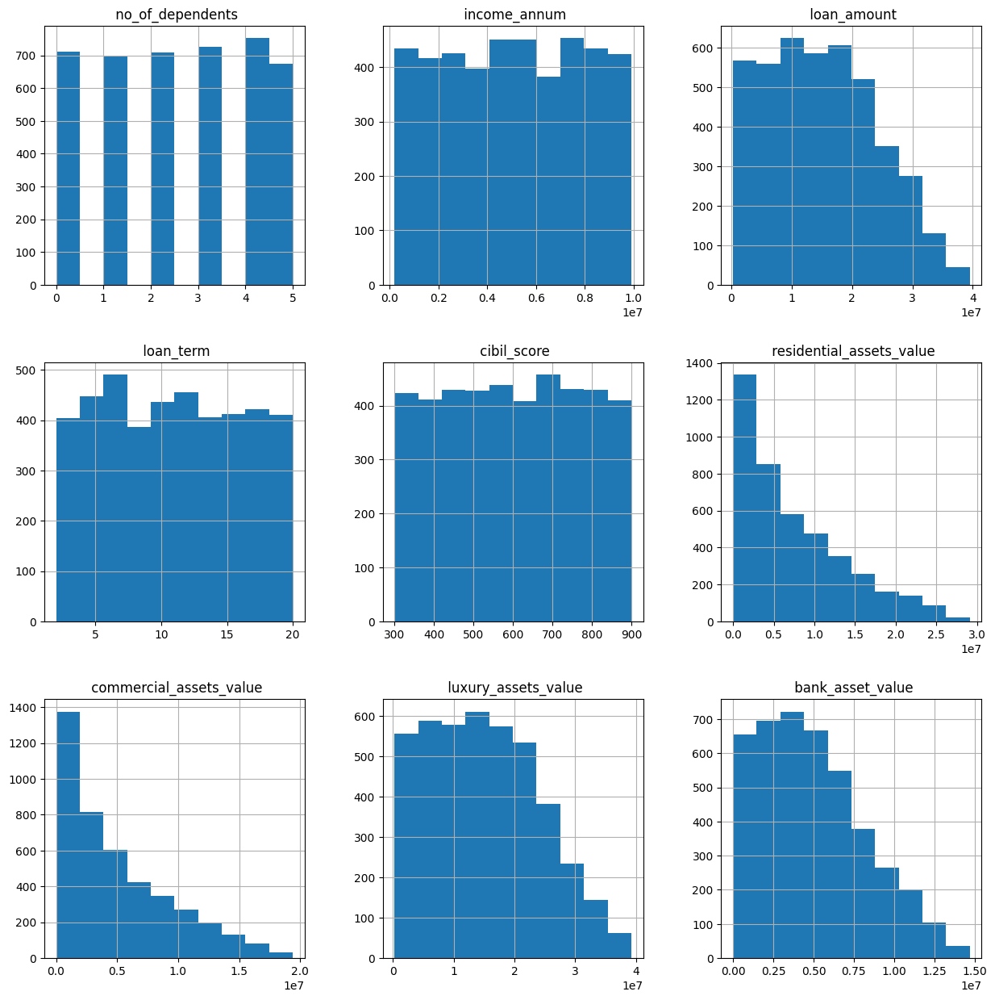

In [ ]:
df.hist(figsize=(15,15))

Plotting the denisty function to check if data follow gaussian distribution
None of the data follow gaussian distribution ,hence no need for standardization

array([[<Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>],
       [<Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>],
       [<Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>]], dtype=object)

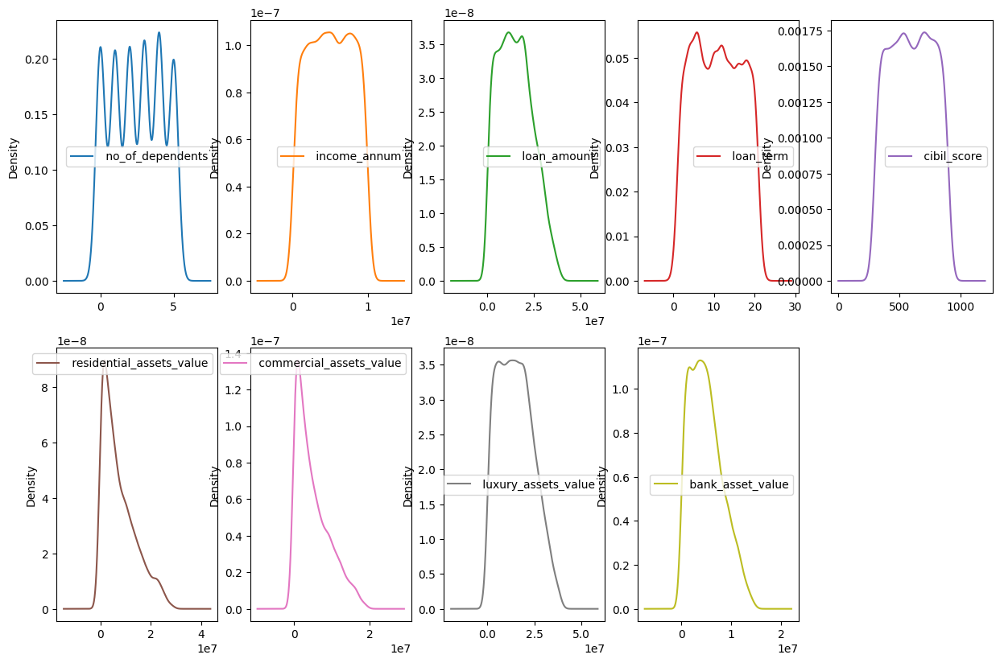

In [ ]:
df.plot(kind='density', subplots=True, layout=(3,5), sharex=False,figsize=(15,15))

Mapping Categorical Values to be Numerical discrete (0,1)

In [ ]:
df[ ' education'] = df[ ' education'].replace({' Graduate': 1, ' Not Graduate': 0})
df[' self_employed'] = df[' self_employed'].replace({' No': 0, ' Yes': 1})
df[' loan_status'] = df[' loan_status'].replace({' Approved': 1, ' Rejected': 0})

In [ ]:
df

,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
0,2,1,0,9600000,29900000,12,778,2400000,17600000,22700000,8000000,1
1,0,0,1,4100000,12200000,8,417,2700000,2200000,8800000,3300000,0
2,3,1,0,9100000,29700000,20,506,7100000,4500000,33300000,12800000,0
3,3,1,0,8200000,30700000,8,467,18200000,3300000,23300000,7900000,0
4,5,0,1,9800000,24200000,20,382,12400000,8200000,29400000,5000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4264,5,1,1,1000000,2300000,12,317,2800000,500000,3300000,800000,0
4265,0,0,1,3300000,11300000,20,559,4200000,2900000,11000000,1900000,1
4266,2,0,0,6500000,23900000,18,457,1200000,12400000,18100000,7300000,0
4267,1,0,0,4100000,12800000,8,780,8200000,700000,14100000,5800000,1


Normalizing for the data

In [ ]:
mini, maxi = np.min(df[' income_annum']), np.max(df[' income_annum'])
df[' income_annum'] = (df[' income_annum'] - mini) / (maxi - mini)

mini, maxi = np.min(df[' loan_amount']), np.max(df[' loan_amount'])
df[' loan_amount'] = (df[' loan_amount'] - mini) / (maxi - mini)

mini, maxi = np.min(df[' residential_assets_value']), np.max(df[' residential_assets_value'])
df[' residential_assets_value'] = (df[' residential_assets_value'] - mini) / (maxi - mini)

mini, maxi = np.min(df[' commercial_assets_value']), np.max(df[' commercial_assets_value'])
df[' commercial_assets_value'] = (df[' commercial_assets_value'] - mini) / (maxi - mini)

mini, maxi = np.min(df[' luxury_assets_value']), np.max(df[' luxury_assets_value'])
df[' luxury_assets_value'] = (df[' luxury_assets_value'] - mini) / (maxi - mini)

mini, maxi = np.min(df[' bank_asset_value']), np.max(df[' bank_asset_value'])
df[' bank_asset_value'] = (df[' bank_asset_value'] - mini) / (maxi - mini)

mini, maxi = np.min(df[' cibil_score']), np.max(df[' cibil_score'])
df[' cibil_score'] = (df[' cibil_score'] - mini) / (maxi - mini)

mini, maxi = np.min(df[' loan_term']), np.max(df[' loan_term'])
df[' loan_term'] = (df[' loan_term'] - mini) / (maxi - mini)


In [ ]:
mini, maxi = np.min(df[' no_of_dependents']), np.max(df[' no_of_dependents'])
df[' no_of_dependents'] = (df[' no_of_dependents'] - mini) / (maxi - mini)

array([[<Axes: title={'center': ' no_of_dependents'}>,
        <Axes: title={'center': ' education'}>,
        <Axes: title={'center': ' self_employed'}>],
       [<Axes: title={'center': ' income_annum'}>,
        <Axes: title={'center': ' loan_amount'}>,
        <Axes: title={'center': ' loan_term'}>],
       [<Axes: title={'center': ' cibil_score'}>,
        <Axes: title={'center': ' residential_assets_value'}>,
        <Axes: title={'center': ' commercial_assets_value'}>],
       [<Axes: title={'center': ' luxury_assets_value'}>,
        <Axes: title={'center': ' bank_asset_value'}>,
        <Axes: title={'center': ' loan_status'}>]], dtype=object)

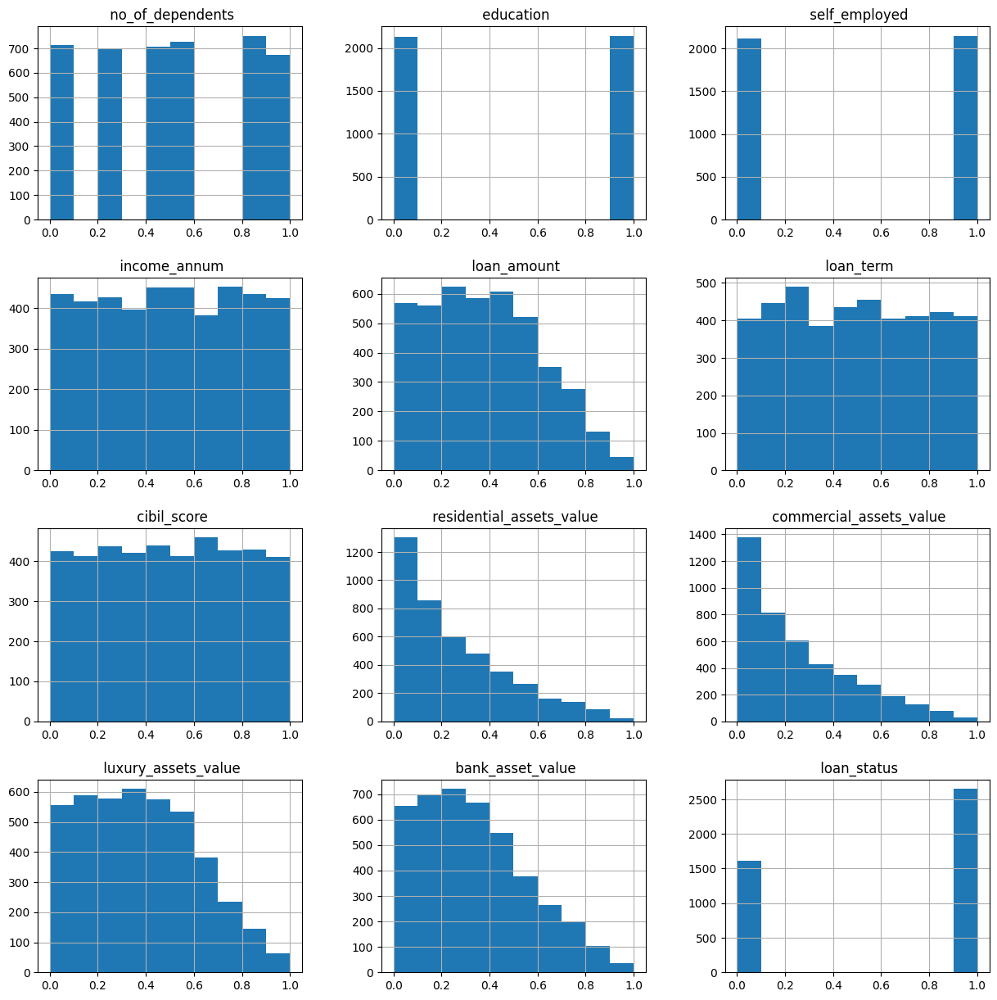

In [ ]:
df.hist(figsize=(15,15))

array([[<Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>],
       [<Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>],
       [<Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>, <Axes: ylabel='Density'>,
        <Axes: ylabel='Density'>]], dtype=object)

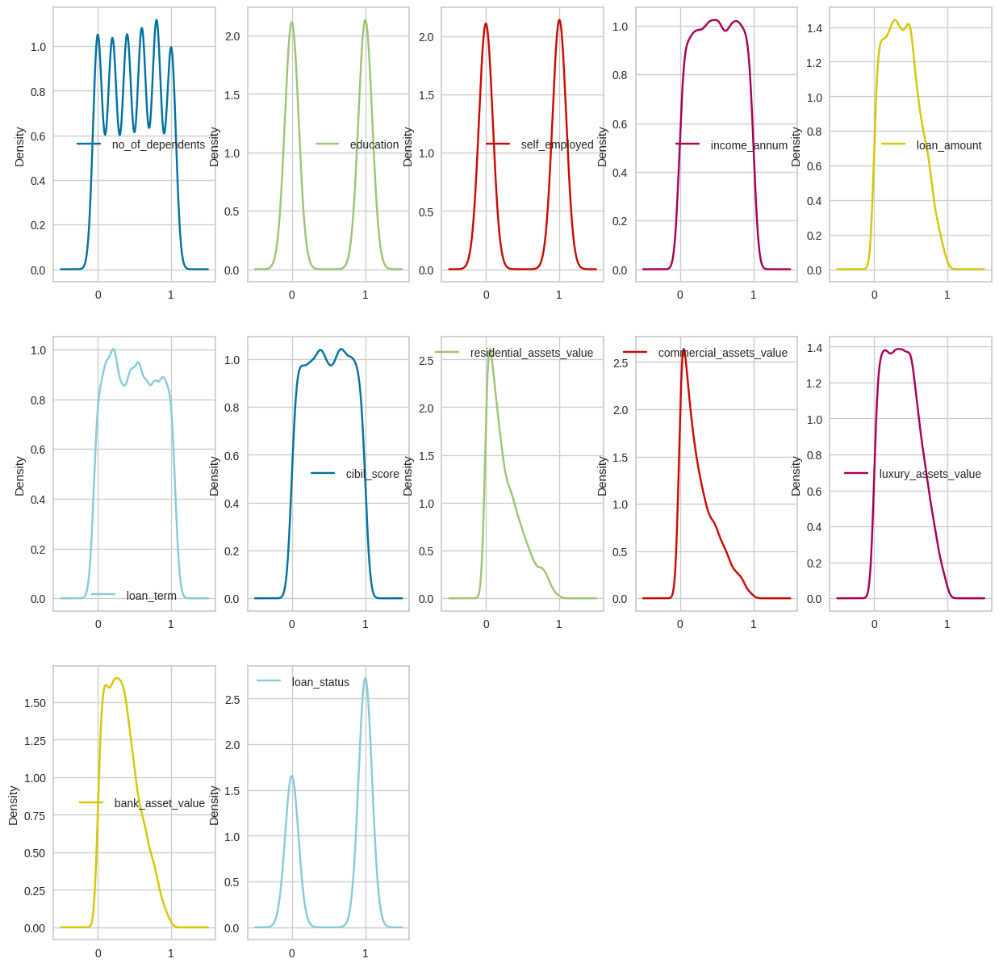

In [ ]:
df.plot(kind='density', subplots=True, layout=(3,5), sharex=False,figsize=(15,15))

# PCA

  Preparing the data for the PCA , hot encoding was done and stored in df2
  N.B: that loan_status was not removed since we want to analysize the data via pca

In [ ]:
categorical_cols = [' education',  ' self_employed', ' loan_status']
df2 = pd.get_dummies(df, columns = categorical_cols)

df2 --> all discerete one hot encoded

In [ ]:
df2

,no_of_dependents,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,education_0,education_1,self_employed_0,self_employed_1,loan_status_0,loan_status_1
0,0.4,0.969072,0.755102,0.555556,0.796667,0.085616,0.907216,0.575835,0.544218,0,1,1,0,0,1
1,0.0,0.402062,0.303571,0.333333,0.195000,0.095890,0.113402,0.218509,0.224490,1,0,0,1,1,0
2,0.6,0.917526,0.750000,1.000000,0.343333,0.246575,0.231959,0.848329,0.870748,0,1,1,0,1,0
3,0.6,0.824742,0.775510,0.333333,0.278333,0.626712,0.170103,0.591260,0.537415,0,1,1,0,1,0
4,1.0,0.989691,0.609694,1.000000,0.136667,0.428082,0.422680,0.748072,0.340136,1,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4264,1.0,0.082474,0.051020,0.555556,0.028333,0.099315,0.025773,0.077121,0.054422,0,1,0,1,1,0
4265,0.0,0.319588,0.280612,1.000000,0.431667,0.147260,0.149485,0.275064,0.129252,1,0,0,1,0,1
4266,0.4,0.649485,0.602041,0.888889,0.261667,0.044521,0.639175,0.457584,0.496599,1,0,1,0,1,0
4267,0.2,0.402062,0.318878,0.333333,0.800000,0.284247,0.036082,0.354756,0.394558,1,0,1,0,0,1


In [ ]:
df2.describe()

,no_of_dependents,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,education_0,education_1,self_employed_0,self_employed_1,loan_status_0,loan_status_1
count,4269.000000,4269.000000,4269.000000,4269.000000,4269.000000,4269.000000,4269.000000,4269.000000,4269.000000,4269.000000,4269.000000,4269.000000,4269.000000,4269.000000,4269.000000
mean,0.499742,0.500941,0.378404,0.494469,0.499893,0.259336,0.256348,0.381139,0.338551,0.497775,0.502225,0.496369,0.503631,0.377840,0.622160
std,0.339182,0.289365,0.230698,0.317177,0.287384,0.222727,0.226235,0.234030,0.221101,0.500054,0.500054,0.500045,0.500045,0.484904,0.484904
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.200000,0.257732,0.188776,0.222222,0.255000,0.078767,0.067010,0.185090,0.156463,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.600000,0.505155,0.362245,0.444444,0.500000,0.195205,0.190722,0.367609,0.312925,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000
75%,0.800000,0.752577,0.540816,0.777778,0.746667,0.390411,0.391753,0.550129,0.482993,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Correlation matrix for the data frame with out the one hot encoding and heat map

In [ ]:
corr_matrix = df.corr()

corr_matrix

,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
no_of_dependents,1.000000,0.002697,0.000765,0.007266,-0.003366,-0.020111,-0.009998,0.007376,-0.001531,0.002817,0.011163,-0.018114
education,0.002697,1.000000,-0.023224,0.011625,0.010631,-0.008417,-0.004649,0.010930,-0.006763,0.012471,0.009424,0.004918
self_employed,0.000765,-0.023224,1.000000,0.002368,0.001450,0.004107,-0.004866,0.006144,-0.017998,0.004413,-0.000215,0.000345
income_annum,0.007266,0.011625,0.002368,1.000000,0.927470,0.011488,-0.023034,0.636841,0.640328,0.929145,0.851093,-0.015189
loan_amount,-0.003366,0.010631,0.001450,0.927470,1.000000,0.008437,-0.017035,0.594596,0.603188,0.860914,0.788122,0.016150
loan_term,-0.020111,-0.008417,0.004107,0.011488,0.008437,1.000000,0.007810,0.008016,-0.005478,0.012490,0.017177,-0.113036
cibil_score,-0.009998,-0.004649,-0.004866,-0.023034,-0.017035,0.007810,1.000000,-0.019947,-0.003769,-0.028618,-0.015478,0.770518
residential_assets_value,0.007376,0.010930,0.006144,0.636841,0.594596,0.008016,-0.019947,1.000000,0.414786,0.590932,0.527418,-0.014367
commercial_assets_value,-0.001531,-0.006763,-0.017998,0.640328,0.603188,-0.005478,-0.003769,0.414786,1.000000,0.591128,0.548576,0.008246
luxury_assets_value,0.002817,0.012471,0.004413,0.929145,0.860914,0.012490,-0.028618,0.590932,0.591128,1.000000,0.788517,-0.015465


<Axes: >

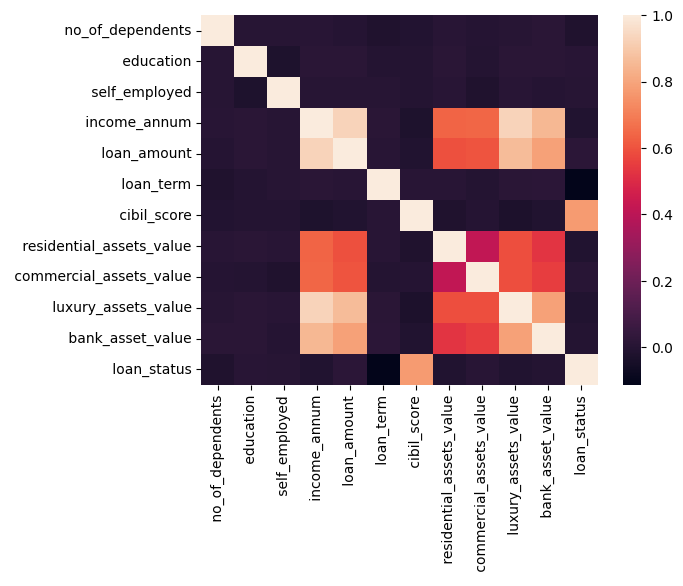

In [ ]:
import seaborn as sns
sns.heatmap(corr_matrix)

In [ ]:
df.columns

Index([' no_of_dependents', ' education', ' self_employed', ' income_annum',
       ' loan_amount', ' loan_term', ' cibil_score',
       ' residential_assets_value', ' commercial_assets_value',
       ' luxury_assets_value', ' bank_asset_value', ' loan_status'],
      dtype='object')

# Data set with reduced feautures to be fed in clustering


In [ ]:
df_features_reduced=df.copy()

In [ ]:
df_features_reduced=df_features_reduced.drop(' luxury_assets_value',axis=1)

In [ ]:
df_features_reduced=df_features_reduced.drop(' bank_asset_value',axis=1)

In [ ]:
df_features_reduced

,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,loan_status
0,0.4,1,0,0.969072,0.755102,0.555556,0.796667,0.082474,0.907216,1
1,0.0,0,1,0.402062,0.303571,0.333333,0.195000,0.092784,0.113402,0
2,0.6,1,0,0.917526,0.750000,1.000000,0.343333,0.243986,0.231959,0
3,0.6,1,0,0.824742,0.775510,0.333333,0.278333,0.625430,0.170103,0
4,1.0,0,1,0.989691,0.609694,1.000000,0.136667,0.426117,0.422680,0
...,...,...,...,...,...,...,...,...,...,...
4264,1.0,1,1,0.082474,0.051020,0.555556,0.028333,0.096220,0.025773,0
4265,0.0,0,1,0.319588,0.280612,1.000000,0.431667,0.144330,0.149485,1
4266,0.4,0,0,0.649485,0.602041,0.888889,0.261667,0.041237,0.639175,0
4267,0.2,0,0,0.402062,0.318878,0.333333,0.800000,0.281787,0.036082,1


The df_features_reduced to be fed into the clustering to compare with the output of un reduced as well as the pca output

N.B : we only used the co-relation matrix to know which features to be reduced .However , for PCA we used the data frame with all the features

co-relation matrix for the data frame with one hot encoding as well as the heat map

In [ ]:
corr_matrix1 = df2.corr()

corr_matrix1

,no_of_dependents,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,education_0,education_1,self_employed_0,self_employed_1,loan_status_0,loan_status_1
no_of_dependents,1.000000,0.007266,-0.003366,-0.020111,-0.009998,0.007376,-0.001531,0.002817,0.011163,-0.002697,0.002697,-0.000765,0.000765,0.018114,-0.018114
income_annum,0.007266,1.000000,0.927470,0.011488,-0.023034,0.636841,0.640328,0.929145,0.851093,-0.011625,0.011625,-0.002368,0.002368,0.015189,-0.015189
loan_amount,-0.003366,0.927470,1.000000,0.008437,-0.017035,0.594596,0.603188,0.860914,0.788122,-0.010631,0.010631,-0.001450,0.001450,-0.016150,0.016150
loan_term,-0.020111,0.011488,0.008437,1.000000,0.007810,0.008016,-0.005478,0.012490,0.017177,0.008417,-0.008417,-0.004107,0.004107,0.113036,-0.113036
cibil_score,-0.009998,-0.023034,-0.017035,0.007810,1.000000,-0.019947,-0.003769,-0.028618,-0.015478,0.004649,-0.004649,0.004866,-0.004866,-0.770518,0.770518
residential_assets_value,0.007376,0.636841,0.594596,0.008016,-0.019947,1.000000,0.414786,0.590932,0.527418,-0.010930,0.010930,-0.006144,0.006144,0.014367,-0.014367
commercial_assets_value,-0.001531,0.640328,0.603188,-0.005478,-0.003769,0.414786,1.000000,0.591128,0.548576,0.006763,-0.006763,0.017998,-0.017998,-0.008246,0.008246
luxury_assets_value,0.002817,0.929145,0.860914,0.012490,-0.028618,0.590932,0.591128,1.000000,0.788517,-0.012471,0.012471,-0.004413,0.004413,0.015465,-0.015465
bank_asset_value,0.011163,0.851093,0.788122,0.017177,-0.015478,0.527418,0.548576,0.788517,1.000000,-0.009424,0.009424,0.000215,-0.000215,0.006778,-0.006778
education_0,-0.002697,-0.011625,-0.010631,0.008417,0.004649,-0.010930,0.006763,-0.012471,-0.009424,1.000000,-1.000000,-0.023224,0.023224,0.004918,-0.004918


<Axes: >

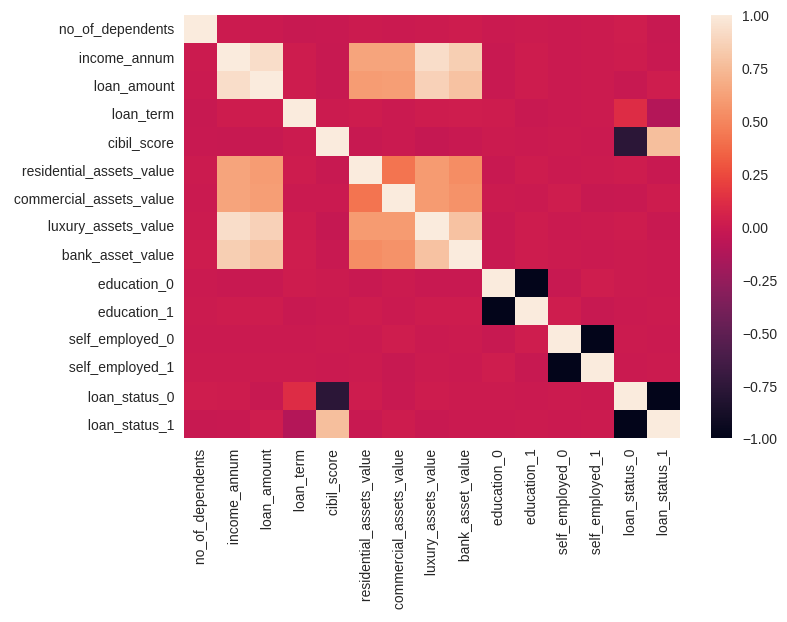

In [ ]:
import seaborn as sns
sns.heatmap(corr_matrix1)

Printing eigen values for pca analysis

In [ ]:
eig_vals, eig_vecs = np.linalg.eig(corr_matrix)

In [ ]:
print(eig_vals)
# ' no_of_dependents', ' education', ' self_employed', ' income_annum', ' loan_amount', ' loan_term',

#  ' cibil_score',    ' residential_assets_value', ' commercial_assets_value', ' luxury_assets_value', ' bank_asset_value', ' loan_status']

[4.49002283 1.77817844 0.04158116 0.1374115  0.21905495 0.23833216
 0.50699894 0.58457445 1.0305791  1.01589648 0.9797604  0.97760959]


In [ ]:
df2.columns

Index([' no_of_dependents', ' income_annum', ' loan_amount', ' loan_term',
       ' cibil_score', ' residential_assets_value', ' commercial_assets_value',
       ' luxury_assets_value', ' bank_asset_value', ' education_0',
       ' education_1', ' self_employed_0', ' self_employed_1',
       ' loan_status_0', ' loan_status_1'],
      dtype='object')

eigen values for the df2 (the one including one hot encoding)

In [ ]:
eig_vals1, eig_vecs1 = np.linalg.eig(corr_matrix1)
eig_vals1

array([4.49055706e+00, 2.70924138e+00, 2.04636278e+00, 1.95436877e+00,
       1.02220306e+00, 9.80159781e-01, 5.85026575e-01, 5.07203085e-01,
       2.90216559e-01, 2.35221709e-01, 1.37834053e-01, 4.16051959e-02,
       5.58059528e-17, 4.52848360e-16, 5.73685667e-16])

In [ ]:
tot = sum(eig_vals1)
var_exp = [(i / tot)*100 for i in eig_vals1]
cum_var_exp = np.cumsum(var_exp)
cum_var_exp
# ' no_of_dependents', "loan_amount', income_annum', ' loan_term',
#' cibil_score',' residential_assets_value', ' commercial_assets_value',  ' luxury_assets_value',
# ' bank_asset_value', ' education_0',' education_1', ' self_employed_0', '
#    self_employed_1',   ' loan_status_0', ' loan_status_1']
#residental_Assetsvalue,commerical_Assets_value,luxury,bank,last 6 #do not include

array([ 29.93704705,  47.99865622,  61.64107472,  74.67019988,
        81.48488695,  88.01928549,  91.91946266,  95.30081656,
        97.23559361,  98.80373834,  99.72263203, 100.        ,
       100.        , 100.        , 100.        ])

cummulative plot for every feature and its impact in variance ( Explained variance bar graph)

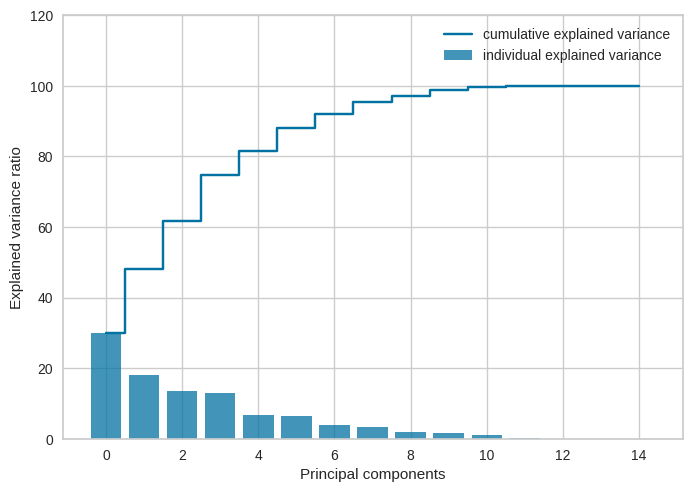

In [ ]:
import matplotlib.pyplot as plt

plt.bar(range(0, 15), var_exp, alpha=0.75, align='center',
        label='individual explained variance')
plt.step(range(0, 15), cum_var_exp, where='mid',
         label='cumulative explained variance')
plt.ylim(0, 120)
plt.xlabel('Principal components')
plt.ylabel('Explained variance ratio')
plt.legend(loc='best')
plt.show()

It was chosen PCA of 6 components as shown from the Explained variance bar graph where the first six features has the maximum contribution to the variance of the data (~ 88% cummulative )

In [ ]:
loan_status_labels = df2[' loan_status_0'].copy()

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 6)
df_copy_pca = pca.fit_transform(df2)

df_copy = pd.DataFrame(df_copy_pca, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6'])


df_copy.head()

,PC1,PC2,PC3,PC4,PC5,PC6
0,-0.712979,0.927708,-0.022232,0.725918,-0.115003,0.083094
1,1.028656,-0.880453,0.021324,-0.299571,-0.468272,-0.286977
2,0.787847,1.113197,0.036380,0.756867,0.014414,0.481842
3,0.770593,1.112111,0.035834,0.572599,0.118002,-0.180000
4,1.105169,-0.863490,0.035993,0.633505,0.414138,0.501199


In [ ]:
df_copy.columns


Index(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6'], dtype='object')

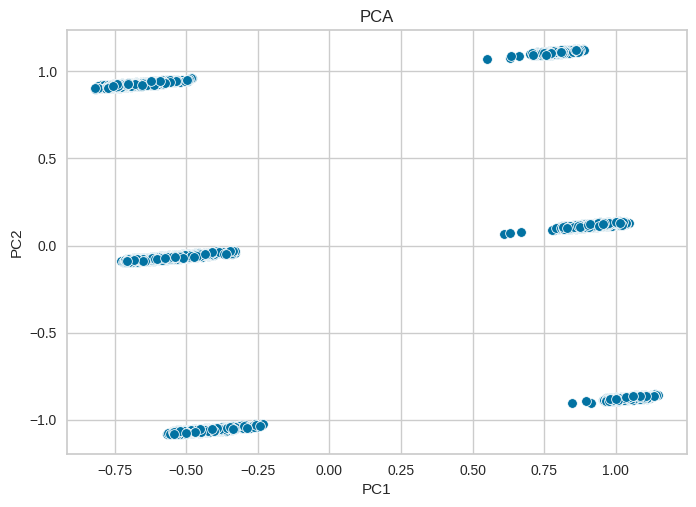

In [ ]:
import seaborn as sns
sns.scatterplot(x='PC1', y='PC2', data=df_copy)
plt.title('PCA')
plt.show()

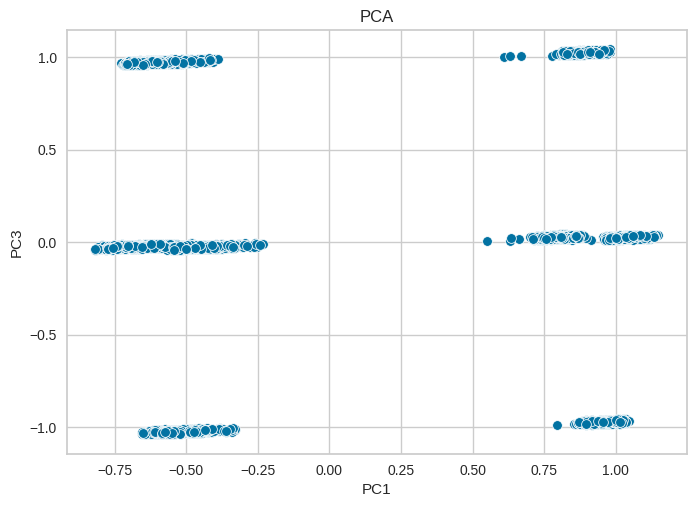

In [ ]:
import seaborn as sns
sns.scatterplot(x='PC1', y='PC3', data=df_copy)
plt.title('PCA')
plt.show()

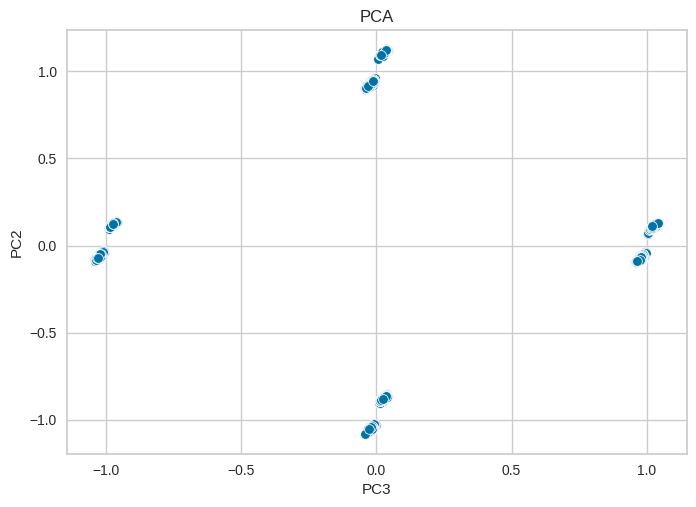

In [ ]:
import seaborn as sns
sns.scatterplot(x='PC3', y='PC2', data=df_copy)
plt.title('PCA')
plt.show()

PCA with 6 components was plotted and the label chosen was loan_status to check wether it can be clustered according to this feature

In [ ]:
df_copy = pd.DataFrame(df_copy_pca, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6'])
df_copy[' loan_status_0'] = loan_status_labels
df_copy.head()

,PC1,PC2,PC3,PC4,PC5,PC6,loan_status_0
0,-0.712979,0.927708,-0.022232,0.725918,-0.115003,0.083094,0
1,1.028656,-0.880453,0.021324,-0.299571,-0.468272,-0.286977,1
2,0.787847,1.113197,0.036380,0.756867,0.014414,0.481842,1
3,0.770593,1.112111,0.035834,0.572599,0.118002,-0.180000,1
4,1.105169,-0.863490,0.035993,0.633505,0.414138,0.501199,1


In [ ]:
income_annum = df2[ ' income_annum'].copy()


In [ ]:
df_copy[' income_annum'] = income_annum
df_copy.head()

,PC1,PC2,PC3,PC4,PC5,PC6,loan_status_0,income_annum
0,-0.712979,0.927708,-0.022232,0.725918,-0.115003,0.083094,0,0.969072
1,1.028656,-0.880453,0.021324,-0.299571,-0.468272,-0.286977,1,0.402062
2,0.787847,1.113197,0.036380,0.756867,0.014414,0.481842,1,0.917526
3,0.770593,1.112111,0.035834,0.572599,0.118002,-0.180000,1,0.824742
4,1.105169,-0.863490,0.035993,0.633505,0.414138,0.501199,1,0.989691


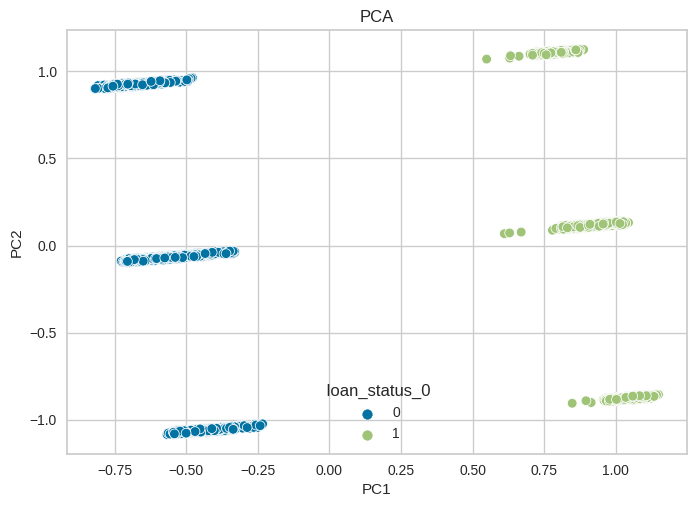

In [ ]:
import seaborn as sns
sns.scatterplot(x='PC1', y='PC2',hue=' loan_status_0', data=df_copy)
plt.title('PCA')
plt.show()

The data could be clustered according to the loan_status .However, not with the income amount

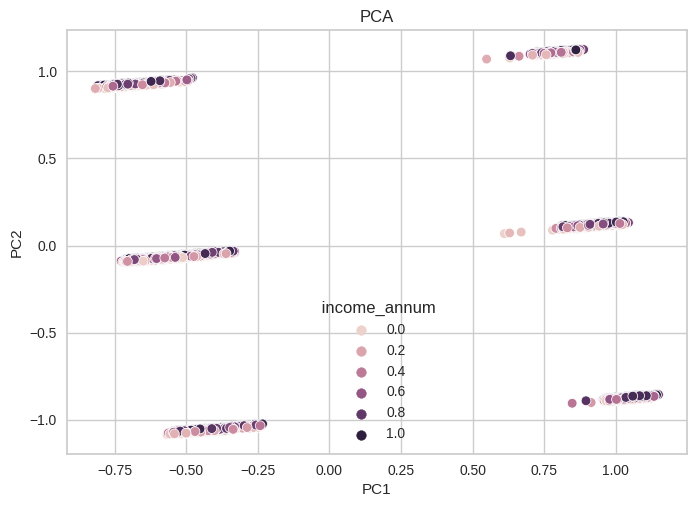

In [ ]:
import seaborn as sns
sns.scatterplot(x='PC1', y='PC2',hue=' income_annum', data=df_copy)
plt.title('PCA')
plt.show()

In [ ]:
df2.columns

Index([' no_of_dependents', ' income_annum', ' loan_amount', ' loan_term',
       ' cibil_score', ' residential_assets_value', ' commercial_assets_value',
       ' luxury_assets_value', ' bank_asset_value', ' education_0',
       ' education_1', ' self_employed_0', ' self_employed_1',
       ' loan_status_0', ' loan_status_1'],
      dtype='object')

In [ ]:
#df_copy.drop(' income_annum', axis=1, inplace=True)
df_copy.drop(' loan_status_0', axis=1, inplace=True)
df_copy.columns

Index(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', ' income_annum'], dtype='object')

In [ ]:
df_copy.drop(' income_annum', axis=1, inplace=True)
df_copy.columns

Index(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6'], dtype='object')

In [ ]:
exp_var_pca = pca.explained_variance_ratio_

In [ ]:
exp_var_pca

array([0.24842683, 0.24239515, 0.23147918, 0.12475162, 0.05466746,
       0.04741096])

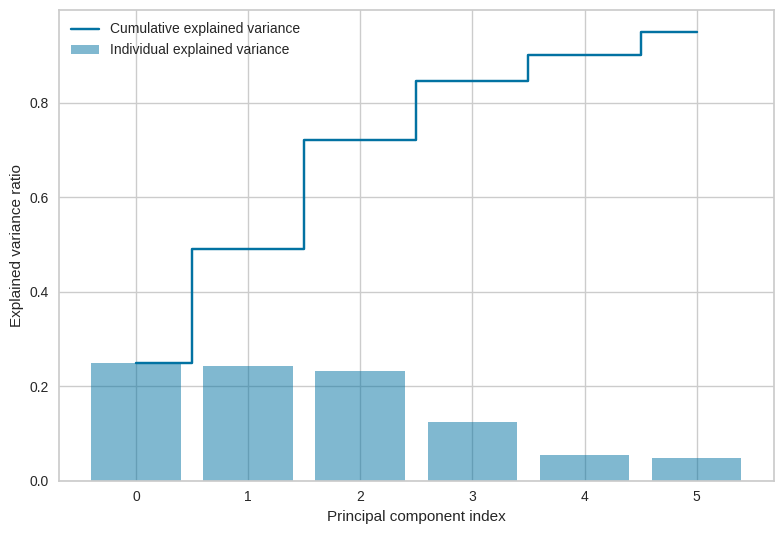

In [ ]:

cum_sum_eigenvalues = np.cumsum(exp_var_pca)
#
# Create the visualization plot
#
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

The cummaltive explained variance for the principal componet is shown above ,the first 3 pca are chosen to be fed to the clustering model capturing 70% of the data variance

In [ ]:
df3=df.copy()

Copying the dataset into new data frame df3 that will not include the loan_status since this data set will be used for the PCA fed for the classification

In [ ]:
df3.drop(' loan_status', axis=1, inplace=True)

In [ ]:
df3.head()

,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value
0,0.4,1,0,0.969072,0.755102,0.555556,0.796667,0.085616,0.907216,0.575835,0.544218
1,0.0,0,1,0.402062,0.303571,0.333333,0.195000,0.095890,0.113402,0.218509,0.224490
2,0.6,1,0,0.917526,0.750000,1.000000,0.343333,0.246575,0.231959,0.848329,0.870748
3,0.6,1,0,0.824742,0.775510,0.333333,0.278333,0.626712,0.170103,0.591260,0.537415
4,1.0,0,1,0.989691,0.609694,1.000000,0.136667,0.428082,0.422680,0.748072,0.340136


one hot encoding for the nex data frame not including  loan_status to be prepared for PCA

In [ ]:
categorical_cols = [' education',  ' self_employed']
df3 = pd.get_dummies(df, columns = categorical_cols)

In [ ]:
df3.head()

,no_of_dependents,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status,education_0,education_1,self_employed_0,self_employed_1
0,0.4,0.969072,0.755102,0.555556,0.796667,0.085616,0.907216,0.575835,0.544218,1,0,1,1,0
1,0.0,0.402062,0.303571,0.333333,0.195000,0.095890,0.113402,0.218509,0.224490,0,1,0,0,1
2,0.6,0.917526,0.750000,1.000000,0.343333,0.246575,0.231959,0.848329,0.870748,0,0,1,1,0
3,0.6,0.824742,0.775510,0.333333,0.278333,0.626712,0.170103,0.591260,0.537415,0,0,1,1,0
4,1.0,0.989691,0.609694,1.000000,0.136667,0.428082,0.422680,0.748072,0.340136,0,1,0,0,1


In [ ]:
df3.drop(' loan_status', axis=1, inplace=True)

In [ ]:
df3.head()

,no_of_dependents,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,education_0,education_1,self_employed_0,self_employed_1
0,0.4,0.969072,0.755102,0.555556,0.796667,0.085616,0.907216,0.575835,0.544218,0,1,1,0
1,0.0,0.402062,0.303571,0.333333,0.195000,0.095890,0.113402,0.218509,0.224490,1,0,0,1
2,0.6,0.917526,0.750000,1.000000,0.343333,0.246575,0.231959,0.848329,0.870748,0,1,1,0
3,0.6,0.824742,0.775510,0.333333,0.278333,0.626712,0.170103,0.591260,0.537415,0,1,1,0
4,1.0,0.989691,0.609694,1.000000,0.136667,0.428082,0.422680,0.748072,0.340136,1,0,0,1


Co-relation matrix for the df3 data frame and heatmap

In [ ]:
corr_matrix2 = df3.corr()

corr_matrix2


,no_of_dependents,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,education_0,education_1,self_employed_0,self_employed_1
no_of_dependents,1.000000,0.007266,-0.003366,-0.020111,-0.009998,0.007376,-0.001531,0.002817,0.011163,-0.002697,0.002697,-0.000765,0.000765
income_annum,0.007266,1.000000,0.927470,0.011488,-0.023034,0.636841,0.640328,0.929145,0.851093,-0.011625,0.011625,-0.002368,0.002368
loan_amount,-0.003366,0.927470,1.000000,0.008437,-0.017035,0.594596,0.603188,0.860914,0.788122,-0.010631,0.010631,-0.001450,0.001450
loan_term,-0.020111,0.011488,0.008437,1.000000,0.007810,0.008016,-0.005478,0.012490,0.017177,0.008417,-0.008417,-0.004107,0.004107
cibil_score,-0.009998,-0.023034,-0.017035,0.007810,1.000000,-0.019947,-0.003769,-0.028618,-0.015478,0.004649,-0.004649,0.004866,-0.004866
residential_assets_value,0.007376,0.636841,0.594596,0.008016,-0.019947,1.000000,0.414786,0.590932,0.527418,-0.010930,0.010930,-0.006144,0.006144
commercial_assets_value,-0.001531,0.640328,0.603188,-0.005478,-0.003769,0.414786,1.000000,0.591128,0.548576,0.006763,-0.006763,0.017998,-0.017998
luxury_assets_value,0.002817,0.929145,0.860914,0.012490,-0.028618,0.590932,0.591128,1.000000,0.788517,-0.012471,0.012471,-0.004413,0.004413
bank_asset_value,0.011163,0.851093,0.788122,0.017177,-0.015478,0.527418,0.548576,0.788517,1.000000,-0.009424,0.009424,0.000215,-0.000215
education_0,-0.002697,-0.011625,-0.010631,0.008417,0.004649,-0.010930,0.006763,-0.012471,-0.009424,1.000000,-1.000000,-0.023224,0.023224


<Axes: >

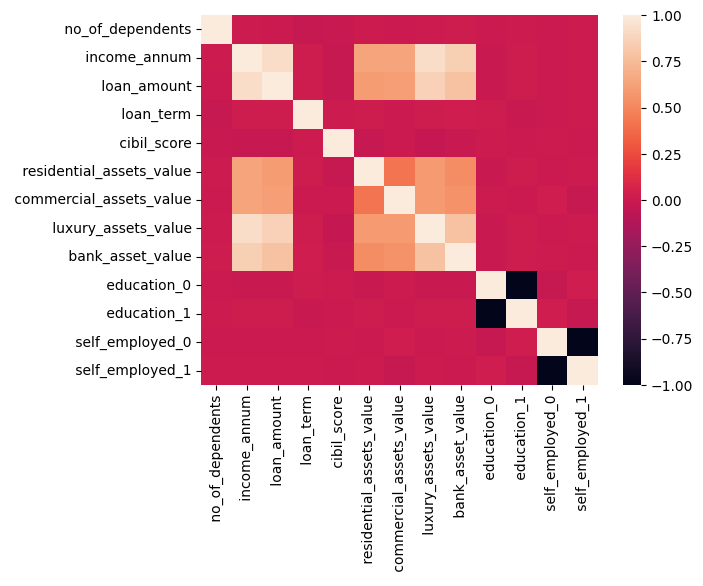

In [ ]:
import seaborn as sns
sns.heatmap(corr_matrix2)

In [ ]:
df3.columns

Index([' no_of_dependents', ' income_annum', ' loan_amount', ' loan_term',
       ' cibil_score', ' residential_assets_value', ' commercial_assets_value',
       ' luxury_assets_value', ' bank_asset_value', ' education_0',
       ' education_1', ' self_employed_0', ' self_employed_1'],
      dtype='object')

Cummalitive plot for the eigen values for features in the df3 to know the impact for features among the variance

In [ ]:
eig_vals3, eig_vecs = np.linalg.eig(corr_matrix2)

print(eig_vals3)


# ' no_of_dependents', , income_annum', "loan_amount'' loan_term',
#' cibil_score',' residential_assets_value', ' commercial_assets_value',
# ' luxury_assets_value',' bank_asset_value', ' education_0','
#  ' education_1', ' self_employed_0',   self_employed_1',]
#residental_Assetsvalue,commerical_Assets_value,luxury,bank,last 6 #do not include

[4.49011368e+00 2.04643850e+00 1.95437622e+00 1.02605871e+00
 9.80156710e-01 9.93992761e-01 5.84969251e-01 5.07006496e-01
 2.36103199e-01 1.38808426e-01 4.19760440e-02 4.99600361e-16
 4.88464757e-16]


In [ ]:
tot = sum(eig_vals3)
var_exp = [(i / tot)*100 for i in eig_vals3]
cum_var_exp = np.cumsum(var_exp)
cum_var_exp

array([ 34.53933602,  50.28117063,  65.31483387,  73.20759317,
        80.74726017,  88.39335833,  92.89312181,  96.79317178,
        98.60935023,  99.67710735, 100.        , 100.        ,
       100.        ])

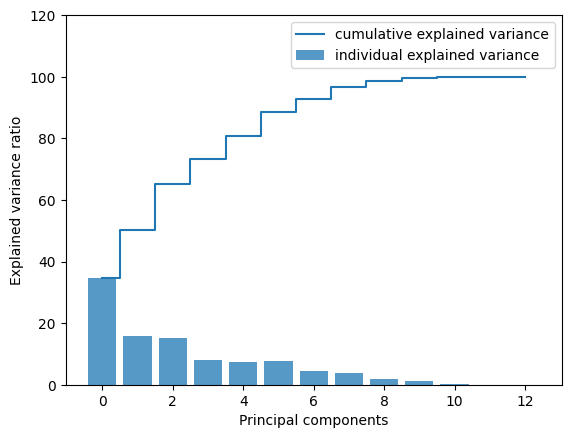

In [ ]:
import matplotlib.pyplot as plt

plt.bar(range(0, 13), var_exp, alpha=0.75, align='center',
        label='individual explained variance')
plt.step(range(0, 13), cum_var_exp, where='mid',
         label='cumulative explained variance')
plt.ylim(0, 120)
plt.xlabel('Principal components')
plt.ylabel('Explained variance ratio')
plt.legend(loc='best')
plt.show()

According to the results pca with 6 components is used but this time the loan_status was removed from the data since this data  will be used for classification

In [ ]:
df3

,no_of_dependents,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,education_0,education_1,self_employed_0,self_employed_1
0,0.4,0.969072,0.755102,0.555556,0.796667,0.085616,0.907216,0.575835,0.544218,0,1,1,0
1,0.0,0.402062,0.303571,0.333333,0.195000,0.095890,0.113402,0.218509,0.224490,1,0,0,1
2,0.6,0.917526,0.750000,1.000000,0.343333,0.246575,0.231959,0.848329,0.870748,0,1,1,0
3,0.6,0.824742,0.775510,0.333333,0.278333,0.626712,0.170103,0.591260,0.537415,0,1,1,0
4,1.0,0.989691,0.609694,1.000000,0.136667,0.428082,0.422680,0.748072,0.340136,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4264,1.0,0.082474,0.051020,0.555556,0.028333,0.099315,0.025773,0.077121,0.054422,0,1,0,1
4265,0.0,0.319588,0.280612,1.000000,0.431667,0.147260,0.149485,0.275064,0.129252,1,0,0,1
4266,0.4,0.649485,0.602041,0.888889,0.261667,0.044521,0.639175,0.457584,0.496599,1,0,1,0
4267,0.2,0.402062,0.318878,0.333333,0.800000,0.284247,0.036082,0.354756,0.394558,1,0,1,0


In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 6)
df_copy_pca3 = pca.fit_transform(df3)

df_copy3 = pd.DataFrame(df_copy_pca3, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6'])


df_copy3.head()

,PC1,PC2,PC3,PC4,PC5,PC6
0,1.009052,0.004598,0.714347,-0.124848,0.045475,0.313123
1,-1.001219,0.006900,-0.282233,-0.458174,-0.243740,-0.316992
2,1.006831,-0.003265,0.774381,0.025907,0.510866,-0.161479
3,1.007955,-0.003333,0.588522,0.126191,-0.150216,-0.206717
4,-0.994182,-0.004843,0.653235,0.430604,0.548778,-0.358374


In [ ]:
df_copy3.head()

,PC1,PC2,PC3,PC4,PC5,PC6
0,1.009052,0.004598,0.714347,-0.124848,0.045475,0.313123
1,-1.001219,0.006900,-0.282233,-0.458174,-0.243740,-0.316992
2,1.006831,-0.003265,0.774381,0.025907,0.510866,-0.161479
3,1.007955,-0.003333,0.588522,0.126191,-0.150216,-0.206717
4,-0.994182,-0.004843,0.653235,0.430604,0.548778,-0.358374


Plotting The pcas against each other and checking if they can be clustered or grouped based on ceratin labels and plotting of the data according to the chosen n pcas

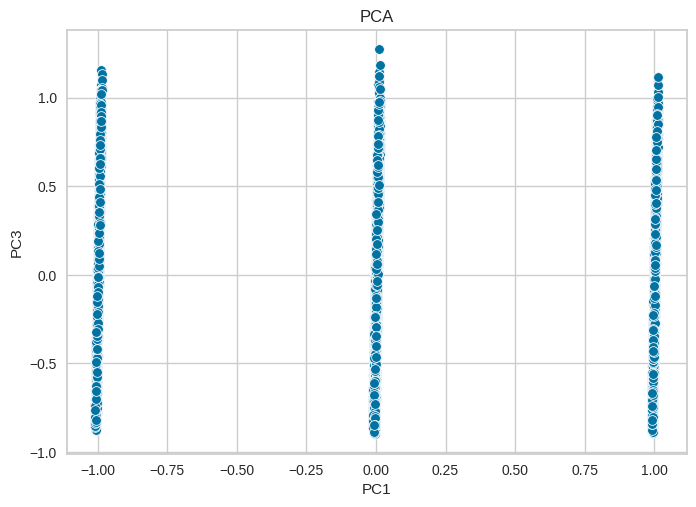

In [ ]:
import seaborn as sns
sns.scatterplot(x='PC1', y='PC3', data=df_copy3)
plt.title('PCA')
plt.show()

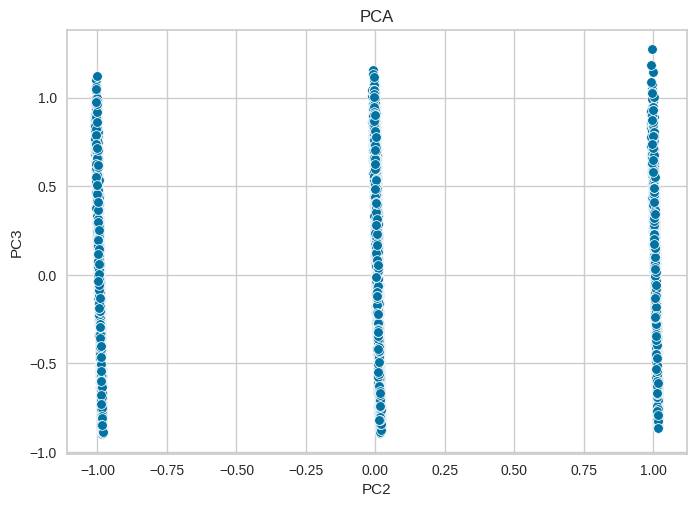

In [ ]:
import seaborn as sns
sns.scatterplot(x='PC2', y='PC3', data=df_copy3)
plt.title('PCA')
plt.show()

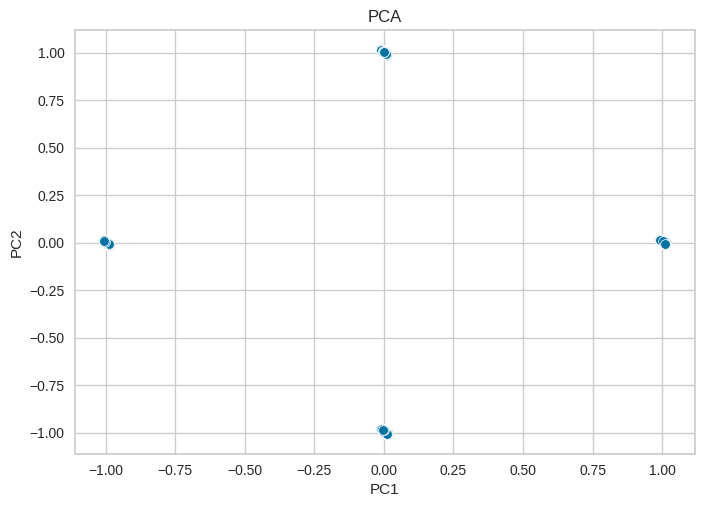

In [ ]:
import seaborn as sns
sns.scatterplot(x='PC1', y='PC2', data=df_copy3)
plt.title('PCA')
plt.show()

In [ ]:
loan_status_labels=df[' loan_status']
df_copy3[' loan_status']=loan_status_labels
df_copy3.head()

,PC1,PC2,PC3,PC4,PC5,PC6,loan_status
0,1.009052,0.004600,0.713661,-0.124865,0.045486,0.313103,1
1,-1.001226,0.006911,-0.282497,-0.458174,-0.243739,-0.316994,0
2,1.006836,-0.003273,0.774038,0.025895,0.510874,-0.161493,0
3,1.007969,-0.003359,0.589108,0.126194,-0.150218,-0.206711,0
4,-0.994173,-0.004867,0.653381,0.430599,0.548781,-0.358377,0


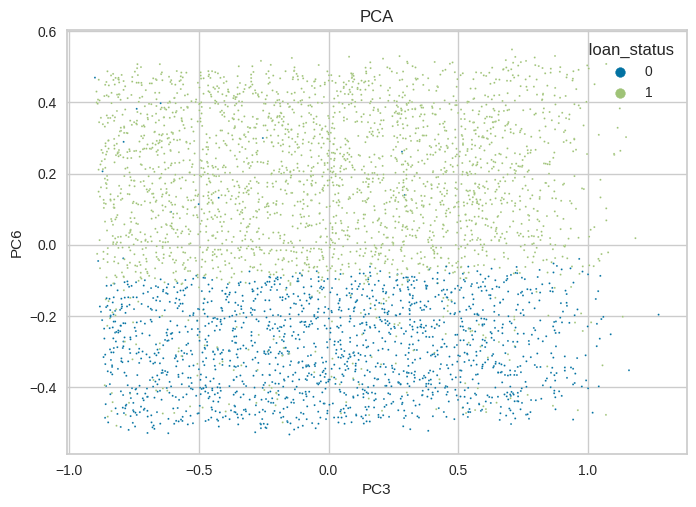

In [ ]:
import seaborn as sns
sns.scatterplot(x='PC3', y='PC6',hue=' loan_status',s=2, data=df_copy3)
plt.title('PCA')
plt.show()

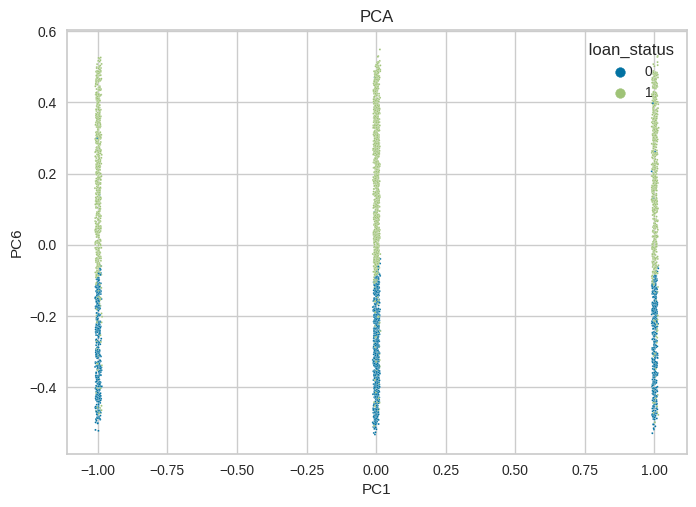

In [ ]:
import seaborn as sns
sns.scatterplot(x='PC1', y='PC6',hue=' loan_status',s=2, data=df_copy3)
plt.title('PCA')
plt.show()

In [ ]:
df_copy3.drop(' loan_status', axis=1, inplace=True)

below the explained varaince for each pca component

In [ ]:
exp_var_pca = pca.explained_variance_ratio_


In [ ]:
exp_var_pca

array([0.3120139 , 0.29787295, 0.1605711 , 0.07035857, 0.06114781,
       0.05029646])

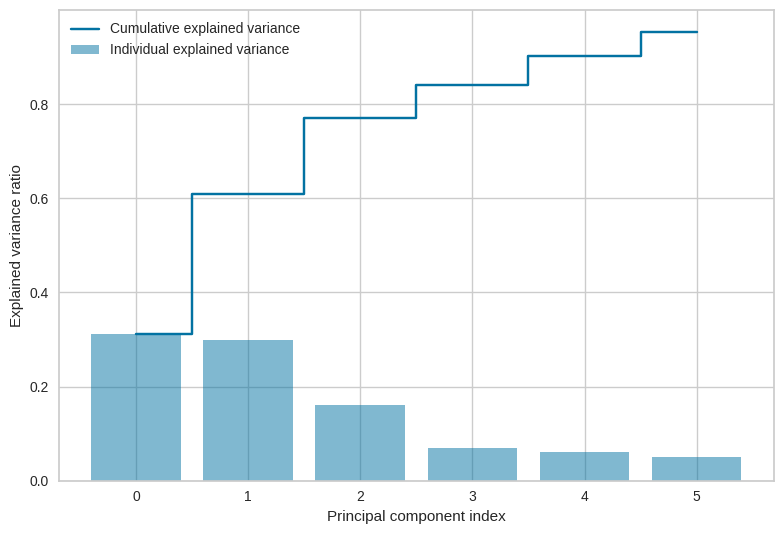

In [ ]:
cum_sum_eigenvalues = np.cumsum(exp_var_pca)
#
# Create the visualization plot
#
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

hence form the above explained variance plot , the first 3 PCAs were chosen for clustring as they capture the most variance ( dimensionality reduction )

however for the clustering we are going to take the output of df2 pca since it included the loan_amount

however for the classification we are going to take the output of df3 pca since it excluded the loan_amount

In [ ]:
loan_labels=df[' loan_amount']
df_copy3[' loan_amount']=loan_labels
df_copy3.head()

,PC1,PC2,PC3,PC4,PC5,PC6,loan_amount
0,1.009052,0.004600,0.713661,-0.124865,0.045486,0.313103,0.755102
1,-1.001226,0.006911,-0.282497,-0.458174,-0.243739,-0.316994,0.303571
2,1.006836,-0.003273,0.774038,0.025895,0.510874,-0.161493,0.750000
3,1.007969,-0.003359,0.589108,0.126194,-0.150218,-0.206711,0.775510
4,-0.994173,-0.004867,0.653381,0.430599,0.548781,-0.358377,0.609694


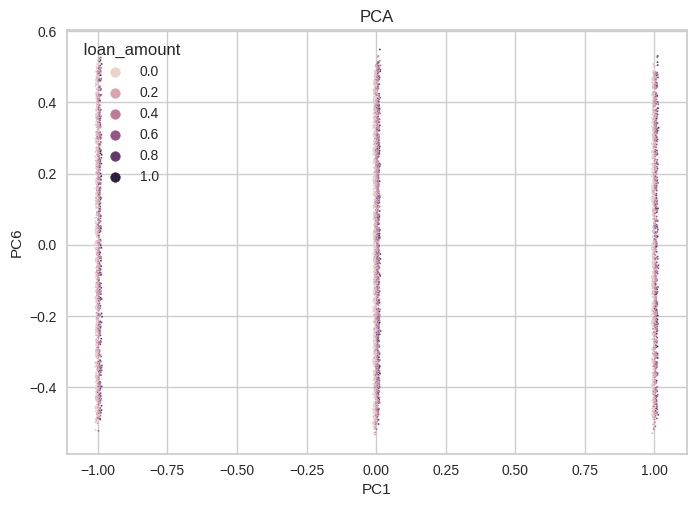

In [ ]:
import seaborn as sns
sns.scatterplot(x='PC1', y='PC6',hue=' loan_amount',s=2, data=df_copy3)
plt.title('PCA')
plt.show()

In [ ]:
df_copy3.drop(' loan_amount', axis=1, inplace=True)

# kmeans clustering

hence form the above explained variance plot , the first 3 PCAs were chosen for clustring as they capture the most variance ( dimensionality reduction )

however for the clustering we are going to take the output of df2 pca since it included the loan_amount

however for the classification we are going to take the output of df3 pca since it excluded the loan_amount

kmeans clustering for pca data

Kmeans clustering for data with principle components covering the most variance

In [ ]:
df_copy_clustering=df_copy.copy()

In [ ]:
df_copy_clustering

,PC1,PC2,PC3,PC4,PC5,PC6
0,-0.712979,0.927708,-0.022232,0.725918,-0.115003,0.083094
1,1.028656,-0.880453,0.021324,-0.299571,-0.468272,-0.286977
2,0.787847,1.113197,0.036380,0.756867,0.014414,0.481842
3,0.770593,1.112111,0.035834,0.572599,0.118002,-0.180000
4,1.105169,-0.863490,0.035993,0.633505,0.414138,0.501199
...,...,...,...,...,...,...
4264,0.941763,0.111164,1.020405,-0.748125,0.485846,0.070796
4265,-0.335704,-1.054318,-0.027077,-0.312814,-0.565799,0.413103
4266,0.955920,0.123543,-0.973262,0.324876,-0.162695,0.320477
4267,-0.574662,-0.070889,-1.027051,-0.115214,-0.268015,-0.154792


The first three principal captured the most variance , hence the last 3 principal components were dropped and we fed the clustering the first 3 pricipal compinents only

In [ ]:
df_copy_clustering.drop('PC4', axis=1, inplace=True)

In [ ]:
df_copy_clustering.drop('PC5', axis=1, inplace=True)
df_copy_clustering.drop('PC6', axis=1, inplace=True)

In [ ]:
df_copy_clustering.head()

,PC1,PC2,PC3
0,-0.712979,0.927708,-0.022232
1,1.028656,-0.880453,0.021324
2,0.787847,1.113197,0.036380
3,0.770593,1.112111,0.035834
4,1.105169,-0.863490,0.035993


Elbow method for kmeans

In [ ]:
df_kmeans_pca = df_copy.copy()
from sklearn.cluster import KMeans

wcss = []

for i in range(1, 20):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(df_copy_clustering)
    wcss.append(kmeans.inertia_)

Text(0, 0.5, 'WCSS')

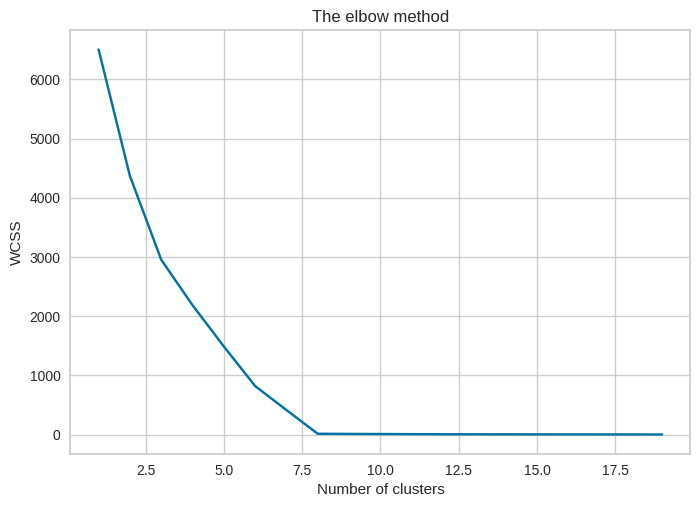

In [ ]:
plt.plot(range(1, 20), wcss, 'bx-')
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') #within cluster sum of squares

Silhouette score

In [ ]:
from sklearn.metrics import silhouette_score
avg_silhouette = []

for i in range(2, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(df_copy_clustering)
    cluster_labels = kmeans.labels_
    avg_silhouette.append(silhouette_score(df_copy_clustering, cluster_labels))

Text(0.5, 1.0, 'Silhouette analysis For Optimal k')

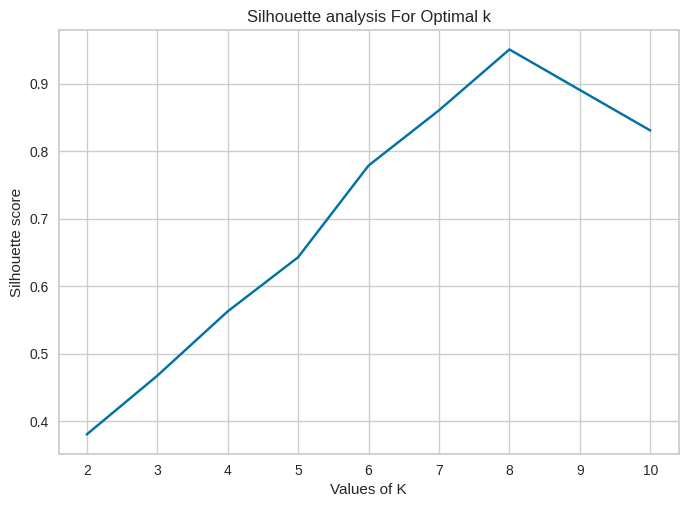

In [ ]:
plt.plot(range(2, 11),avg_silhouette, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k')

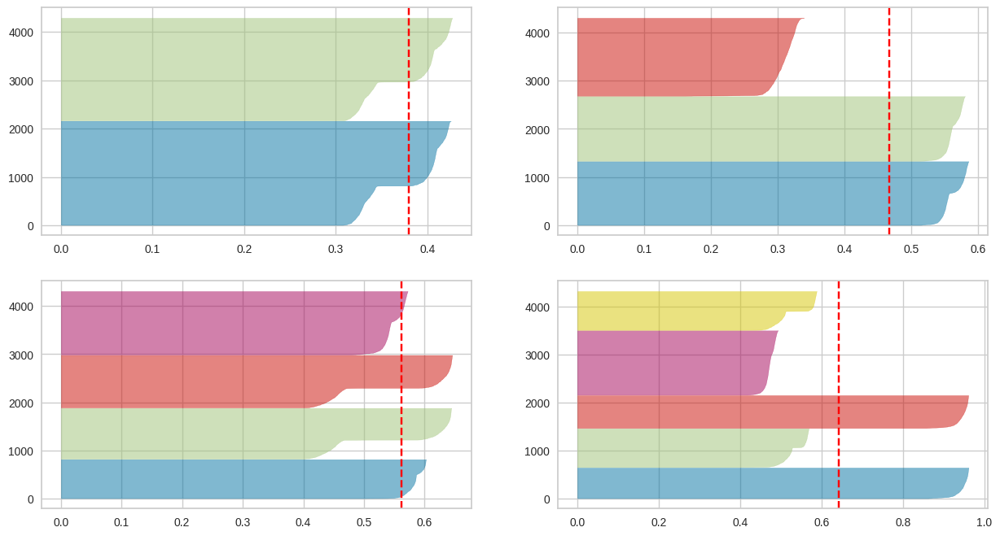

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in range(2, 6):
    '''
    Create KMeans instance for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=0)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(df_copy_clustering)

 davies_bouldin_score

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score
import numpy as np

avg_davis = []

for i in range(2, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(df_copy_clustering)
    cluster_labels = kmeans.labels_
    avg_davis.append(davies_bouldin_score(df_copy_clustering,  cluster_labels))

Text(0.5, 1.0, 'avg_davis e analysis For Optimal k')

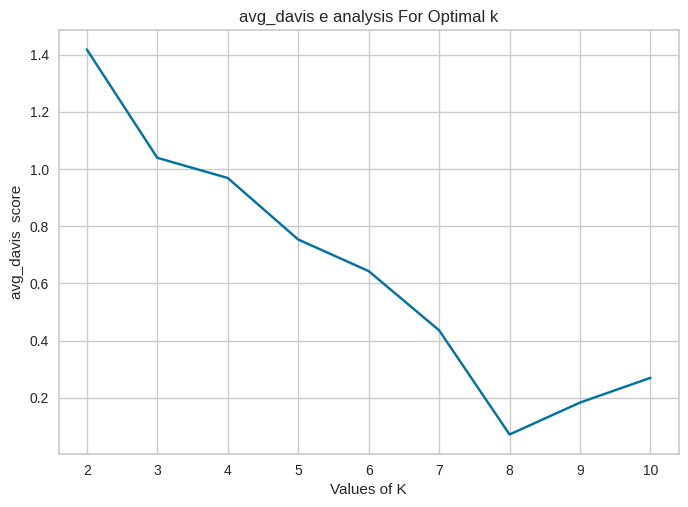

In [ ]:
plt.plot(range(2, 11),avg_davis , 'bx-')
plt.xlabel('Values of K')
plt.ylabel('avg_davis  score')
plt.title('avg_davis e analysis For Optimal k')

Dunn index

In [ ]:
import numpy as np
from scipy.spatial.distance import pdist, squareform
from sklearn.cluster import KMeans

def compute_dunn_index(data, labels):
    # Compute pairwise distance matrix
    distance_matrix = squareform(pdist(data))

    # Compute within-cluster scatter (compactness)
    compactness = 0
    for label in np.unique(labels):
        cluster_points = data[labels == label]
        compactness += np.mean(pdist(cluster_points))

    # Compute between-cluster separation
    separation = np.min(distance_matrix[labels != labels[:, None]])

    # Compute Dunn index
    dunn_index = separation / compactness

    return dunn_index



# Compute Dunn index
#dunn_index = compute_dunn_index(df_copy, clusters)
#print("Dunn Index:", dunn_index)

In [ ]:
avg_dunn = []

for i in range(2, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(df_copy_clustering)
    cluster_labels = kmeans.labels_
    avg_dunn.append( compute_dunn_index(df_copy_clustering,  cluster_labels))

Text(0.5, 1.0, 'avg_dunn e analysis For Optimal k')

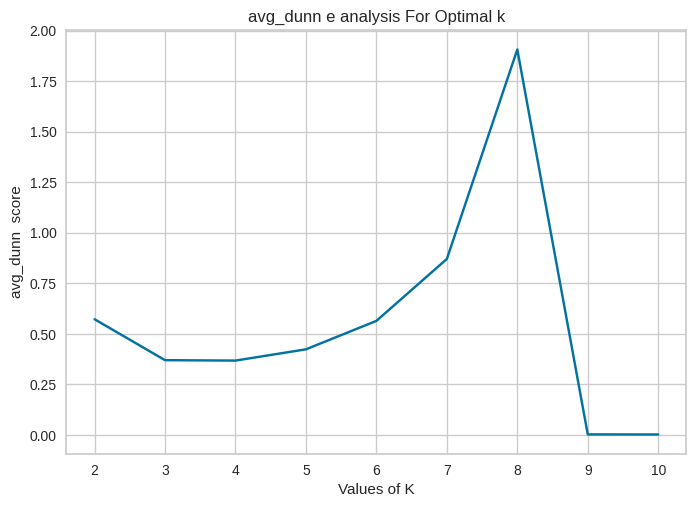

In [ ]:
plt.plot(range(2, 11),avg_dunn , 'bx-')
plt.xlabel('Values of K')
plt.ylabel('avg_dunn  score')
plt.title('avg_dunn e analysis For Optimal k')

kmeans clustering with k =4

In [ ]:
from sklearn import datasets
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score
km = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
y = km.fit_predict(df_copy_clustering)
clusters = km.labels_
score = silhouette_score(df_copy_clustering, km.labels_)

print('Silhouetter Score: %.3f' % score)



print(davies_bouldin_score(df_copy_clustering, clusters))
dunn_index = compute_dunn_index(df_copy_clustering, clusters)
print("Dunn Index:", dunn_index)

Silhouetter Score: 0.562
0.9686795331539222
Dunn Index: 0.36811039256373923


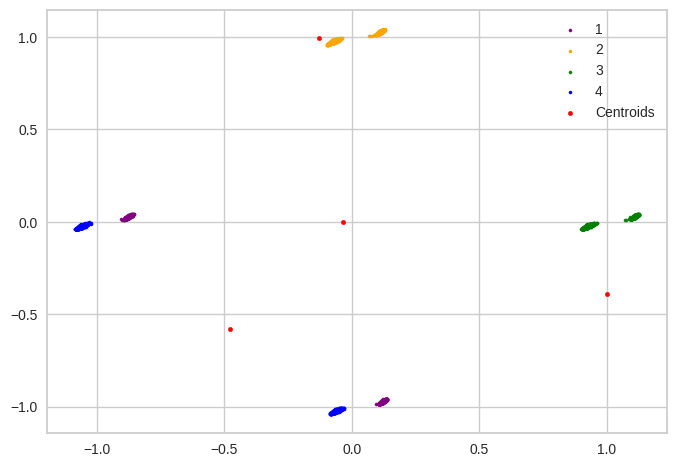

In [ ]:
plt.scatter(df_copy_clustering.iloc[clusters == 0,1], df_copy_clustering.iloc[clusters == 0,2], s = 5, c = 'purple',label = '1')
plt.scatter(df_copy_clustering.iloc[clusters == 1,1], df_copy_clustering.iloc[clusters == 1,2], s = 5, c = 'orange',label = '2')
plt.scatter(df_copy_clustering.iloc[clusters == 2,1], df_copy_clustering.iloc[clusters == 2,2], s = 5, c = 'green', label = '3')
plt.scatter(df_copy_clustering.iloc[clusters == 3,1], df_copy_clustering.iloc[clusters == 3,2], s = 5, c = 'blue', label = '4')

#Plotting the centroids of the clusters
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

k-means,k=3

In [ ]:
from sklearn import datasets
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score
km = KMeans(n_clusters=2, init='k-means++', max_iter=300, n_init=10, random_state=0)
y = km.fit_predict(df_copy_clustering)
clusters = km.labels_
score = silhouette_score(df_copy_clustering, km.labels_)

print('Silhouetter Score: %.3f' % score)



print(davies_bouldin_score(df_copy_clustering, clusters))
dunn_index = compute_dunn_index(df_copy_clustering, clusters)
print("Dunn Index:", dunn_index)

Silhouetter Score: 0.380
1.418051606228362
Dunn Index: 0.5725631164011099


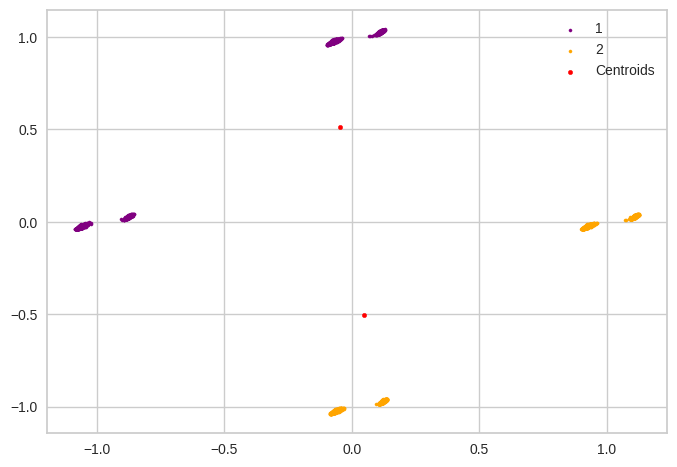

In [ ]:
plt.scatter(df_copy_clustering.iloc[clusters == 0,1], df_copy_clustering.iloc[clusters == 0,2], s = 5, c = 'purple',label = '1')
plt.scatter(df_copy_clustering.iloc[clusters == 1,1], df_copy_clustering.iloc[clusters == 1,2], s = 5, c = 'orange',label = '2')
#plt.scatter(df_copy_clustering.iloc[clusters == 2,1], df_copy_clustering.iloc[clusters == 2,2], s = 5, c = 'green', label = '3')
#plt.scatter(df_copy.iloc[clusters == 3,2], df_copy.iloc[clusters == 3,2], s = 5, c = 'blue', label = '4')

#Plotting the centroids of the clusters
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

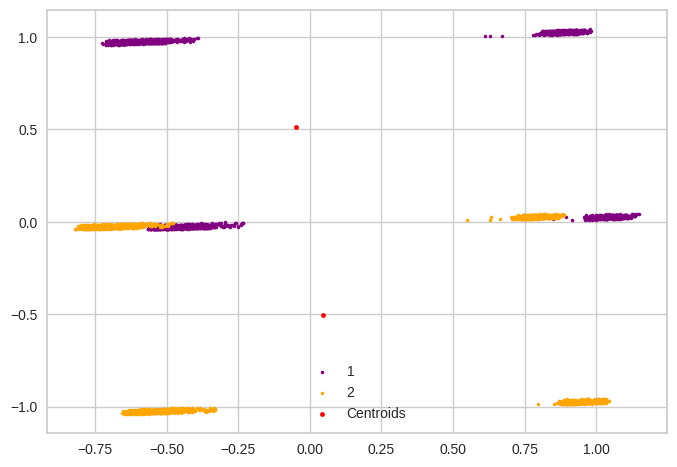

In [ ]:
plt.scatter(df_copy_clustering.iloc[clusters == 0,0], df_copy_clustering.iloc[clusters == 0,2], s = 5, c = 'purple',label = '1')
plt.scatter(df_copy_clustering.iloc[clusters == 1,0], df_copy_clustering.iloc[clusters == 1,2], s = 5, c = 'orange',label = '2')
#plt.scatter(df_copy_clustering.iloc[clusters == 2,1], df_copy_clustering.iloc[clusters == 2,0], s = 5, c = 'green', label = '3')


#Plotting the centroids of the clusters
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

In [ ]:
from sklearn import datasets
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score
km = KMeans(n_clusters=5, init='k-means++', max_iter=300, n_init=10, random_state=0)
y = km.fit_predict(df_copy_clustering)
clusters = km.labels_
score = silhouette_score(df_copy_clustering, km.labels_)

print('Silhouetter Score: %.3f' % score)



print(davies_bouldin_score(df_copy_clustering, clusters))
dunn_index = compute_dunn_index(df_copy_clustering, clusters)
print("Dunn Index:", dunn_index)

Silhouetter Score: 0.643
0.7535778872177211
Dunn Index: 0.4237263041184443


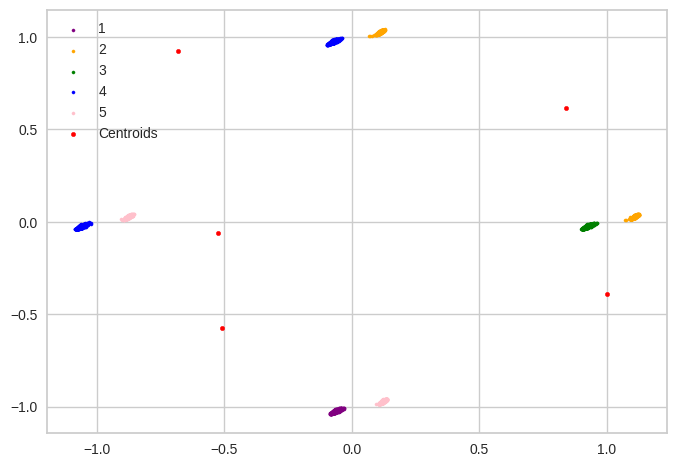

In [ ]:
plt.scatter(df_copy_clustering.iloc[clusters == 0,1], df_copy_clustering.iloc[clusters == 0,2], s = 5, c = 'purple',label = '1')
plt.scatter(df_copy_clustering.iloc[clusters == 1,1], df_copy_clustering.iloc[clusters == 1,2], s = 5, c = 'orange',label = '2')
plt.scatter(df_copy_clustering.iloc[clusters == 2,1], df_copy_clustering.iloc[clusters == 2,2], s = 5, c = 'green', label = '3')
plt.scatter(df_copy_clustering.iloc[clusters == 3,1], df_copy_clustering.iloc[clusters == 3,2], s = 5, c = 'blue', label = '4')
plt.scatter(df_copy_clustering.iloc[clusters == 4,1], df_copy_clustering.iloc[clusters == 4,2], s = 5, c = 'pink', label = '5')

#Plotting the centroids of the clusters
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

upon comparison 2 is the optimal choice

kmeans for normal data frame

In [ ]:
df_kmeans_pca = df.copy()
from sklearn.cluster import KMeans

wcss = []

for i in range(1, 20):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(df)
    wcss.append(kmeans.inertia_)

Text(0, 0.5, 'WCSS')

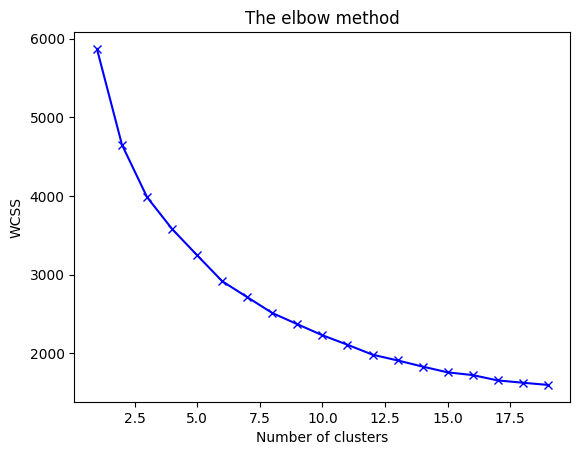

In [ ]:
plt.plot(range(1, 20), wcss, 'bx-')
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') #within cluster sum of squares

In [ ]:
from sklearn.metrics import silhouette_score
avg_silhouette = []

for i in range(2, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(df)
    cluster_labels = kmeans.labels_
    avg_silhouette.append(silhouette_score(df, cluster_labels))

Text(0.5, 1.0, 'Silhouette analysis For Optimal k')

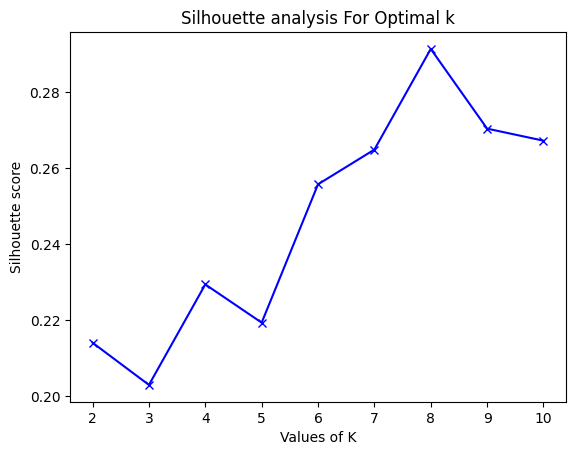

In [ ]:
plt.plot(range(2, 11),avg_silhouette, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k')

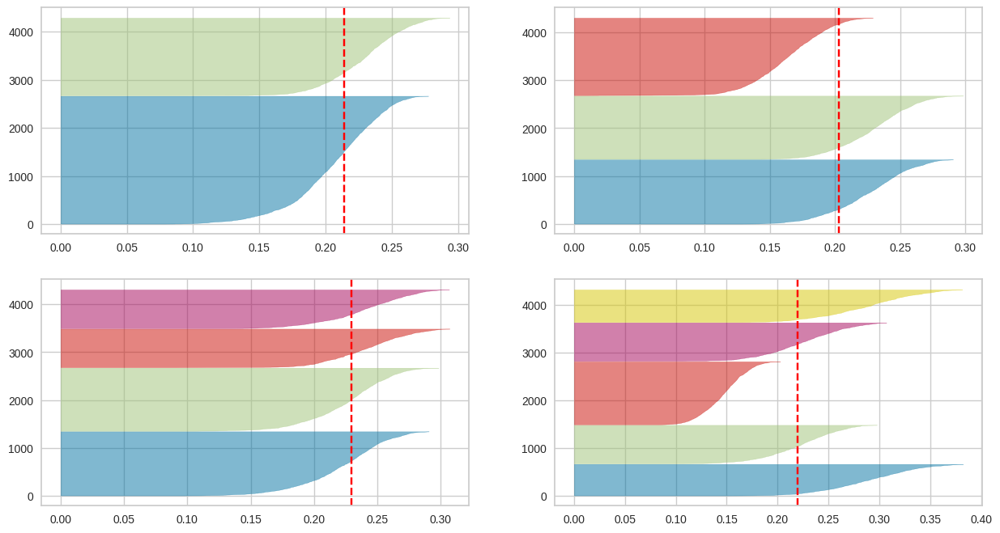

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in range(2, 6):
    '''
    Create KMeans instance for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=0)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(df)

In [ ]:
avg_davis = []

for i in range(2, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(df)
    cluster_labels = kmeans.labels_
    avg_davis.append(davies_bouldin_score(df,  cluster_labels))

Text(0.5, 1.0, 'Davis analysis For Optimal k')

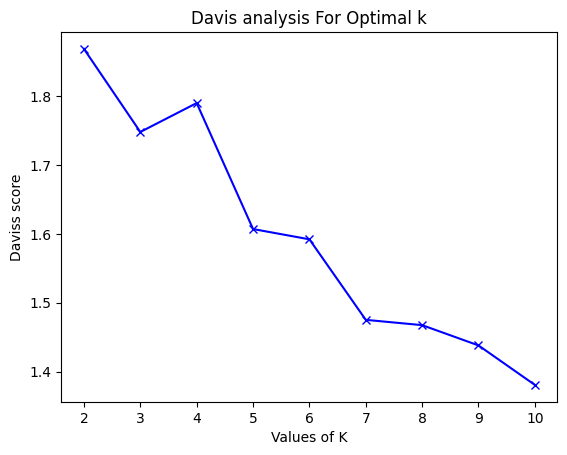

In [ ]:
plt.plot(range(2, 11),avg_davis, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Daviss score')
plt.title('Davis analysis For Optimal k')

In [ ]:
avg_dunn = []

for i in range(2, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(df)
    cluster_labels = kmeans.labels_
    avg_dunn.append( compute_dunn_index(df,  cluster_labels))

Text(0.5, 1.0, 'Dunn analysis For Optimal k')

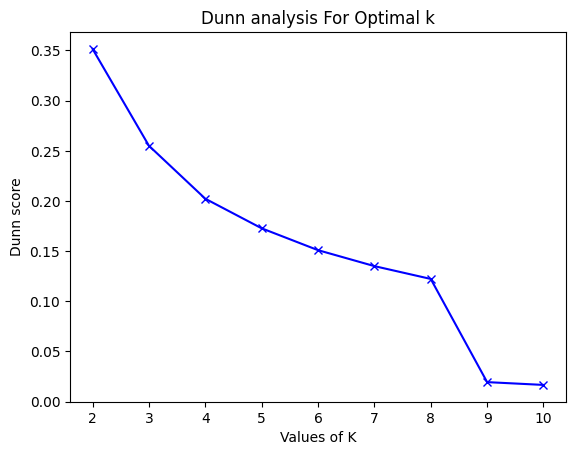

In [ ]:
plt.plot(range(2, 11),avg_dunn, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Dunn score')
plt.title('Dunn analysis For Optimal k')

Clustering with k-means =2 ,upon clustering multiple feature with the loan , it was shown that 2 clusters for loan_status 0 and loan_status 1

clustering among other features with k=2 showed overlapping clusters

In [ ]:
from sklearn import datasets
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score
km = KMeans(n_clusters=2, init='k-means++', max_iter=300, n_init=10, random_state=0)
y = km.fit_predict(df)
clusters = km.labels_
score = silhouette_score(df, km.labels_)

print('Silhouetter Score: %.3f' % score)


print("Davis")
print(davies_bouldin_score(df, clusters))

dunn_index = compute_dunn_index(df, clusters)
print("Dunn Index:", dunn_index)

Silhouetter Score: 0.214
Davis
1.8682798202350588
Dunn Index: 0.35156868666631336


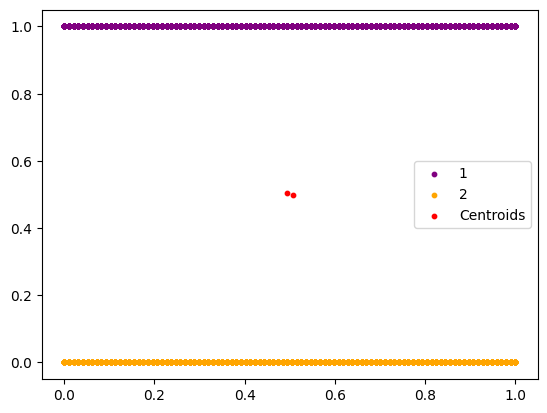

In [ ]:
plt.scatter(df.iloc[clusters == 0,3], df.iloc[clusters == 0,-1], s = 10, c = 'purple',label = '1')
plt.scatter(df.iloc[clusters == 1,3], df.iloc[clusters == 1,-1], s = 10, c = 'orange',label = '2')
# plt.scatter(df.iloc[clusters == 2,3], df.iloc[clusters == 2,-1], s = 10, c = 'cyan',label = '3')
# plt.scatter(df.iloc[clusters == 3,3], df.iloc[clusters == 3,-1], s = 10, c = 'black',label = '3')


#Plotting the centroids of the clusters
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

In [ ]:
from sklearn import datasets
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score
km = KMeans(n_clusters=2, init='k-means++', max_iter=300, n_init=10, random_state=0)
y = km.fit_predict(df)
clusters = km.labels_
score = silhouette_score(df, km.labels_)

print('Silhouetter Score: %.3f' % score)


print("Davis")
print(davies_bouldin_score(df, clusters))

dunn_index = compute_dunn_index(df, clusters)
print("Dunn Index:", dunn_index)

Silhouetter Score: 0.214
Davis
1.8682798202350588
Dunn Index: 0.35156868666631336


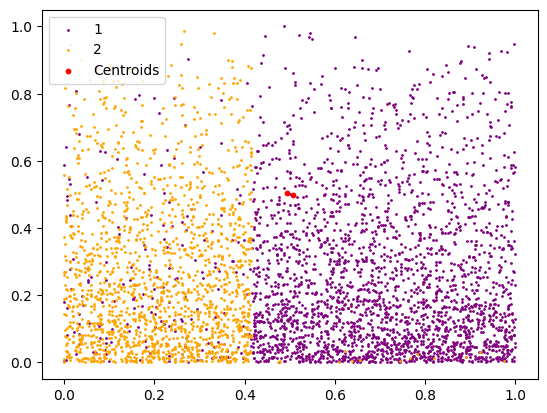

In [ ]:
plt.scatter(df.iloc[clusters == 0,6], df.iloc[clusters == 0,7], s = 1, c = 'purple',label = '1')
plt.scatter(df.iloc[clusters == 1,6], df.iloc[clusters == 1,7], s = 1, c = 'orange',label = '2')
#plt.scatter(df.iloc[clusters == 2,6], df.iloc[clusters == 2,7], s = 1, c = 'cyan',label = '3')
#plt.scatter(df.iloc[clusters == 3,6], df.iloc[clusters == 3,7], s = 1, c = 'black',label = '4')


#Plotting the centroids of the clusters
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

Among clustering with k=4, scattered clusters were present

In [ ]:
# from enum import auto
from sklearn import datasets
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score
km = KMeans(n_clusters=4, init='k-means++', n_init='auto', random_state=0)
y = km.fit_predict(df)
clusters = km.labels_
score = silhouette_score(df, km.labels_)

print('Silhouetter Score: %.3f' % score)


print("Davis")
print(davies_bouldin_score(df, clusters))

dunn_index = compute_dunn_index(df, clusters)
print("Dunn Index:", dunn_index)

Silhouetter Score: 0.229
Davis
1.7899080292928828
Dunn Index: 0.20225990419360604


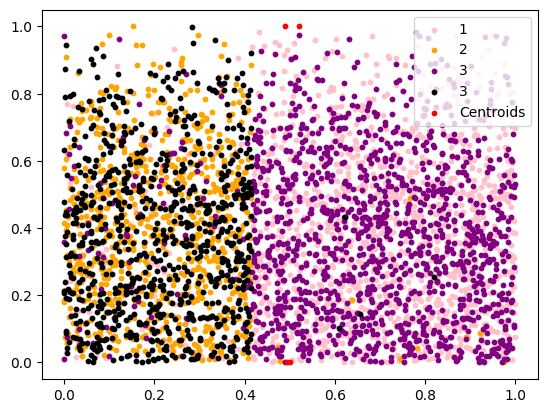

In [ ]:
plt.scatter(df.iloc[clusters == 0,6], df.iloc[clusters == 0,9], s = 10, c = 'pink',label = '1')
plt.scatter(df.iloc[clusters == 1,6], df.iloc[clusters == 1,9], s = 10, c = 'orange',label = '2')
plt.scatter(df.iloc[clusters == 2,6], df.iloc[clusters == 2,9], s = 10, c = 'purple',label = '3')
plt.scatter(df.iloc[clusters == 3,6], df.iloc[clusters == 3,9], s = 10, c = 'black',label = '3')



#Plotting the centroids of the clusters
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

# K means clustering for the reduced features version

In [ ]:
#df_kmeans_pca = df.copy()
from sklearn.cluster import KMeans

wcss = []

for i in range(1, 20):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(df_features_reduced)
    wcss.append(kmeans.inertia_)

Text(0, 0.5, 'WCSS')

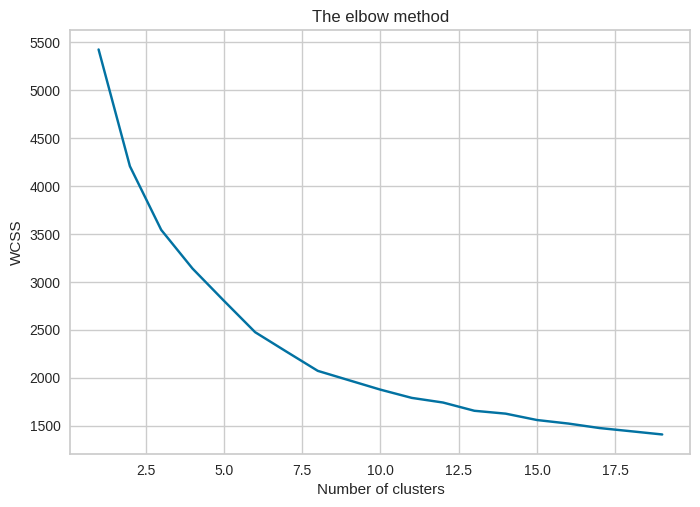

In [ ]:
plt.plot(range(1, 20), wcss, 'bx-')
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') #within cluster sum of squares

In [ ]:
from sklearn.metrics import silhouette_score
avg_silhouette = []

for i in range(2, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(df_features_reduced)
    cluster_labels = kmeans.labels_
    avg_silhouette.append(silhouette_score(df_features_reduced, cluster_labels))

Text(0.5, 1.0, 'Silhouette analysis For Optimal k')

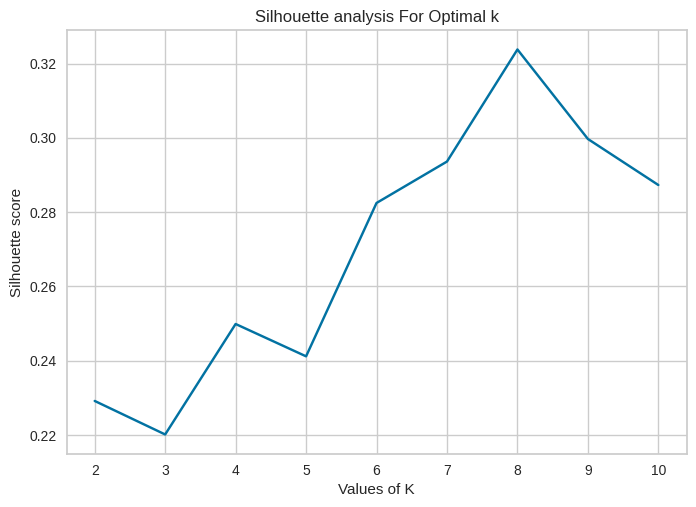

In [ ]:
plt.plot(range(2, 11),avg_silhouette, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k')

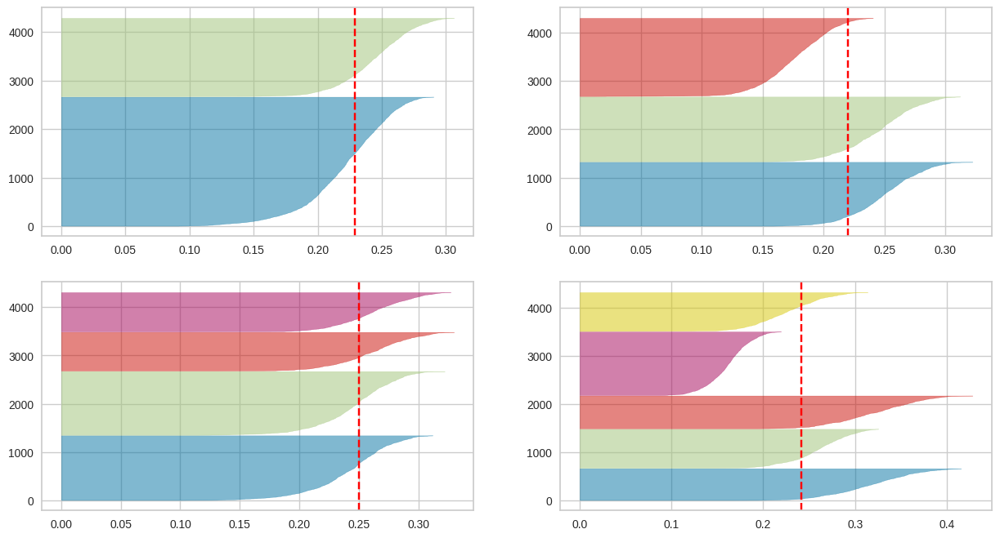

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in range(2, 6):
    '''
    Create KMeans instance for different number of clusters
    '''
    km = KMeans(n_clusters=i, init='k-means++', n_init=10, max_iter=100, random_state=0)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(df_features_reduced)

In [ ]:
avg_davis = []

for i in range(2, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(df_features_reduced)
    cluster_labels = kmeans.labels_
    avg_davis.append(davies_bouldin_score(df_features_reduced,  cluster_labels))


Text(0.5, 1.0, 'Davis analysis For Optimal k')

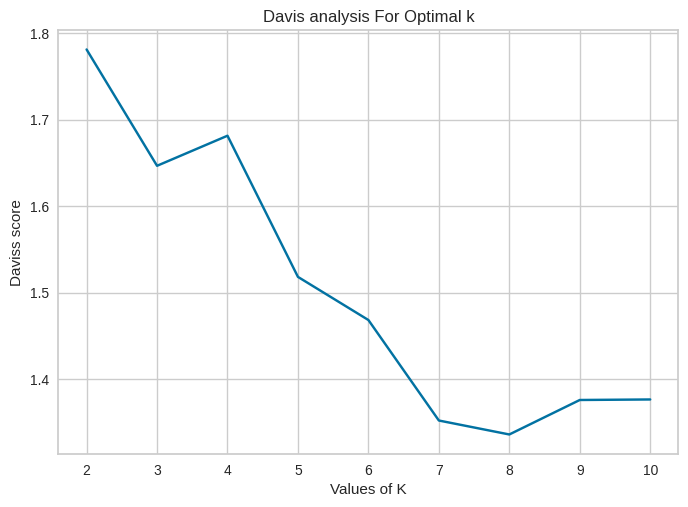

In [ ]:
plt.plot(range(2, 11),avg_davis, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Daviss score')
plt.title('Davis analysis For Optimal k')

In [ ]:
avg_dunn = []

for i in range(2, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(df_features_reduced)
    cluster_labels = kmeans.labels_
    avg_dunn.append( compute_dunn_index(df_features_reduced,  cluster_labels))

Text(0.5, 1.0, 'avg_dunn analysis For Optimal k')

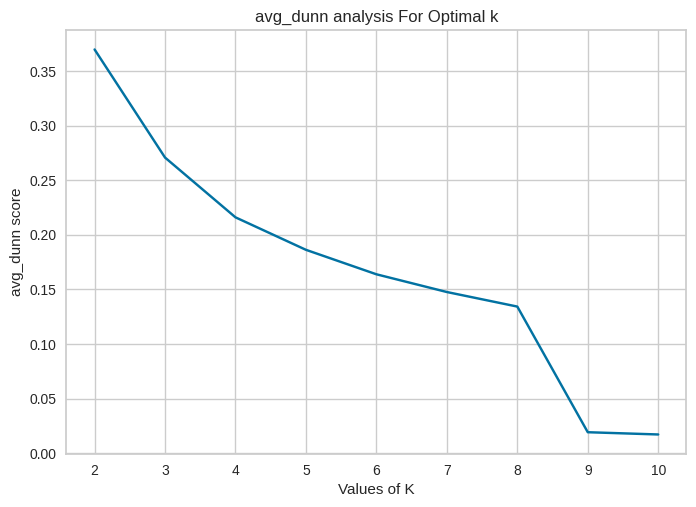

In [ ]:
plt.plot(range(2, 11),avg_dunn, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('avg_dunn score')
plt.title('avg_dunn analysis For Optimal k')

per the graph the average shilouette improved and the dunn and davis as well with slight improvement

kmeans with 4 clusters

In [ ]:
# from enum import auto
from sklearn import datasets
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score
km = KMeans(n_clusters=4, init='k-means++', n_init='auto', random_state=0)
y = km.fit_predict(df_features_reduced)
clusters = km.labels_
score = silhouette_score(df_features_reduced, km.labels_)

print('Silhouetter Score: %.3f' % score)


print("Davis")
print(davies_bouldin_score(df_features_reduced, clusters))

dunn_index = compute_dunn_index(df_features_reduced, clusters)
print("Dunn Index:", dunn_index)

Silhouetter Score: 0.250
Davis
1.681597849607702
Dunn Index: 0.21601847761167914


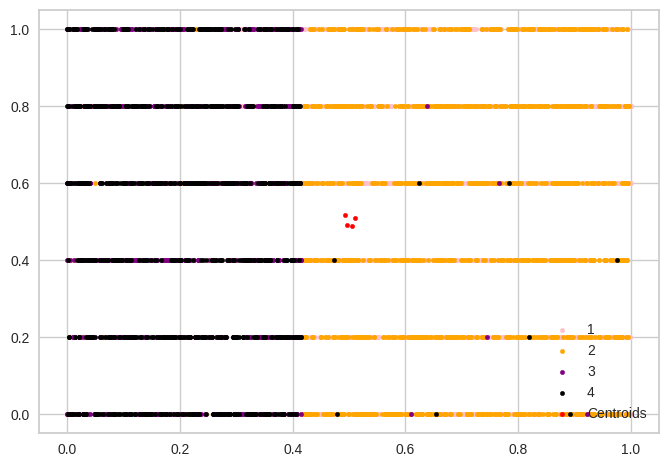

In [ ]:
plt.scatter(df_features_reduced.iloc[clusters == 0,6], df_features_reduced.iloc[clusters == 0,0], s = 10, c = 'pink',label = '1')
plt.scatter(df_features_reduced.iloc[clusters == 1,6], df_features_reduced.iloc[clusters == 1,0], s = 10, c = 'orange',label = '2')
plt.scatter(df_features_reduced.iloc[clusters == 2,6], df_features_reduced.iloc[clusters == 2,0], s = 10, c = 'purple',label = '3')
plt.scatter(df_features_reduced.iloc[clusters == 3,6], df_features_reduced.iloc[clusters == 3,0], s = 10, c = 'black',label = '4')



#Plotting the centroids of the clusters
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

In [ ]:
from sklearn import datasets
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score
km = KMeans(n_clusters=2, init='k-means++', n_init='auto', random_state=0)
y = km.fit_predict(df_features_reduced)
clusters = km.labels_
score = silhouette_score(df_features_reduced, km.labels_)

print('Silhouetter Score: %.3f' % score)


print("Davis")
print(davies_bouldin_score(df_features_reduced, clusters))

dunn_index = compute_dunn_index(df_features_reduced, clusters)
print("Dunn Index:", dunn_index)

Silhouetter Score: 0.199
Davis
2.001411199991264
Dunn Index: 0.36267835154970307


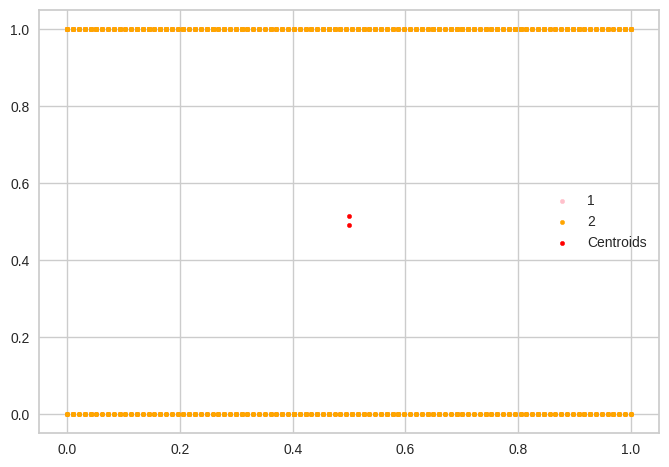

In [ ]:
plt.scatter(df_features_reduced.iloc[clusters == 0,3], df_features_reduced.iloc[clusters == 0,-1], s = 10, c = 'pink',label = '1')
plt.scatter(df_features_reduced.iloc[clusters == 1,3], df_features_reduced.iloc[clusters == 1,-1], s = 10, c = 'orange',label = '2')
# plt.scatter(df_features_reduced.iloc[clusters == 2,6], df_features_reduced.iloc[clusters == 2,0], s = 10, c = 'purple',label = '3')
# plt.scatter(df_features_reduced.iloc[clusters == 3,6], df_features_reduced.iloc[clusters == 3,0], s = 10, c = 'black',label = '4')



#Plotting the centroids of the clusters
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

compare this graph with the corresponding one without feature extraction, the one without feature extraction out performed the reduced feature version

K-mode clustering

K-mode clustering for pca data

In [ ]:
pip install kmodes

In [ ]:
from sklearn import datasets
import numpy as np
from kmodes.kmodes import KModes
cost = []
K = range(1,5)
for num_clusters in list(K):
    kmode = KModes(n_clusters=num_clusters, init = "random", n_init = 5, verbose=1)
    kmode.fit_predict(df_copy_clustering)
    cost.append(kmode.cost_)

Text(0.5, 1.0, 'Elbow Method For Optimal k')

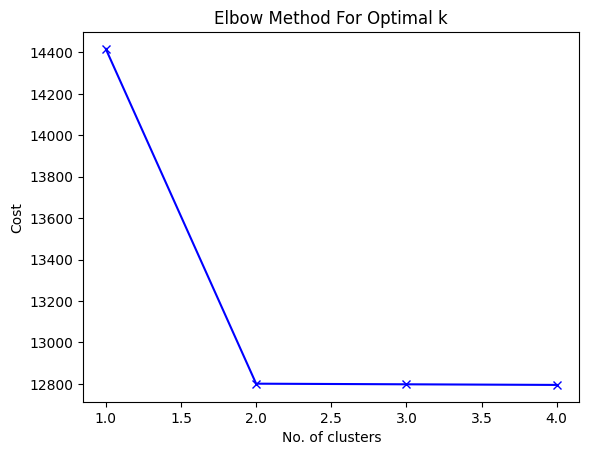

In [ ]:
plt.plot(range(1,5), cost, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')

In [ ]:
from sklearn.metrics import silhouette_score
avg_silhouette = []

for i in range(2, 11):
  kmode = KModes(n_clusters=i, init = "random", n_init = 5, verbose=1)
  kmode.fit_predict(df_copy_clustering)
  cluster_labels = kmode.labels_
  avg_silhouette.append(silhouette_score(df_copy_clustering, cluster_labels))

Text(0.5, 1.0, 'Silhouette analysis For Optimal k')

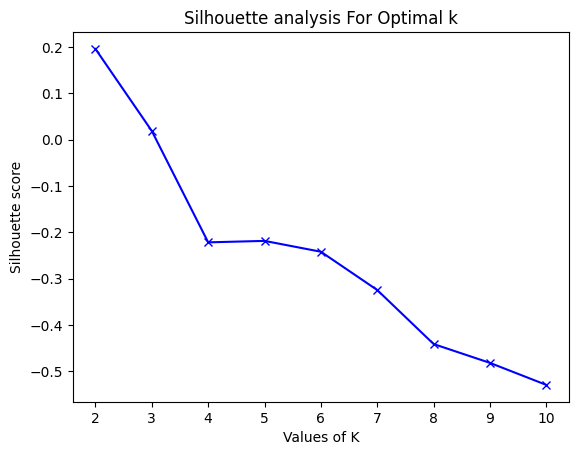

In [ ]:
plt.plot(range(2, 11),avg_silhouette, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k')

In [ ]:
avg_davis = []

for i in range(2, 11):
  kmode = KModes(n_clusters=i, init = "random", n_init = 5, verbose=1)
  kmode.fit_predict(df_copy_clustering)
  cluster_labels = kmode.labels_
  avg_davis.append(davies_bouldin_score(df_copy_clustering, cluster_labels))

Text(0.5, 1.0, 'avg_davis analysis For Optimal k')

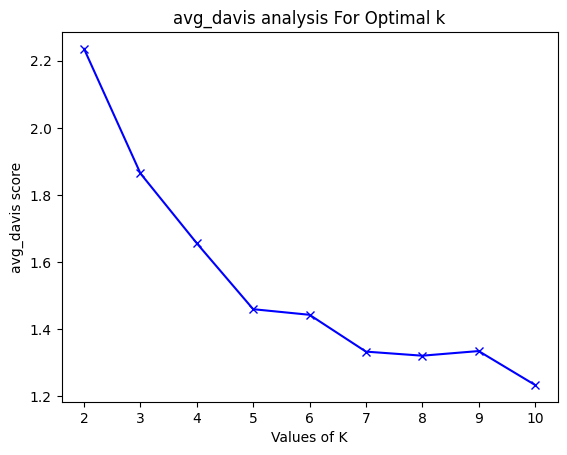

In [ ]:
plt.plot(range(2, 11),avg_davis, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('avg_davis score')
plt.title('avg_davis analysis For Optimal k')

In [ ]:
avg_dunn = []

for i in range(2, 11):
  kmode = KModes(n_clusters=i, init = "random", n_init = 5, verbose=1)
  kmode.fit_predict(df_copy_clustering)
  cluster_labels = kmode.labels_
  avg_dunn.append(compute_dunn_index(df_copy_clustering, cluster_labels))

In [ ]:
for i in range (len(avg_dunn)):
  if avg_dunn[i]!= 0.3408099585288609:
    avg_dunn[i]=0



In [ ]:
avg_dunn

[0.3408099585288609, 0, 0, 0, 0, 0, 0, 0, 0]

Text(0.5, 1.0, 'avg_dunn analysis For Optimal k')

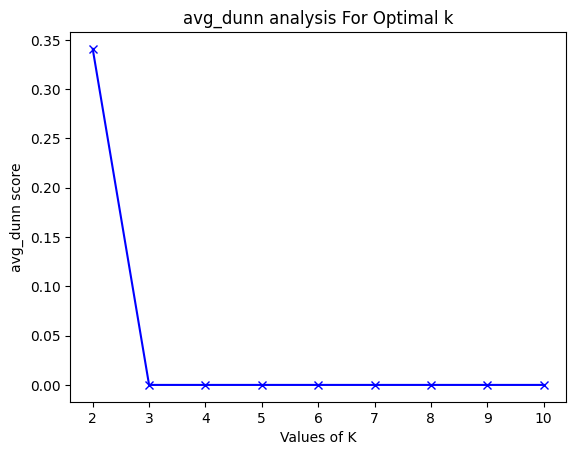

In [ ]:
plt.plot(range(2, 11),avg_dunn, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('avg_dunn score')
plt.title('avg_dunn analysis For Optimal k')

In [ ]:
kmode = KModes(n_clusters=2, init = "random", n_init = 5, verbose=1)
clusters = kmode.fit_predict(df_copy_clustering)

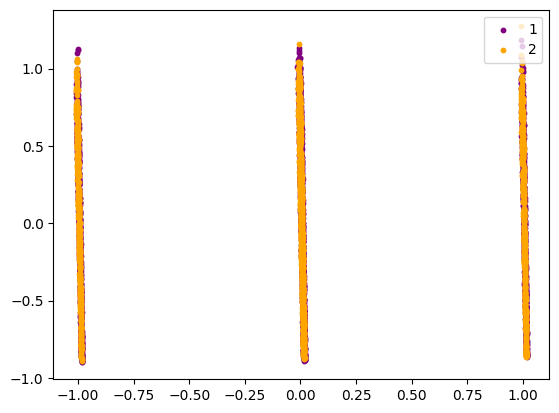

In [ ]:
plt.scatter(df_copy_clustering.iloc[clusters == 0, 1], df_copy_clustering.iloc[clusters == 0, 2], s = 10, c = 'purple',label = '1')
plt.scatter(df_copy_clustering.iloc[clusters == 1,1 ], df_copy_clustering.iloc[clusters == 1, 2], s = 10, c = 'orange',label = '2')
# plt.scatter(df_copy.iloc[clusters == 2, 6], df_copy.iloc[clusters == 2, 1], s = 10, c = 'pink',label = '1')
# plt.scatter(df_copy.iloc[clusters == 3, 0], df_copy.iloc[clusters == 3, 1], s = 10, c = 'cyan',label = '2')


#Plotting the centroids of the clusters
#plt.scatter(kmode.cluster_centers_[:, 0], kmode.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

In [ ]:
df

,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
0,0.4,1,0,0.969072,0.755102,0.555556,0.796667,0.082474,0.907216,0.575835,0.544218,1
1,0.0,0,1,0.402062,0.303571,0.333333,0.195000,0.092784,0.113402,0.218509,0.224490,0
2,0.6,1,0,0.917526,0.750000,1.000000,0.343333,0.243986,0.231959,0.848329,0.870748,0
3,0.6,1,0,0.824742,0.775510,0.333333,0.278333,0.625430,0.170103,0.591260,0.537415,0
4,1.0,0,1,0.989691,0.609694,1.000000,0.136667,0.426117,0.422680,0.748072,0.340136,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4264,1.0,1,1,0.082474,0.051020,0.555556,0.028333,0.096220,0.025773,0.077121,0.054422,0
4265,0.0,0,1,0.319588,0.280612,1.000000,0.431667,0.144330,0.149485,0.275064,0.129252,1
4266,0.4,0,0,0.649485,0.602041,0.888889,0.261667,0.041237,0.639175,0.457584,0.496599,0
4267,0.2,0,0,0.402062,0.318878,0.333333,0.800000,0.281787,0.036082,0.354756,0.394558,1


In [ ]:
from sklearn import datasets
import numpy as np
from kmodes.kmodes import KModes
cost = []
avg_davis=[]
avg_dunn=[]
avg_silhouette=[]
K = range(1,5)
for num_clusters in list(K):
    kmode = KModes(n_clusters=num_clusters, init = "random", n_init = 5, verbose=1)
    kmode.fit_predict(df)
    cost.append(kmode.cost_)
    cluster_labels = kmode.labels_
    # avg_davis.append(davies_bouldin_score(df, cluster_labels))
    # avg_dunn.append(compute_dunn_index(df, cluster_labels))
    # avg_silhouette.append(silhouette_score(df, cluster_labels))

Text(0.5, 1.0, 'Elbow Method For Optimal k')

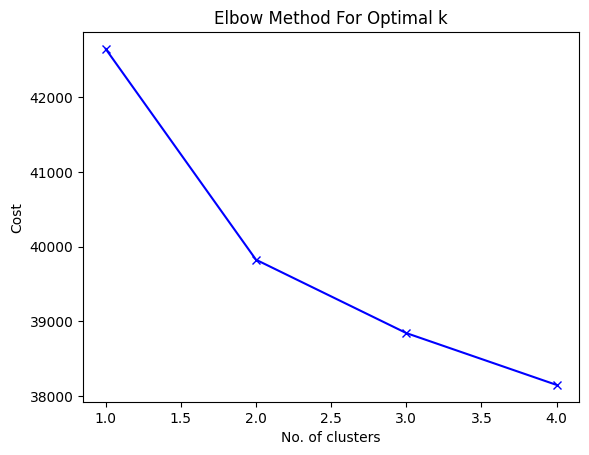

In [ ]:
plt.plot(range(1,5), cost, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')

In [ ]:
from sklearn.metrics import silhouette_score
avg_silhouette = []

for i in range(2, 11):
  kmode = KModes(n_clusters=i, init = "random", n_init = 5, verbose=1)
  kmode.fit_predict(df)
  cluster_labels = kmode.labels_
  avg_silhouette.append(silhouette_score(df, cluster_labels))


Text(0.5, 1.0, 'Silhouette analysis For Optimal k')

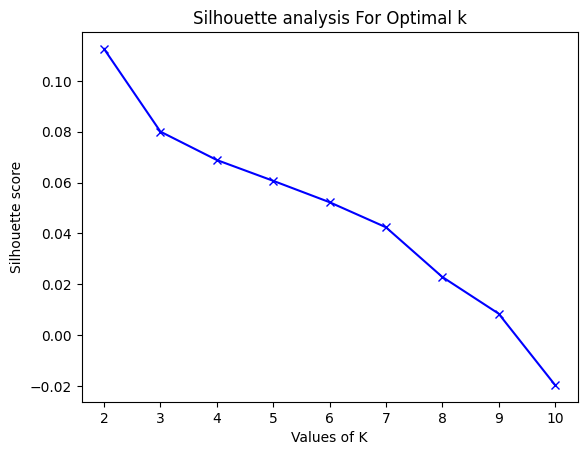

In [ ]:
plt.plot(range(2, 11),avg_silhouette, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k')


In [ ]:
avg_davis = []

for i in range(2, 11):
  kmode = KModes(n_clusters=i, init = "random", n_init = 5, verbose=1)
  kmode.fit_predict(df)
  cluster_labels = kmode.labels_
  avg_davis.append(davies_bouldin_score(df, cluster_labels))




Text(0.5, 1.0, 'avg_davis analysis For Optimal k')

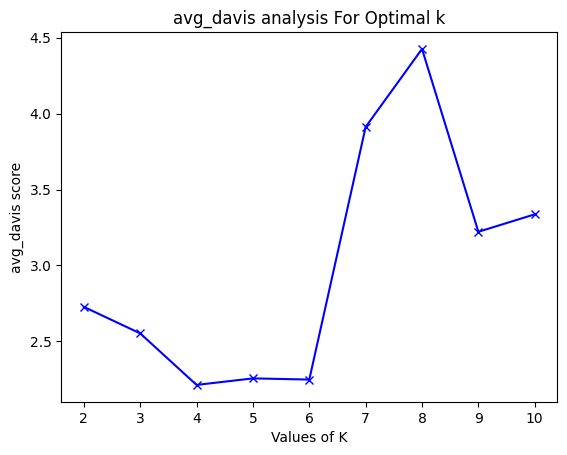

In [ ]:
plt.plot(range(2, 11),avg_davis, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('avg_davis score')
plt.title('avg_davis analysis For Optimal k')

In [ ]:
avg_dunn = []

for i in range(2, 11):
  kmode = KModes(n_clusters=i, init = "random", n_init = 5, verbose=1)
  kmode.fit_predict(df)
  cluster_labels = kmode.labels_
  avg_dunn.append(compute_dunn_index(df, cluster_labels))

Text(0.5, 1.0, 'avg_dunn analysis For Optimal k')

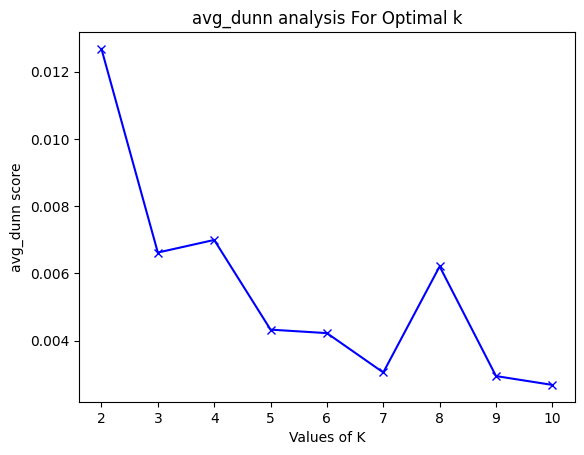

In [ ]:
plt.plot(range(2, 11),avg_dunn, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('avg_dunn score')
plt.title('avg_dunn analysis For Optimal k')

In [ ]:

kmode = KModes(n_clusters=3, init = "random", n_init = 5, verbose=1)
clusters = kmode.fit_predict(df)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 1017, cost: 38896.0
Run 1, iteration: 2/100, moves: 22, cost: 38896.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 469, cost: 39062.0
Run 2, iteration: 2/100, moves: 8, cost: 39062.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 192, cost: 39043.0
Run 3, iteration: 2/100, moves: 8, cost: 39043.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 1105, cost: 38934.0
Run 4, iteration: 2/100, moves: 25, cost: 38934.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 1442, cost: 38857.0
Run 5, iteration: 2/100, moves: 826, cost: 38842.0
Run 5, iteration: 3/100, moves: 2, cost: 38842.0
Best run was number 5


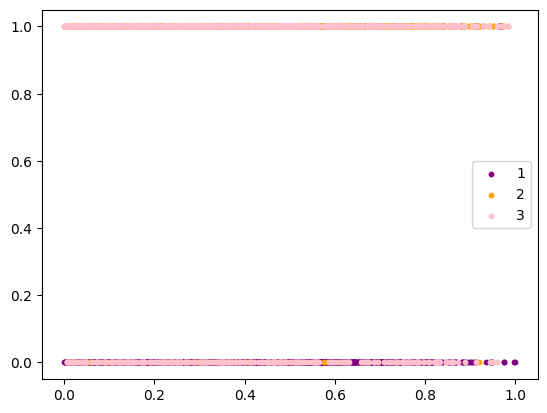

In [ ]:
plt.scatter(df.iloc[clusters == 0, 9], df.iloc[clusters == 0, -1], s = 10, c = 'purple',label = '1')
plt.scatter(df.iloc[clusters == 1,9 ], df.iloc[clusters == 1, -1], s = 10, c = 'orange',label = '2')
plt.scatter(df.iloc[clusters == 2, 9], df.iloc[clusters == 2, -1], s = 10, c = 'pink',label = '3')
# plt.scatter(df_copy.iloc[clusters == 3, 0], df_copy.iloc[clusters == 3, 1], s = 10, c = 'cyan',label = '2')


#Plotting the centroids of the clusters
#plt.scatter(kmode.cluster_centers_[:, 0], kmode.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

upon analysis k-mode is not suitable for this data since it includes lots of continous data

In [ ]:
!pip install maturin
!git clone https://github.com/kno10/python-kmedoids.git
!cd python-kmedoids
# build and install the package:
#aturin develop --release

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.6/10.6 MB 64.4 MB/s eta 0:00:00
Cloning into 'python-kmedoids'...
remote: Enumerating objects: 522, done.
remote: Counting objects: 100% (239/239), done.
remote: Compressing objects: 100% (89/89), done.
remote: Total 522 (delta 163), reused 197 (delta 135), pack-reused 283
Receiving objects: 100% (522/522), 594.53 KiB | 11.89 MiB/s, done.
Resolving deltas: 100% (269/269), done.


# K medoids clustering


In [ ]:
!pip install kmedoids

In [ ]:
pip install scikit-learn-extra

Clustering using K-Medoids for data using PCA with reduced dimension

In [ ]:
from sklearn import datasets
import numpy as np
import numpy as np
import sklearn
from sklearn.metrics import silhouette_score
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import davies_bouldin_score
import numpy as np
from scipy.spatial.distance import pdist, squareform

cost = []
K = range(1,10)
for num_clusters in list(K):
    model_km =  KMedoids(n_clusters = num_clusters, init = 'k-medoids++', max_iter = 300, random_state = 0)
    km = model_km.fit(df_copy_clustering)
    cost.append(model_km.inertia_)

Text(0.5, 1.0, 'Elbow Method For Optimal k')

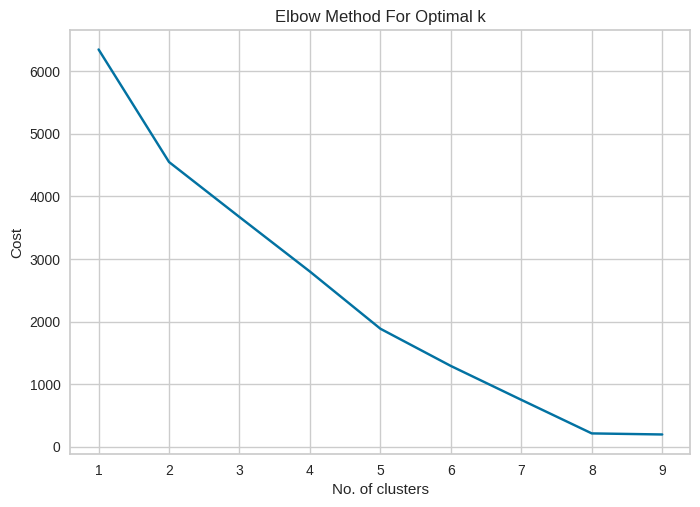

In [ ]:
plt.plot(range(1,10), cost, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')

In [ ]:
from sklearn.metrics import silhouette_score
avg_silhouette = []

for i in range(2, 11):
    km =  KMedoids(n_clusters = i, init = 'k-medoids++', max_iter = 300, random_state = 0)
    km.fit(df_copy_clustering)
    cluster_labels = km.labels_
    avg_silhouette.append(silhouette_score(df_copy_clustering, cluster_labels))

Text(0.5, 1.0, 'avg_silhouette For Optimal k')

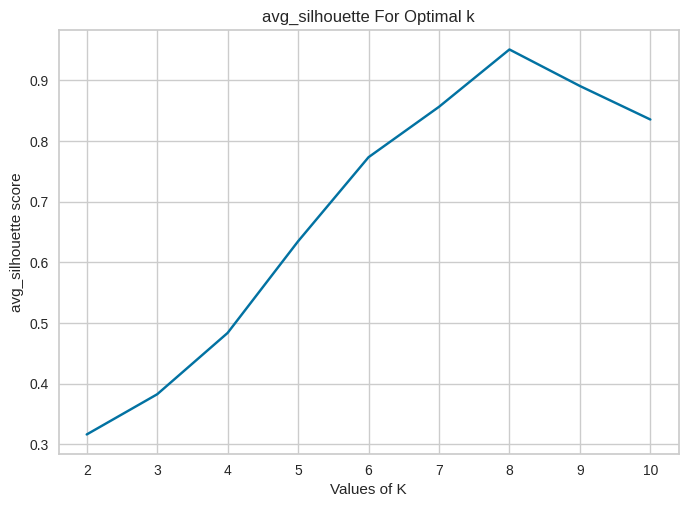

In [ ]:
plt.plot(range(2, 11),avg_silhouette, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('avg_silhouette score')
plt.title('avg_silhouette For Optimal k')

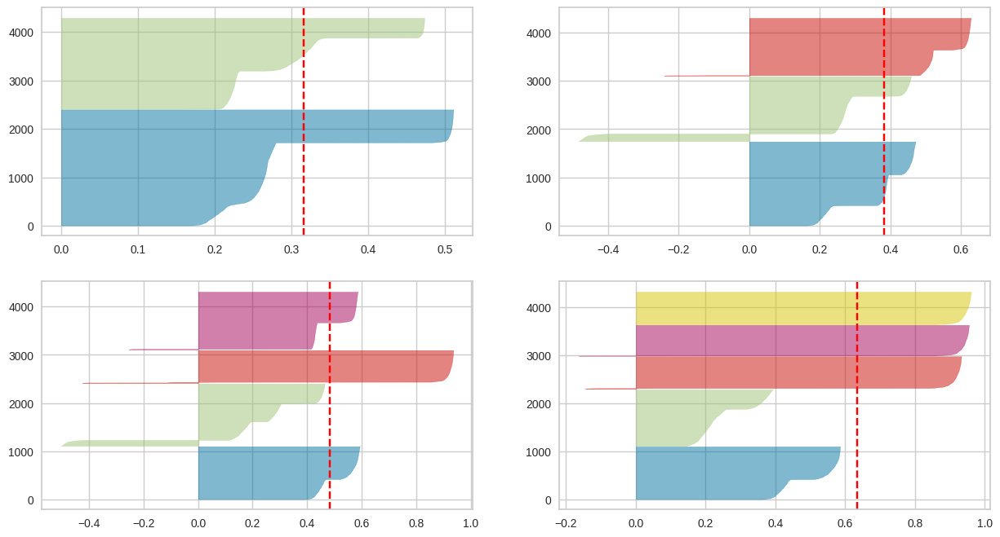

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in range(2, 6):
    '''
    Create  KMedoids instance for different number of clusters
    '''
    km =  KMedoids(n_clusters = i, init = 'k-medoids++', max_iter = 300, random_state = 0)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(df_copy_clustering)

In [ ]:
avg_davis = []

for i in range(2, 11):
    kme =  KMedoids(n_clusters = i, init = 'k-medoids++', max_iter = 300, random_state = 0)
    km=kme.fit(df_copy_clustering)
    cluster_labels = km.labels_
    avg_davis.append(davies_bouldin_score(df_copy_clustering,  cluster_labels))

Text(0.5, 1.0, 'Davis analysis For Optimal k')

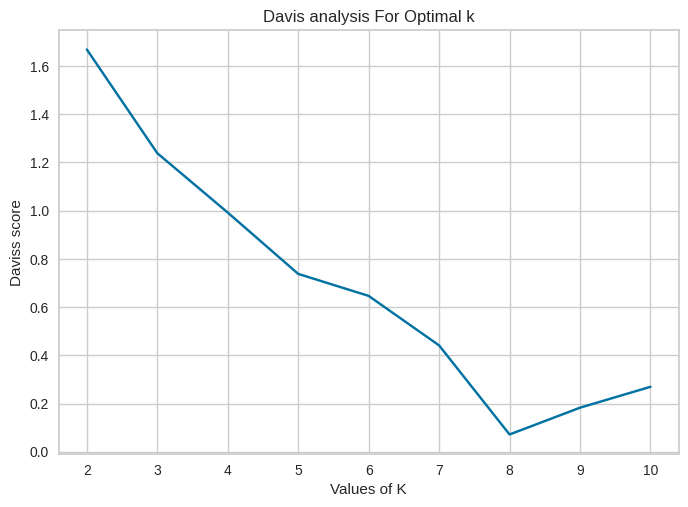

In [ ]:
plt.plot(range(2, 11),avg_davis, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Daviss score')
plt.title('Davis analysis For Optimal k')

In [ ]:
avg_dunn = []

for i in range(2, 11):
    kme =  KMedoids(n_clusters = i, init = 'k-medoids++', max_iter = 300, random_state = 0)
    km=kme.fit(df_copy_clustering)
    cluster_labels = km.labels_

    avg_dunn.append( compute_dunn_index(df_copy_clustering,  cluster_labels))

Text(0.5, 1.0, 'dunn analysis For Optimal k')

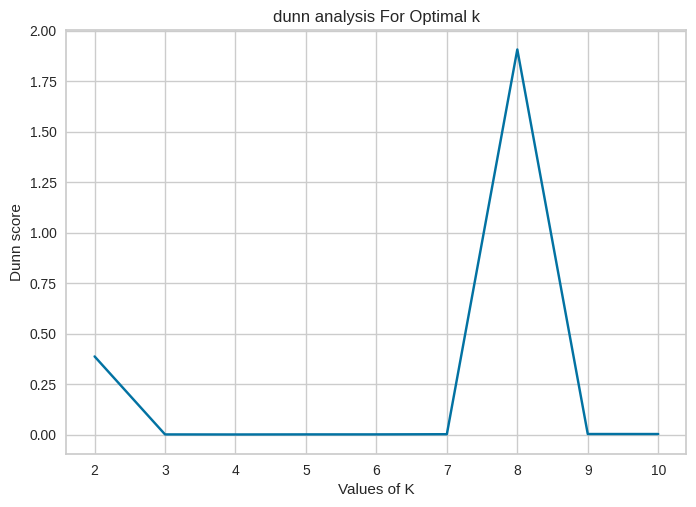

In [ ]:
plt.plot(range(2, 11),avg_dunn, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Dunn score')
plt.title('dunn analysis For Optimal k')

In [ ]:
import numpy as np
import sklearn
from sklearn.metrics import silhouette_score
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import davies_bouldin_score
import numpy as np
from scipy.spatial.distance import pdist, squareform



model_km = KMedoids(n_clusters=4, init = 'k-medoids++', max_iter = 300, random_state = 0)
km = model_km.fit(df_copy_clustering)
labels=km.labels_

print("Labels :",km.labels_)
print("Cluster centers  :",km.cluster_centers_)
print(model_km.inertia_)
score = silhouette_score(df_copy_clustering, km.labels_)

print('Silhouetter Score: %.3f' % score)


print("Davis")
print(davies_bouldin_score(df_copy_clustering ,km.labels_))

dunn_index = compute_dunn_index(df_copy_clustering, km.labels_)
print("Dunn Index:", dunn_index)

Labels : [3 0 1 ... 1 3 1]
Cluster centers  : [[-0.37786045 -1.05452192 -0.024133  ]
 [ 0.77214494  1.09469839  0.01467621]
 [-0.58835988 -0.07275666  0.97266176]
 [-0.51082785 -0.04982113 -1.01170061]]
2797.4566309425913
Silhouetter Score: 0.484
Davis
0.9921154751254576
Dunn Index: 0.0007789570187052996


In [ ]:
df_kMedoids=df_copy_clustering.copy()

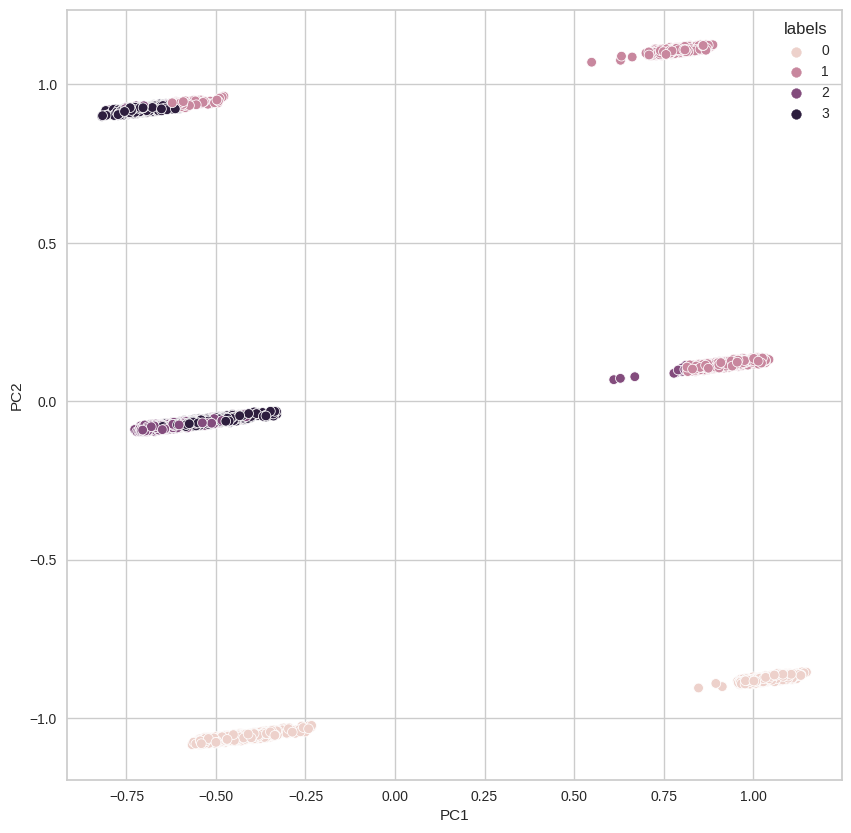

In [ ]:
df_kMedoids['labels']=labels

plt.figure(figsize=(10,10))
sns.scatterplot(x='PC1', y='PC2',hue='labels', data=df_kMedoids)
plt.show()

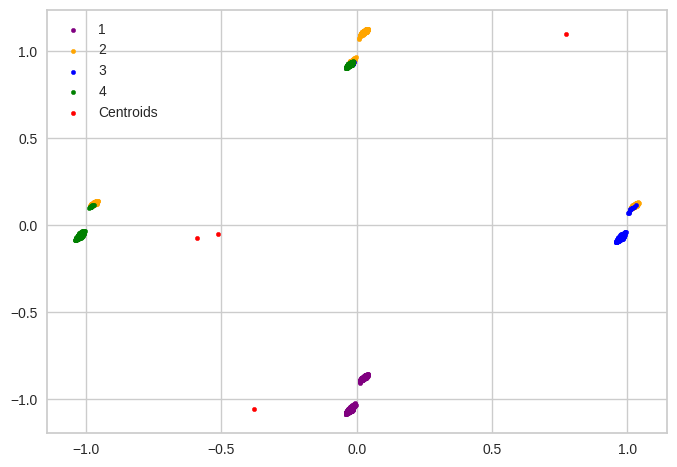

In [ ]:
plt.scatter(df_copy_clustering.iloc[labels == 0,2], df_copy_clustering.iloc[labels == 0,1], s = 10, c = 'purple',label = '1')
plt.scatter(df_copy_clustering.iloc[labels == 1,2], df_copy_clustering.iloc[labels == 1,1], s = 10, c = 'orange',label = '2')
plt.scatter(df_copy_clustering.iloc[labels == 2,2], df_copy_clustering.iloc[labels == 2,1], s = 10, c = 'blue',label = '3')
plt.scatter(df_copy_clustering.iloc[labels == 3,2], df_copy_clustering.iloc[labels == 3,1], s = 10, c = 'green',label = '4')


plt.scatter(model_km.cluster_centers_[:, 0], model_km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

In [ ]:
import numpy as np
import sklearn
from sklearn.metrics import silhouette_score
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import davies_bouldin_score
import numpy as np
from scipy.spatial.distance import pdist, squareform



model_km = KMedoids(n_clusters=2, init = 'k-medoids++', max_iter = 300, random_state = 0)
km = model_km.fit(df_copy_clustering)
labels=km.labels_

print("Labels :",km.labels_)
print("Cluster centers  :",km.cluster_centers_)
print(model_km.inertia_)
score = silhouette_score(df_copy_clustering, km.labels_)

print('Silhouetter Score: %.3f' % score)


print("Davis")
print(davies_bouldin_score(df_copy_clustering ,km.labels_))

dunn_index = compute_dunn_index(df_copy_clustering, km.labels_)
print("Dunn Index:", dunn_index)

Labels : [1 0 1 ... 1 0 1]
Cluster centers  : [[-0.36836316 -1.04108397 -0.01480358]
 [ 0.54911208  1.07025745  0.00743851]]
4547.368874216853
Silhouetter Score: 0.316
Davis
1.6684366431860511
Dunn Index: 0.3871645994514092


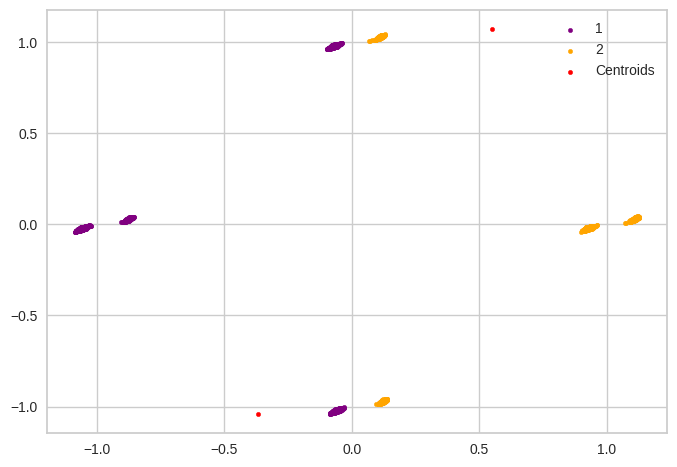

In [ ]:
plt.scatter(df_copy_clustering.iloc[labels == 0,1], df_copy_clustering.iloc[labels == 0,2], s = 10, c = 'purple',label = '1')
plt.scatter(df_copy_clustering.iloc[labels == 1,1], df_copy_clustering.iloc[labels == 1,2], s = 10, c = 'orange',label = '2')
#plt.scatter(df_copy_clustering.iloc[labels == 2,0], df_copy_clustering.iloc[labels == 2,2], s = 10, c = 'blue',label = '3')
#plt.scatter(df_copy_clustering.iloc[labels == 3,0], df_copy_clustering.iloc[labels == 3,1], s = 10, c = 'green',label = '4')


plt.scatter(model_km.cluster_centers_[:, 0], model_km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

In [ ]:
import numpy as np
import sklearn
from sklearn.metrics import silhouette_score
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import davies_bouldin_score
import numpy as np
from scipy.spatial.distance import pdist, squareform



model_km = KMedoids(n_clusters=3, init = 'k-medoids++', max_iter = 300, random_state = 0)
km = model_km.fit(df_copy_clustering)
labels=km.labels_

print("Labels :",km.labels_)
print("Cluster centers  :",km.cluster_centers_)
print(model_km.inertia_)
score = silhouette_score(df_copy_clustering, km.labels_)

print('Silhouetter Score: %.3f' % score)


print("Davis")
print(davies_bouldin_score(df_copy_clustering ,km.labels_))

dunn_index = compute_dunn_index(df_copy_clustering, km.labels_)
print("Dunn Index:", dunn_index)

Labels : [2 0 1 ... 1 0 1]
Cluster centers  : [[-0.38564953 -1.05343138 -0.02615631]
 [ 0.77214494  1.09469839  0.01467621]
 [-0.58990492 -0.06726215  0.97462173]]
3668.615872659323
Silhouetter Score: 0.383
Davis
1.2383827847875857
Dunn Index: 0.0010534264512614946


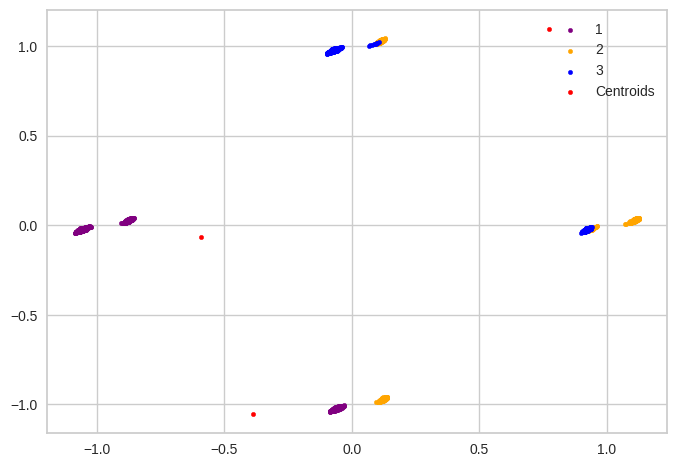

In [ ]:
plt.scatter(df_copy_clustering.iloc[labels == 0,1], df_copy_clustering.iloc[labels == 0,2], s = 10, c = 'purple',label = '1')
plt.scatter(df_copy_clustering.iloc[labels == 1,1], df_copy_clustering.iloc[labels == 1,2], s = 10, c = 'orange',label = '2')
plt.scatter(df_copy_clustering.iloc[labels == 2,1], df_copy_clustering.iloc[labels == 2,2], s = 10, c = 'blue',label = '3')
#plt.scatter(df_copy_clustering.iloc[labels == 3,0], df_copy_clustering.iloc[labels == 3,1], s = 10, c = 'green',label = '4')


plt.scatter(model_km.cluster_centers_[:, 0], model_km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

Upon analysis k=2 was the best option since k=3 and k=4 showed some overlap

Clustering using K-Medoids for data without PCA

In [ ]:

from sklearn import datasets
import numpy as np

cost = []
K = range(1,10)
for num_clusters in list(K):
    model_km =  KMedoids(n_clusters = num_clusters, init = 'k-medoids++', max_iter = 300, random_state = 0)
    km = model_km.fit(df)
    cost.append(model_km.inertia_)

Text(0.5, 1.0, 'Elbow Method For Optimal k')

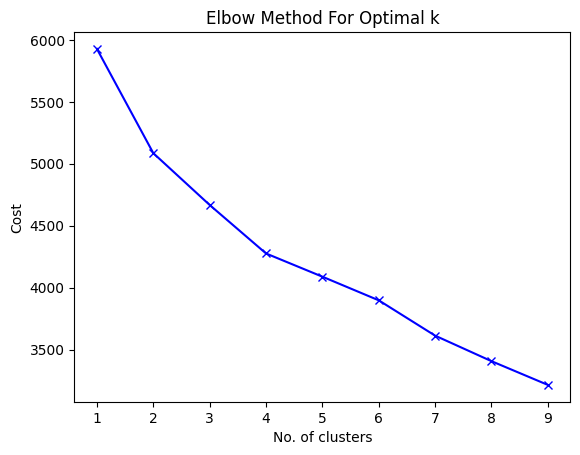

In [ ]:
plt.plot(range(1,10), cost, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')

In [ ]:
from sklearn.metrics import silhouette_score
avg_silhouette = []

for i in range(2, 11):
    km =  KMedoids(n_clusters = i, init = 'k-medoids++', max_iter = 300, random_state = 0)
    km.fit(df)
    cluster_labels = km.labels_
    avg_silhouette.append(silhouette_score(df, cluster_labels))

Text(0.5, 1.0, ' average silhouette Optimal k')

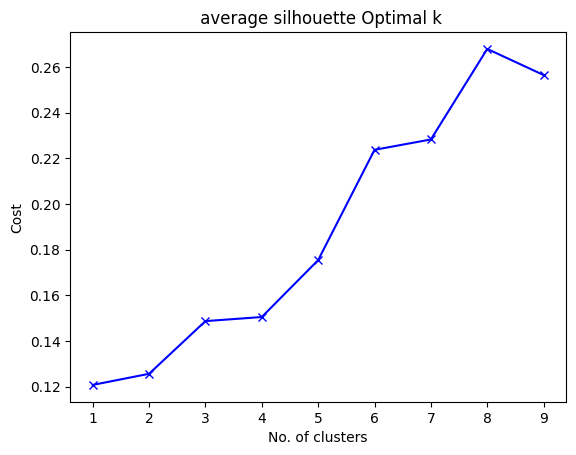

In [ ]:
plt.plot(range(1,10), avg_silhouette, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title(' average silhouette Optimal k')

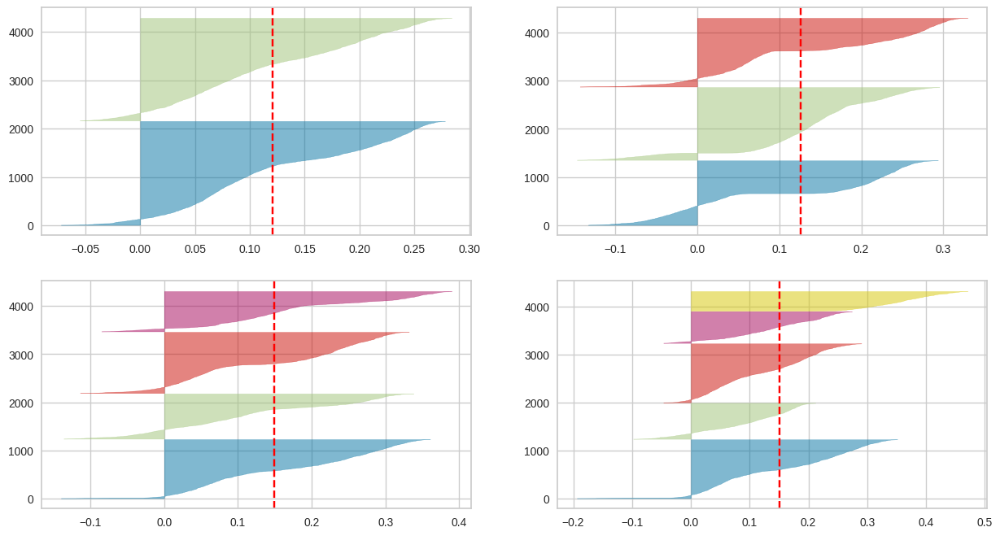

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in range(2, 6):
    '''
    Create  KMedoids instance for different number of clusters
    '''
    km =  KMedoids(n_clusters = i, init = 'k-medoids++', max_iter = 300, random_state = 0)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(df)

In [ ]:
avg_davis = []

for i in range(2, 11):
    kme =  KMedoids(n_clusters = i, init = 'k-medoids++', max_iter = 300, random_state = 0)
    km=kme.fit(df)
    cluster_labels = km.labels_
    avg_davis.append(davies_bouldin_score(df,  cluster_labels))

Text(0.5, 1.0, ' avg_davis')

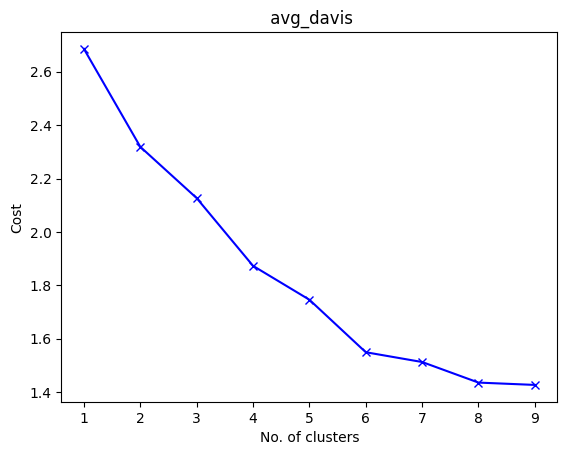

In [ ]:
plt.plot(range(1,10), avg_davis, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title(' avg_davis')

In [ ]:
avg_dunn = []

for i in range(2, 11):
    kme =  KMedoids(n_clusters = i, init = 'k-medoids++', max_iter = 300, random_state = 0)
    km=kme.fit(df)
    cluster_labels = km.labels_

    avg_dunn.append( compute_dunn_index(df,  cluster_labels))

Text(0.5, 1.0, 'avg_dunn ')

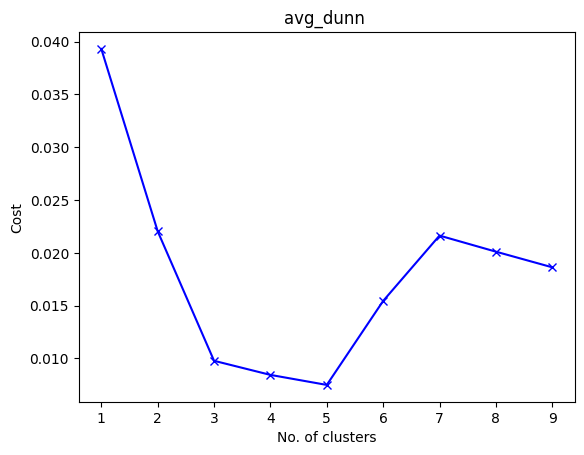

In [ ]:
plt.plot(range(1,10), avg_dunn , 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('avg_dunn ')

In [ ]:
import numpy as np
import sklearn
from sklearn.metrics import silhouette_score
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import davies_bouldin_score
import numpy as np
from scipy.spatial.distance import pdist, squareform



model_km = KMedoids(n_clusters=4, init = 'k-medoids++', max_iter = 300, random_state = 0)
km = model_km.fit(df)
labels=km.labels_

print("Labels :",km.labels_)
print("Cluster centers  :",km.cluster_centers_)
print(model_km.inertia_)
score = silhouette_score(df, km.labels_)

print('Silhouetter Score: %.3f' % score)


print("Davis")
print(davies_bouldin_score(df ,km.labels_))

dunn_index = compute_dunn_index(df, km.labels_)
print("Dunn Index:", dunn_index)

Labels : [2 3 1 ... 3 0 2]
Cluster centers  : [[0.4        0.         1.         0.49484536 0.36479592 0.44444444
  0.84666667 0.15120275 0.18041237 0.43701799 0.21088435 1.        ]
 [0.6        1.         1.         0.48453608 0.35714286 0.66666667
  0.23166667 0.35395189 0.28865979 0.43958869 0.34693878 0.        ]
 [0.6        1.         0.         0.5257732  0.375      0.22222222
  0.695      0.24054983 0.21134021 0.43187661 0.36054422 1.        ]
 [0.6        0.         0.         0.32989691 0.19897959 0.55555556
  0.14166667 0.20962199 0.20618557 0.26735219 0.27210884 0.        ]]
4275.642845270064
Silhouetter Score: 0.149
Davis
2.1266815866727242
Dunn Index: 0.009768865993599616


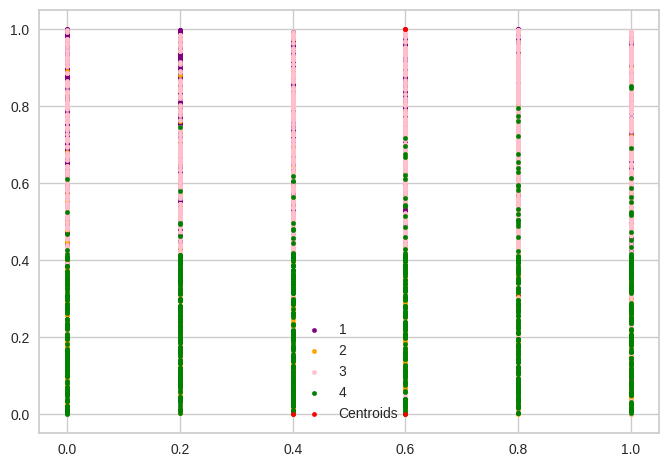

In [ ]:
plt.scatter(df.iloc[labels == 0,0], df.iloc[labels == 0,6], s = 10, c = 'purple',label = '1')
plt.scatter(df.iloc[labels == 1,0], df.iloc[labels == 1,6], s = 10, c = 'orange',label = '2')
plt.scatter(df.iloc[labels == 2,0], df.iloc[labels == 2,6], s = 10, c = 'pink',label = '3')
plt.scatter(df.iloc[labels == 3,0], df.iloc[labels == 3,6], s = 10, c = 'green',label = '4')
# plt.scatter(df.iloc[labels == 4,6], df.iloc[labels == 4,5], s = 10, c = 'fuchsia',label = '5')

plt.scatter(model_km.cluster_centers_[:, 0], model_km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

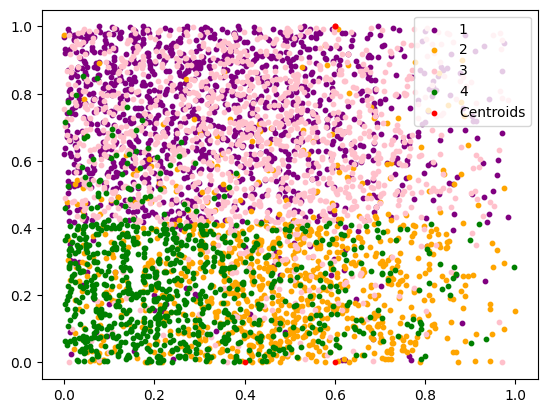

In [ ]:
plt.scatter(df.iloc[labels == 0,9], df.iloc[labels == 0,6], s = 10, c = 'purple',label = '1')
plt.scatter(df.iloc[labels == 1,9], df.iloc[labels == 1,6], s = 10, c = 'orange',label = '2')
plt.scatter(df.iloc[labels == 2,9], df.iloc[labels == 2,6], s = 10, c = 'pink',label = '3')
plt.scatter(df.iloc[labels == 3,9], df.iloc[labels == 3,6], s = 10, c = 'green',label = '4')
# plt.scatter(df.iloc[labels == 4,6], df.iloc[labels == 4,5], s = 10, c = 'fuchsia',label = '5')

plt.scatter(model_km.cluster_centers_[:, 0], model_km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

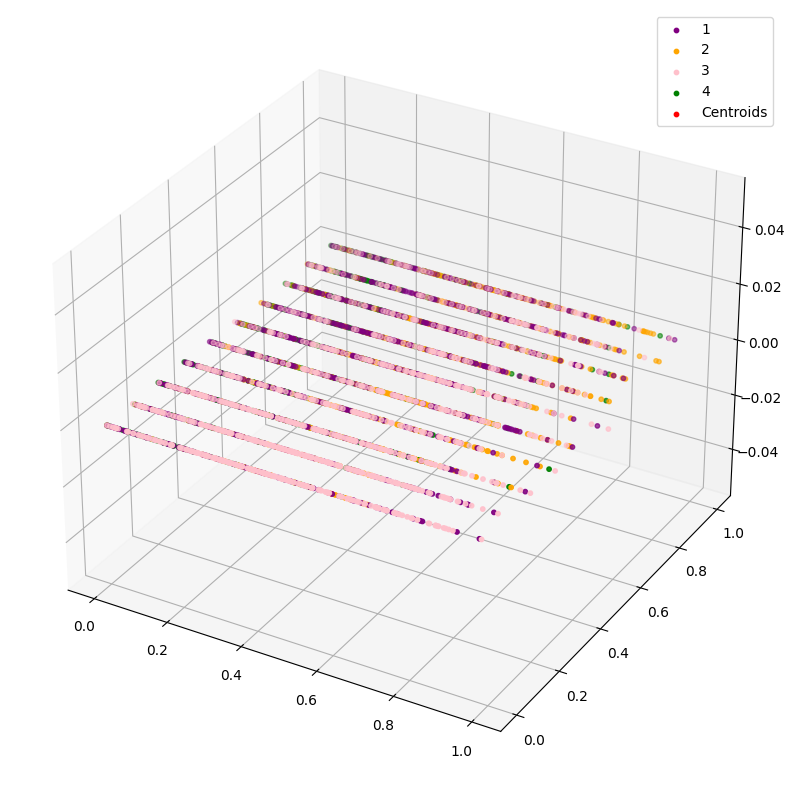

In [ ]:
fig = plt.figure(figsize = (10, 10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(df.iloc[labels == 0,4], df.iloc[labels == 0,5], s = 10, c = 'purple',label = '1')
plt.scatter(df.iloc[labels == 1,4], df.iloc[labels == 1,5], s = 10, c = 'orange',label = '2')
plt.scatter(df.iloc[labels == 2,4], df.iloc[labels == 2,5], s = 10, c = 'pink',label = '3')
plt.scatter(df.iloc[labels == 3,4], df.iloc[labels == 3,5], s = 10, c = 'green',label = '4')
plt.scatter(model_km.cluster_centers_[:, 0], model_km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

In [ ]:
import numpy as np
import sklearn
from sklearn.metrics import silhouette_score
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import davies_bouldin_score
import numpy as np
from scipy.spatial.distance import pdist, squareform



model_km = KMedoids(n_clusters=2, init = 'k-medoids++', max_iter = 300, random_state = 0)
km = model_km.fit(df)
labels=km.labels_

print("Labels :",km.labels_)
print("Cluster centers  :",km.cluster_centers_)
print(model_km.inertia_)
score = silhouette_score(df, km.labels_)

print('Silhouetter Score: %.3f' % score)


print("Davis")
print(davies_bouldin_score(df ,km.labels_))

dunn_index = compute_dunn_index(df, km.labels_)
print("Dunn Index:", dunn_index)

Labels : [1 0 1 ... 1 1 1]
Cluster centers  : [[0.6        0.         1.         0.36082474 0.34438776 0.44444444
  0.535      0.13745704 0.04123711 0.29820051 0.36054422 1.        ]
 [0.4        1.         0.         0.48453608 0.4005102  0.55555556
  0.68333333 0.29896907 0.36597938 0.24935733 0.3877551  1.        ]]
5085.736846549313
Silhouetter Score: 0.121
Davis
2.6854850445651834
Dunn Index: 0.039316890696688915


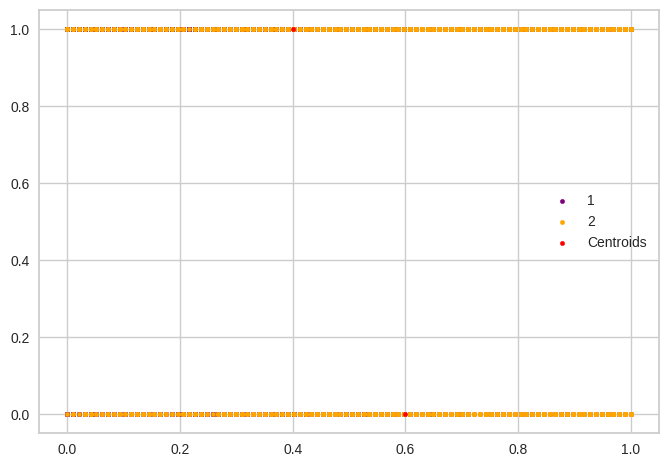

In [ ]:
plt.scatter(df.iloc[labels == 0,3], df.iloc[labels == 0,-1], s = 10, c = 'purple',label = '1')
plt.scatter(df.iloc[labels == 1,3], df.iloc[labels == 1,-1], s = 10, c = 'orange',label = '2')


plt.scatter(model_km.cluster_centers_[:, 0], model_km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

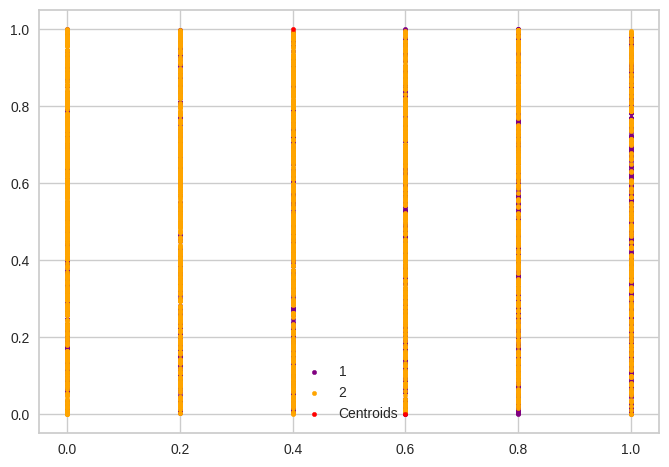

In [ ]:
plt.scatter(df.iloc[labels == 0,0], df.iloc[labels == 0,6], s = 10, c = 'purple',label = '1')
plt.scatter(df.iloc[labels == 1,0], df.iloc[labels == 1,6], s = 10, c = 'orange',label = '2')


plt.scatter(model_km.cluster_centers_[:, 0], model_km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

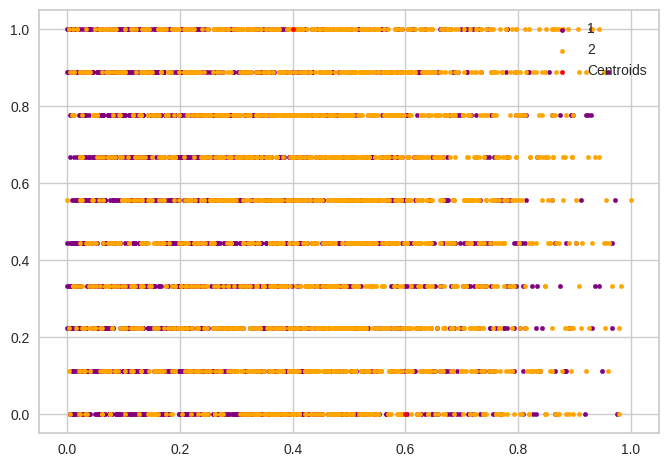

In [ ]:
plt.scatter(df.iloc[labels == 0,4], df.iloc[labels == 0,5], s = 10, c = 'purple',label = '1')
plt.scatter(df.iloc[labels == 1,4], df.iloc[labels == 1,5], s = 10, c = 'orange',label = '2')


plt.scatter(model_km.cluster_centers_[:, 0], model_km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

K-medoids for reduced features data frame

In [ ]:
from sklearn import datasets
import numpy as np

cost = []
K = range(1,10)
for num_clusters in list(K):
    model_km =  KMedoids(n_clusters = num_clusters, init = 'k-medoids++', max_iter = 300, random_state = 0)
    km = model_km.fit(df_features_reduced)
    cost.append(model_km.inertia_)

Text(0.5, 1.0, 'Elbow Method For Optimal k')

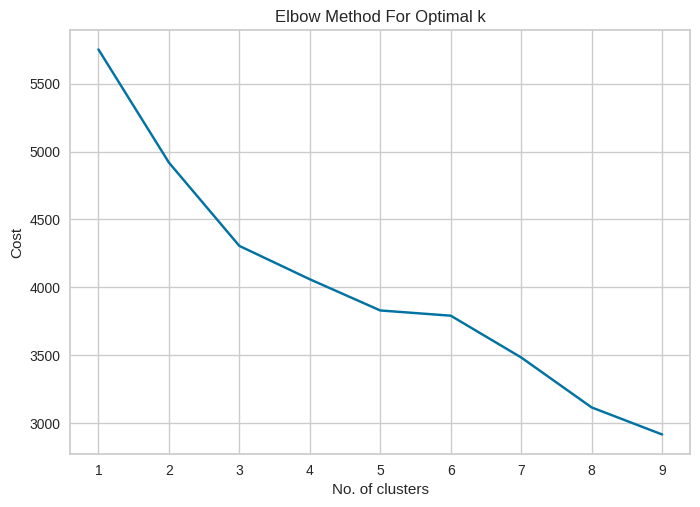

In [ ]:
plt.plot(range(1,10), cost, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')

In [ ]:
from sklearn.metrics import silhouette_score
avg_silhouette = []

for i in range(2, 11):
    km =  KMedoids(n_clusters = i, init = 'k-medoids++', max_iter = 300, random_state = 0)
    km.fit(df_features_reduced)
    cluster_labels = km.labels_
    avg_silhouette.append(silhouette_score(df_features_reduced, cluster_labels))


Text(0.5, 1.0, ' average silhouette Optimal k')

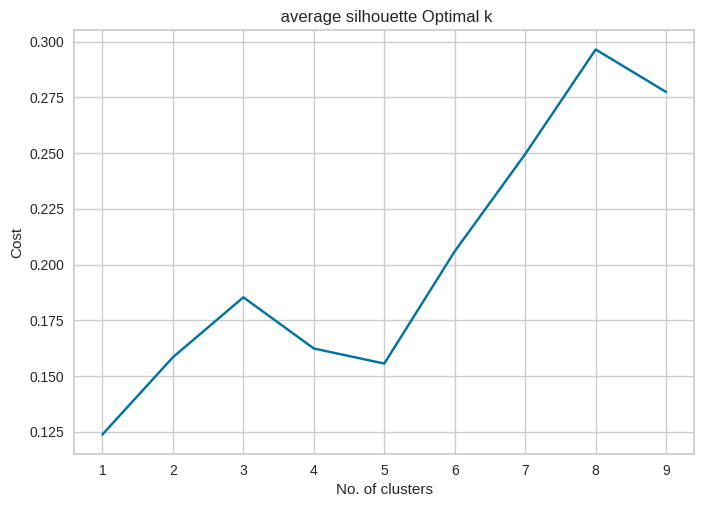

In [ ]:
plt.plot(range(1,10), avg_silhouette, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title(' average silhouette Optimal k')

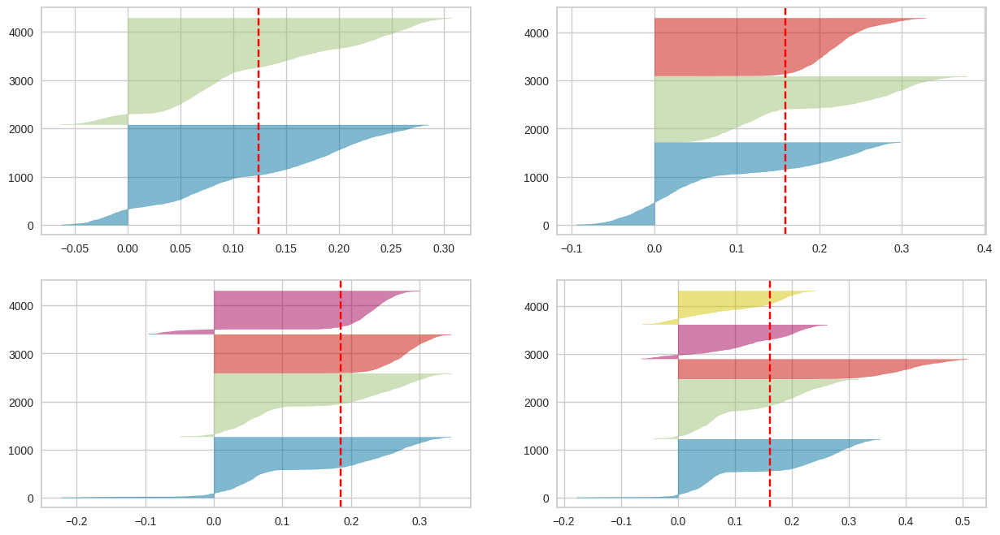

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in range(2, 6):
    '''
    Create  KMedoids instance for different number of clusters
    '''
    km =  KMedoids(n_clusters = i, init = 'k-medoids++', max_iter = 300, random_state = 0)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(df_features_reduced)

In [ ]:
avg_davis = []

for i in range(2, 11):
    kme =  KMedoids(n_clusters = i, init = 'k-medoids++', max_iter = 300, random_state = 0)
    km=kme.fit(df_features_reduced)
    cluster_labels = km.labels_
    avg_davis.append(davies_bouldin_score(df_features_reduced,  cluster_labels))

Text(0.5, 1.0, ' avg_davis')

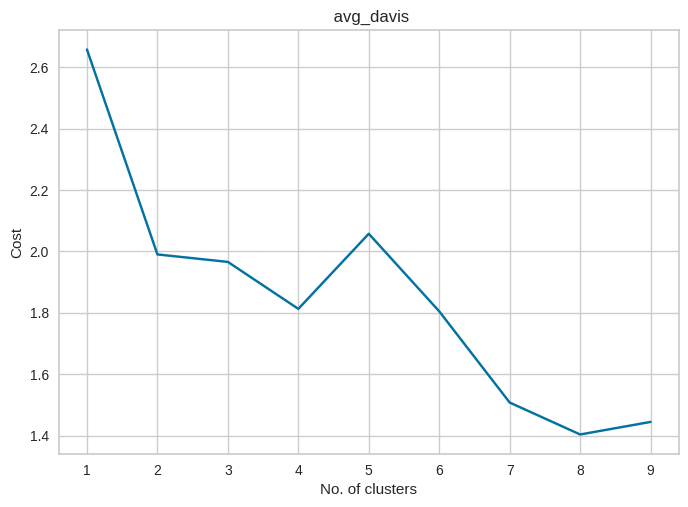

In [ ]:
plt.plot(range(1,10), avg_davis, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title(' avg_davis')

In [ ]:
avg_dunn = []

for i in range(2, 11):
    kme =  KMedoids(n_clusters = i, init = 'k-medoids++', max_iter = 300, random_state = 0)
    km=kme.fit(df_features_reduced)
    cluster_labels = km.labels_

    avg_dunn.append( compute_dunn_index(df_features_reduced,  cluster_labels))

Text(0.5, 1.0, 'avg_dunn ')

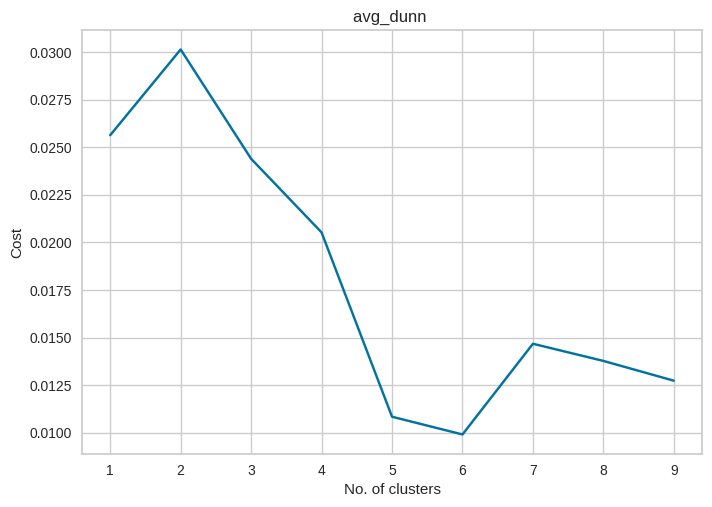

In [ ]:
plt.plot(range(1,10), avg_dunn , 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('avg_dunn ')

In [ ]:
import numpy as np
import sklearn
from sklearn.metrics import silhouette_score
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import davies_bouldin_score
import numpy as np
from scipy.spatial.distance import pdist, squareform



model_km = KMedoids(n_clusters=4, init = 'k-medoids++', max_iter = 300, random_state = 0)
km = model_km.fit(df_features_reduced)
labels=km.labels_

print("Labels :",km.labels_)
print("Cluster centers  :",km.cluster_centers_)
print(model_km.inertia_)
score = silhouette_score(df_features_reduced, km.labels_)

print('Silhouetter Score: %.3f' % score)


print("Davis")
print(davies_bouldin_score(df_features_reduced ,km.labels_))

dunn_index = compute_dunn_index(df_features_reduced, km.labels_)
print("Dunn Index:", dunn_index)

Labels : [1 3 2 ... 2 0 1]
Cluster centers  : [[0.4        0.         1.         0.49484536 0.36479592 0.44444444
  0.84666667 0.15120275 0.18041237 1.        ]
 [0.6        1.         0.         0.40206186 0.29081633 0.44444444
  0.715      0.2371134  0.31958763 1.        ]
 [0.4        1.         0.         0.41237113 0.25255102 0.66666667
  0.17833333 0.20274914 0.23195876 0.        ]
 [0.6        1.         1.         0.46391753 0.32908163 0.55555556
  0.23333333 0.13745704 0.17010309 0.        ]]
4059.893693460206
Silhouetter Score: 0.185
Davis
1.966020582174318
Dunn Index: 0.024390032487645645


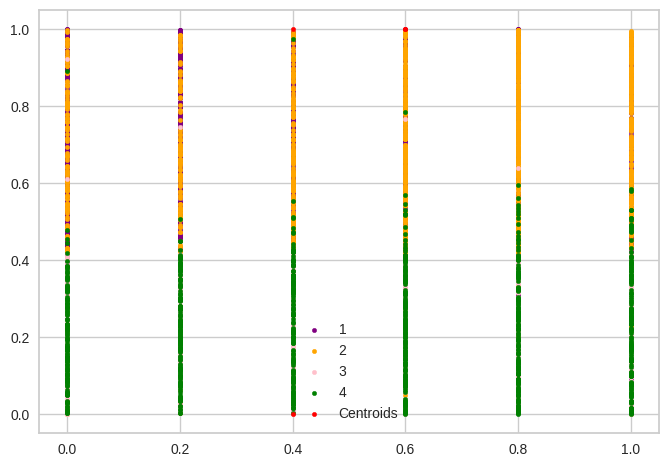

In [ ]:
plt.scatter(df_features_reduced.iloc[labels == 0,0], df_features_reduced.iloc[labels == 0,6], s = 10, c = 'purple',label = '1')
plt.scatter(df_features_reduced.iloc[labels == 1,0], df_features_reduced.iloc[labels == 1,6], s = 10, c = 'orange',label = '2')
plt.scatter(df_features_reduced.iloc[labels == 2,0], df_features_reduced.iloc[labels == 2,6], s = 10, c = 'pink',label = '3')
plt.scatter(df_features_reduced.iloc[labels == 3,0], df_features_reduced.iloc[labels == 3,6], s = 10, c = 'green',label = '4')
# plt.scatter(df.iloc[labels == 4,6], df.iloc[labels == 4,5], s = 10, c = 'fuchsia',label = '5')

plt.scatter(model_km.cluster_centers_[:, 0], model_km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

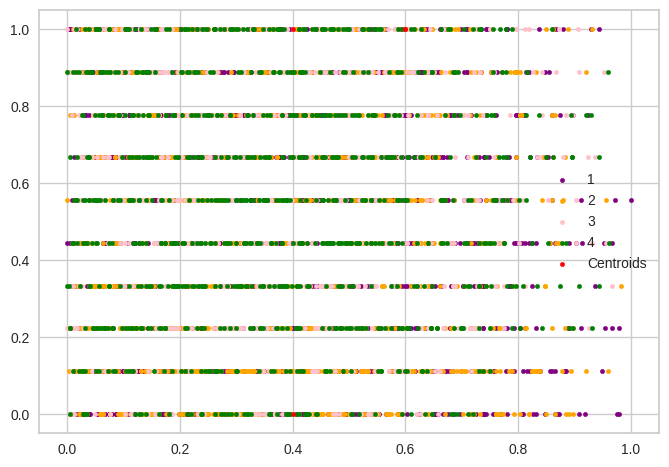

In [ ]:
plt.scatter(df_features_reduced.iloc[labels == 0,4], df_features_reduced.iloc[labels == 0,5], s = 10, c = 'purple',label = '1')
plt.scatter(df_features_reduced.iloc[labels == 1,4], df_features_reduced.iloc[labels == 1,5], s = 10, c = 'orange',label = '2')
plt.scatter(df_features_reduced.iloc[labels == 2,4], df_features_reduced.iloc[labels == 2,5], s = 10, c = 'pink',label = '3')
plt.scatter(df_features_reduced.iloc[labels == 3,4], df_features_reduced.iloc[labels == 3,5], s = 10, c = 'green',label = '4')
# plt.scatter(df.iloc[labels == 4,6], df.iloc[labels == 4,5], s = 10, c = 'fuchsia',label = '5')

plt.scatter(model_km.cluster_centers_[:, 0], model_km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

In [ ]:
import numpy as np
import sklearn
from sklearn.metrics import silhouette_score
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import davies_bouldin_score
import numpy as np
from scipy.spatial.distance import pdist, squareform



model_km = KMedoids(n_clusters=2, init = 'k-medoids++', max_iter = 300, random_state = 0)
km = model_km.fit(df_features_reduced)
labels=km.labels_

print("Labels :",km.labels_)
print("Cluster centers  :",km.cluster_centers_)
print(model_km.inertia_)
score = silhouette_score(df_features_reduced, km.labels_)

print('Silhouetter Score: %.3f' % score)


print("Davis")
print(davies_bouldin_score(df_features_reduced ,km.labels_))

dunn_index = compute_dunn_index(df_features_reduced, km.labels_)
print("Dunn Index:", dunn_index)

Labels : [1 0 1 ... 1 0 1]
Cluster centers  : [[0.4        0.         1.         0.3814433  0.22959184 0.33333333
  0.485      0.37457045 0.13917526 1.        ]
 [0.6        1.         0.         0.40206186 0.29081633 0.44444444
  0.715      0.2371134  0.31958763 1.        ]]
4918.856951928422
Silhouetter Score: 0.124
Davis
2.6578747147381008
Dunn Index: 0.025628631717777975


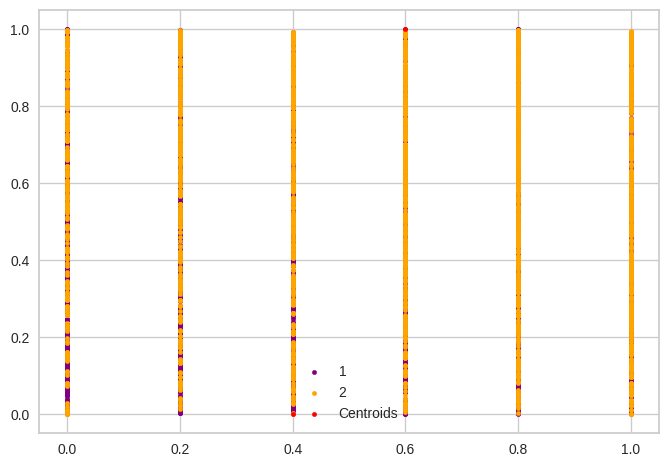

In [ ]:
plt.scatter(df_features_reduced.iloc[labels == 0,0], df_features_reduced.iloc[labels == 0,6], s = 10, c = 'purple',label = '1')
plt.scatter(df_features_reduced.iloc[labels == 1,0], df_features_reduced.iloc[labels == 1,6], s = 10, c = 'orange',label = '2')
# plt.scatter(df_features_reduced.iloc[labels == 2,0], df_features_reduced.iloc[labels == 2,6], s = 10, c = 'pink',label = '3')
# plt.scatter(df_features_reduced.iloc[labels == 3,0], df_features_reduced.iloc[labels == 3,6], s = 10, c = 'green',label = '4')
# plt.scatter(df.iloc[labels == 4,6], df.iloc[labels == 4,5], s = 10, c = 'fuchsia',label = '5')

plt.scatter(model_km.cluster_centers_[:, 0], model_km.cluster_centers_[:,1], s = 10, c = 'red', label = 'Centroids')

plt.legend()

upon analysis the k -medioids did not cluster well with the data set eiter reduced or un reduced ,however, it perforemd well for the pca

# dendodram for PCAs

In [ ]:
from sklearn.cluster import AgglomerativeClustering
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(df_copy_clustering)

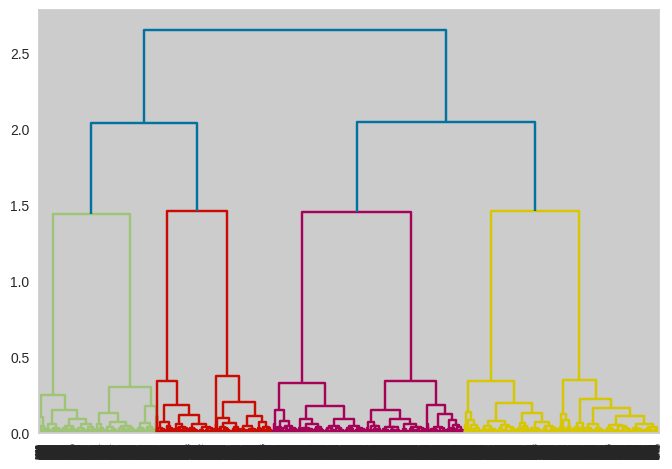

In [ ]:
import pandas as pd
from scipy.spatial import distance_matrix
from scipy.cluster.hierarchy import dendrogram, linkage
dendrogram(linkage(df_copy_clustering, method="complete", metric="euclidean"))
plt.show()

In [ ]:
import numpy as np
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, fcluster

def compute_dunn_index(data, labels):
    # Compute pairwise distance matrix
    distance_matrix = squareform(pdist(data))

    # Compute within-cluster scatter (compactness)
    compactness = 0
    for label in np.unique(labels):
        cluster_points = data[labels == label]
        compactness += np.mean(pdist(cluster_points))

    # Compute between-cluster separation
    separation = np.min(distance_matrix[labels != labels[:, None]])

    # Compute Dunn index
    dunn_index = separation / compactness

    return dunn_index

# Example usage
# Generate random data


# Perform agglomerative clustering
# You can customize the linkage method and the number of clusters as per your requirement
#linkage_matrix = linkage(data, method='ward')
#labels = fcluster(linkage_matrix, t=3, criterion='maxclust')

# Compute Dunn index
#dunn_index = compute_dunn_index(data, labels)
#print("Dunn Index:", dunn_index)

In [ ]:
linkage_matrix = linkage(df_copy_clustering, method="complete", metric="euclidean")
labels = fcluster(linkage_matrix, t=10, criterion='maxclust')
dunn_index = compute_dunn_index(df_copy_clustering, labels)
print("Dunn Index:", dunn_index)

Dunn Index: 0.006011972089004173


In [ ]:
import numpy as np
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, fcluster

def compute_davis_bouldin_index(data, labels):
    # Compute pairwise distance matrix
    distance_matrix = squareform(pdist(data))

    # Compute cluster centroids
    centroids = []
    for label in np.unique(labels):
        cluster_points = data[labels == label]
        centroid = np.mean(cluster_points, axis=0)
        centroids.append(centroid)
    centroids = np.array(centroids)

    # Compute pairwise distances between centroids
    centroid_distances = pdist(centroids)

    # Compute average intra-cluster distances and inter-cluster distances
    avg_intra_cluster_distances = []
    for label, centroid in zip(np.unique(labels), centroids):
        cluster_points = data[labels == label]
        intra_cluster_distances = pdist(cluster_points)
        avg_intra_cluster_distance = np.mean(intra_cluster_distances)
        avg_intra_cluster_distances.append(avg_intra_cluster_distance)
    avg_intra_cluster_distances = np.array(avg_intra_cluster_distances)

    # Compute Davis-Bouldin Index
    inter_cluster_distances = np.zeros_like(avg_intra_cluster_distances)
    for i, centroid in enumerate(centroids):
        inter_cluster_distances[i] = np.max(avg_intra_cluster_distances + avg_intra_cluster_distances[i])
    davis_bouldin_index = np.mean(inter_cluster_distances / avg_intra_cluster_distances)

    return davis_bouldin_index

# Example usage
# Generate random data
# data = np.random.rand(100, 2)

# # Perform agglomerative clustering
# # You can customize the linkage method and the number of clusters as per your requirement
# linkage_matrix = linkage(data, method='ward')
# labels = fcluster(linkage_matrix, t=3, criterion='maxclust')

# # Compute Davis-Bouldin Index
# davis_bouldin_index = compute_davis_bouldin_index(data, labels)
# print("Davis-Bouldin Index:", davis_bouldin_index)

In [ ]:
davis_bouldin_index = compute_davis_bouldin_index(df_copy_clustering, labels)
print("Davis-Bouldin Index:", davis_bouldin_index)

Davis-Bouldin Index: 2.4041463723223826


Dendogram clustering


# Dendogram for data without pca

In [ ]:
from sklearn.cluster import AgglomerativeClustering
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(df)

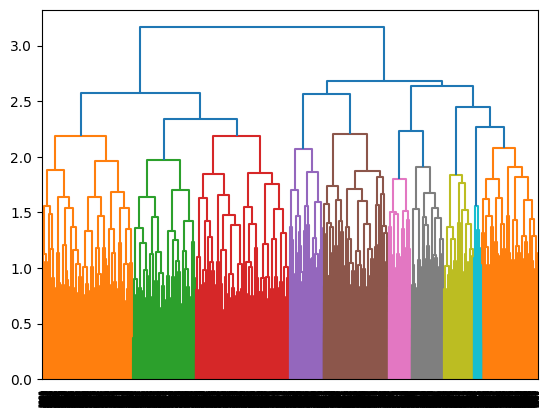

In [ ]:
import pandas as pd
from scipy.spatial import distance_matrix
from scipy.cluster.hierarchy import dendrogram, linkage
dendrogram(linkage(df, method="complete", metric="euclidean"))
plt.show()

dunn_index

In [ ]:
linkage_matrix = linkage(df, method="complete", metric="euclidean")
labels = fcluster(linkage_matrix, t=10, criterion='maxclust')
dunn_index = compute_dunn_index(df, labels)
print("Dunn Index:", dunn_index)

Dunn Index: 0.018882798156698386


davis_index

In [ ]:
davis_bouldin_index = compute_davis_bouldin_index(df, labels)
print("Davis-Bouldin Index:", davis_bouldin_index)

Davis-Bouldin Index: 2.1752303356521288


# Dendogram for data with reduced features

In [ ]:
from sklearn.cluster import AgglomerativeClustering
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(df_features_reduced)


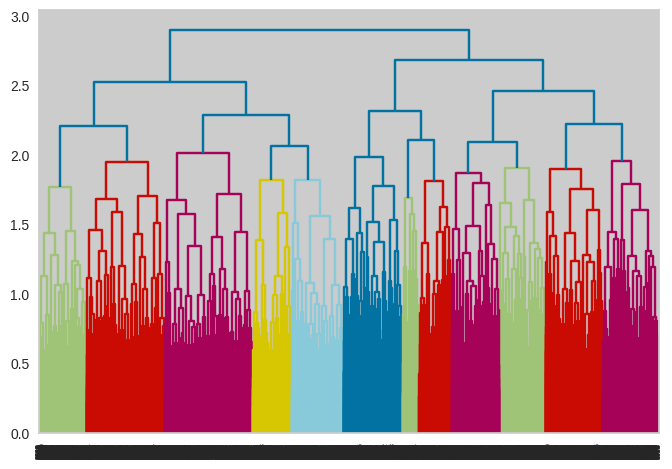

In [ ]:
import pandas as pd
from scipy.spatial import distance_matrix
from scipy.cluster.hierarchy import dendrogram, linkage
dendrogram(linkage(df_features_reduced, method="complete", metric="euclidean"))
plt.show()

In [ ]:
linkage_matrix = linkage(df_features_reduced, method="complete", metric="euclidean")
labels = fcluster(linkage_matrix, t=10, criterion='maxclust')
dunn_index = compute_dunn_index(df_features_reduced, labels)
print("Dunn Index:", dunn_index)

Dunn Index: 0.01641801202244576


In [ ]:
davis_bouldin_index = compute_davis_bouldin_index(df_features_reduced, labels)
print("Davis-Bouldin Index:", davis_bouldin_index)

Davis-Bouldin Index: 2.1524568745131343


# DBSCAN clustering

In [ ]:
from sklearn.cluster import DBSCAN
import numpy as np
dbscan=DBSCAN()
dbscan.fit(df_copy_clustering)
#dbscan.labels_
df_copy_clustering

,PC1,PC2,PC3
0,-0.712979,0.927708,-0.022232
1,1.028656,-0.880453,0.021324
2,0.787847,1.113197,0.036380
3,0.770593,1.112111,0.035834
4,1.105169,-0.863490,0.035993
...,...,...,...
4264,0.941763,0.111164,1.020405
4265,-0.335704,-1.054318,-0.027077
4266,0.955920,0.123543,-0.973262
4267,-0.574662,-0.070889,-1.027051


In [ ]:
df_copy_clustering.columns

Index(['PC1', 'PC2', 'PC3'], dtype='object')

Text(0, 0.5, 'Feature 2')

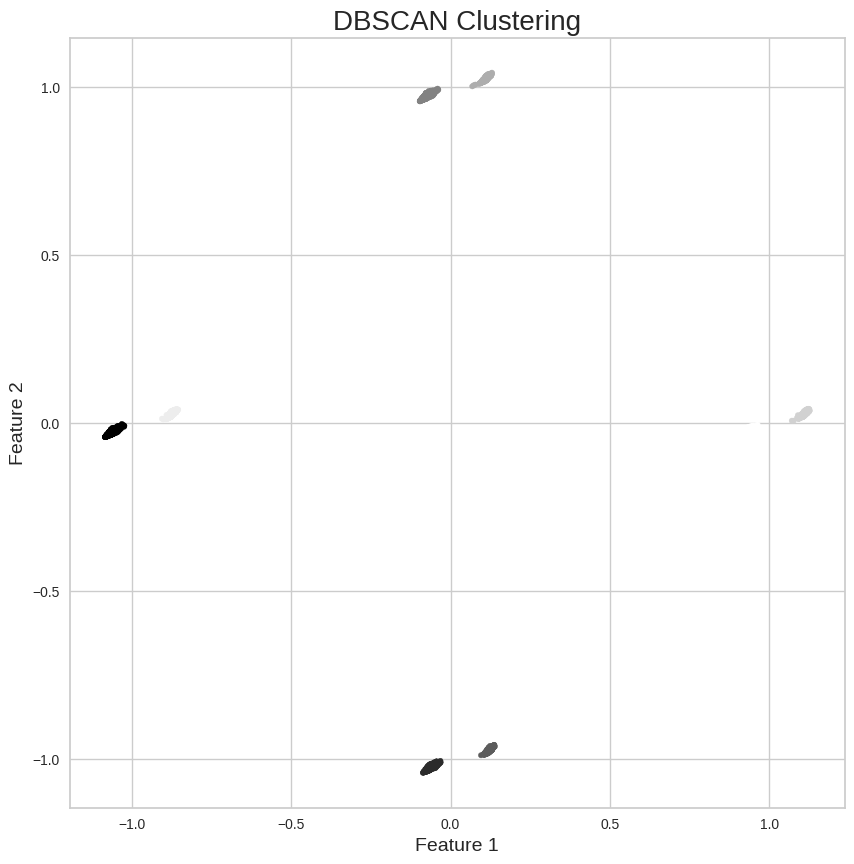

In [ ]:
import matplotlib.colors
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
plt.scatter(df_copy_clustering['PC2'],df_copy_clustering['PC3'],c=dbscan.labels_,s=15)
plt.title('DBSCAN Clustering',fontsize=20)
plt.xlabel('Feature 1',fontsize=14)
plt.ylabel('Feature 2',fontsize=14)

# Classification with raw dataset

## Loading the dataset, train-test split and data transformation

In [ ]:
#Importing the dataset as a pandas dataframe
dataset = '/content/drive/MyDrive/ML Labs/Project/loan_approval_dataset.csv'
df = pd.read_csv(dataset)
df

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
0,1,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved
1,2,0,Not Graduate,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected
2,3,3,Graduate,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected
3,4,3,Graduate,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected
4,5,5,Not Graduate,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4264,4265,5,Graduate,Yes,1000000,2300000,12,317,2800000,500000,3300000,800000,Rejected
4265,4266,0,Not Graduate,Yes,3300000,11300000,20,559,4200000,2900000,11000000,1900000,Approved
4266,4267,2,Not Graduate,No,6500000,23900000,18,457,1200000,12400000,18100000,7300000,Rejected
4267,4268,1,Not Graduate,No,4100000,12800000,8,780,8200000,700000,14100000,5800000,Approved


In [ ]:
df = df.drop(['loan_id'], axis=1)

In [ ]:
# Getting Duplicate rows
duplicate_rows = df[df.duplicated(keep = False)]
print("Duplicate Rows:")
print(duplicate_rows)

Duplicate Rows:
Empty DataFrame
Columns: [ no_of_dependents,  education,  self_employed,  income_annum,  loan_amount,  loan_term,  cibil_score,  residential_assets_value,  commercial_assets_value,  luxury_assets_value,  bank_asset_value,  loan_status]
Index: []


In [ ]:
df.describe()

,no_of_dependents,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value
count,4269.000000,4.269000e+03,4.269000e+03,4269.000000,4269.000000,4.269000e+03,4.269000e+03,4.269000e+03,4.269000e+03
mean,2.498712,5.059124e+06,1.513345e+07,10.900445,599.936051,7.472617e+06,4.973155e+06,1.512631e+07,4.976692e+06
std,1.695910,2.806840e+06,9.043363e+06,5.709187,172.430401,6.503637e+06,4.388966e+06,9.103754e+06,3.250185e+06
min,0.000000,2.000000e+05,3.000000e+05,2.000000,300.000000,-1.000000e+05,0.000000e+00,3.000000e+05,0.000000e+00
25%,1.000000,2.700000e+06,7.700000e+06,6.000000,453.000000,2.200000e+06,1.300000e+06,7.500000e+06,2.300000e+06
50%,3.000000,5.100000e+06,1.450000e+07,10.000000,600.000000,5.600000e+06,3.700000e+06,1.460000e+07,4.600000e+06
75%,4.000000,7.500000e+06,2.150000e+07,16.000000,748.000000,1.130000e+07,7.600000e+06,2.170000e+07,7.100000e+06
max,5.000000,9.900000e+06,3.950000e+07,20.000000,900.000000,2.910000e+07,1.940000e+07,3.920000e+07,1.470000e+07


In [ ]:
df[' residential_assets_value'].replace(-100000,100000 , inplace=True)

In [ ]:
df[' residential_assets_value'].min()

0

Label Encoding of the categorical columns

In [ ]:
df[ ' education'] = df[ ' education'].replace({' Graduate': 1, ' Not Graduate': 0})
df[' self_employed'] = df[' self_employed'].replace({' No': 0, ' Yes': 1})
df[' loan_status'] = df[' loan_status'].replace({' Approved': 1, ' Rejected': 0})

In [ ]:
df

,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
0,2,1,0,9600000,29900000,12,778,2400000,17600000,22700000,8000000,1
1,0,0,1,4100000,12200000,8,417,2700000,2200000,8800000,3300000,0
2,3,1,0,9100000,29700000,20,506,7100000,4500000,33300000,12800000,0
3,3,1,0,8200000,30700000,8,467,18200000,3300000,23300000,7900000,0
4,5,0,1,9800000,24200000,20,382,12400000,8200000,29400000,5000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4264,5,1,1,1000000,2300000,12,317,2800000,500000,3300000,800000,0
4265,0,0,1,3300000,11300000,20,559,4200000,2900000,11000000,1900000,1
4266,2,0,0,6500000,23900000,18,457,1200000,12400000,18100000,7300000,0
4267,1,0,0,4100000,12800000,8,780,8200000,700000,14100000,5800000,1


In [ ]:
Y = df[ ' loan_status'].copy()
df.drop(' loan_status', axis=1, inplace=True)

In [ ]:
df.columns

Index([' no_of_dependents', ' education', ' self_employed', ' income_annum',
       ' loan_amount', ' loan_term', ' cibil_score',
       ' residential_assets_value', ' commercial_assets_value',
       ' luxury_assets_value', ' bank_asset_value'],
      dtype='object')

In [ ]:
from sklearn import linear_model
from sklearn import preprocessing
from sklearn import metrics

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split

#Split data into Train/Test
X_train,X_test,Y_train,Y_test = train_test_split(df ,Y, test_size=0.3)

# Show the first 5 rows of the dataframe
X_train.head()

,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value
247,0,0,1,9400000,27000000,10,536,4400000,1700000,33800000,4800000
98,4,1,0,9400000,29400000,12,562,25900000,15200000,36400000,7100000
1979,0,1,0,8300000,31400000,18,558,13300000,2900000,25900000,6300000
1994,0,0,0,800000,2400000,2,716,700000,1200000,3100000,400000
4130,0,0,1,6200000,14900000,8,855,100000,7200000,14200000,8200000


In [ ]:
mini, maxi = np.min(X_train[' income_annum']), np.max(X_train[' income_annum'])
X_train[' income_annum'] = (X_train[' income_annum'] - mini) / (maxi - mini)

mini, maxi = np.min(X_train[' loan_amount']), np.max(X_train[' loan_amount'])
X_train[' loan_amount'] = (X_train[' loan_amount'] - mini) / (maxi - mini)

mini, maxi = np.min(X_train[' residential_assets_value']), np.max(X_train[' residential_assets_value'])
X_train[' residential_assets_value'] = (X_train[' residential_assets_value'] - mini) / (maxi - mini)

mini, maxi = np.min(X_train[' commercial_assets_value']), np.max(X_train[' commercial_assets_value'])
X_train[' commercial_assets_value'] = (X_train[' commercial_assets_value'] - mini) / (maxi - mini)

mini, maxi = np.min(X_train[' luxury_assets_value']), np.max(X_train[' luxury_assets_value'])
X_train[' luxury_assets_value'] = (X_train[' luxury_assets_value'] - mini) / (maxi - mini)

mini, maxi = np.min(X_train[' bank_asset_value']), np.max(X_train[' bank_asset_value'])
X_train[' bank_asset_value'] = (X_train[' bank_asset_value'] - mini) / (maxi - mini)

mini, maxi = np.min(X_train[' cibil_score']), np.max(X_train[' cibil_score'])
X_train[' cibil_score'] = (X_train[' cibil_score'] - mini) / (maxi - mini)

mini, maxi = np.min(X_train[' loan_term']), np.max(X_train[' loan_term'])
X_train[' loan_term'] = (X_train[' loan_term'] - mini) / (maxi - mini)

mini, maxi = np.min(X_train[' no_of_dependents']), np.max(X_train[' no_of_dependents'])
X_train[' no_of_dependents'] = (X_train[' no_of_dependents'] - mini) / (maxi - mini)

In [ ]:
X_train.describe()

,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value
count,2988.000000,2988.000000,2988.000000,2988.000000,2988.000000,2988.000000,2988.000000,2988.000000,2988.000000,2988.000000,2988.000000
mean,0.496988,0.502677,0.503347,0.500673,0.379337,0.497397,0.501538,0.256766,0.253147,0.382259,0.336541
std,0.339958,0.500077,0.500072,0.289049,0.231573,0.315696,0.286520,0.221855,0.224379,0.234696,0.218836
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.200000,0.000000,0.000000,0.257732,0.188776,0.222222,0.257917,0.075601,0.067010,0.185090,0.156463
50%,0.600000,1.000000,1.000000,0.505155,0.362245,0.444444,0.500833,0.192440,0.185567,0.367609,0.306122
75%,0.800000,1.000000,1.000000,0.752577,0.538903,0.777778,0.745000,0.384880,0.386598,0.550129,0.482993
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
mini, maxi = np.min(X_test[' income_annum']), np.max(X_test[' income_annum'])
X_test[' income_annum'] = (X_test[' income_annum'] - mini) / (maxi - mini)

mini, maxi = np.min(X_test[' loan_amount']), np.max(X_test[' loan_amount'])
X_test[' loan_amount'] = (X_test[' loan_amount'] - mini) / (maxi - mini)

mini, maxi = np.min(X_test[' residential_assets_value']), np.max(X_test[' residential_assets_value'])
X_test[' residential_assets_value'] = (X_test[' residential_assets_value'] - mini) / (maxi - mini)

mini, maxi = np.min(X_test[' commercial_assets_value']), np.max(X_test[' commercial_assets_value'])
X_test[' commercial_assets_value'] = (X_test[' commercial_assets_value'] - mini) / (maxi - mini)

mini, maxi = np.min(X_test[' luxury_assets_value']), np.max(X_test[' luxury_assets_value'])
X_test[' luxury_assets_value'] = (X_test[' luxury_assets_value'] - mini) / (maxi - mini)

mini, maxi = np.min(X_test[' bank_asset_value']), np.max(X_test[' bank_asset_value'])
X_test[' bank_asset_value'] = (X_test[' bank_asset_value'] - mini) / (maxi - mini)

mini, maxi = np.min(X_test[' cibil_score']), np.max(X_test[' cibil_score'])
X_test[' cibil_score'] = (X_test[' cibil_score'] - mini) / (maxi - mini)

mini, maxi = np.min(X_test[' loan_term']), np.max(X_test[' loan_term'])
X_test[' loan_term'] = (X_test[' loan_term'] - mini) / (maxi - mini)

mini, maxi = np.min(X_test[' no_of_dependents']), np.max(X_test[' no_of_dependents'])
X_test[' no_of_dependents'] = (X_test[' no_of_dependents'] - mini) / (maxi - mini)

In [ ]:
X_train

,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value
247,0.0,0,1,0.948454,0.681122,0.444444,0.393333,0.151203,0.087629,0.861183,0.326531
98,0.8,1,0,0.948454,0.742347,0.555556,0.436667,0.890034,0.783505,0.928021,0.482993
1979,0.0,1,0,0.835052,0.793367,0.888889,0.430000,0.457045,0.149485,0.658098,0.428571
1994,0.0,0,0,0.061856,0.053571,0.000000,0.693333,0.024055,0.061856,0.071979,0.027211
4130,0.0,0,1,0.618557,0.372449,0.333333,0.925000,0.003436,0.371134,0.357326,0.557823
...,...,...,...,...,...,...,...,...,...,...,...
2948,0.2,1,1,0.556701,0.290816,0.222222,0.678333,0.154639,0.041237,0.480720,0.265306
2511,0.8,1,0,0.731959,0.372449,0.000000,0.096667,0.467354,0.634021,0.516710,0.496599
488,0.8,1,1,0.237113,0.127551,0.444444,0.400000,0.079038,0.144330,0.174807,0.115646
1730,0.8,1,1,0.371134,0.349490,0.222222,0.685000,0.326460,0.376289,0.365039,0.210884


## Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression

log_model = LogisticRegression()
log_model.fit(X_train, Y_train)
print(log_model.intercept_)
print(log_model.coef_)
# Make predictions on the test data
logisticpredictions = log_model.predict(X_test)

logisticpredictions

[-3.22647469]
[[-0.14996689  0.09583292 -0.08713983 -1.70319916  2.5936371  -2.15561459
  11.57518277 -0.18457663  0.20051788 -0.41352567  0.14349489]]


array([0, 1, 1, ..., 1, 1, 1])

Confusion Matrix

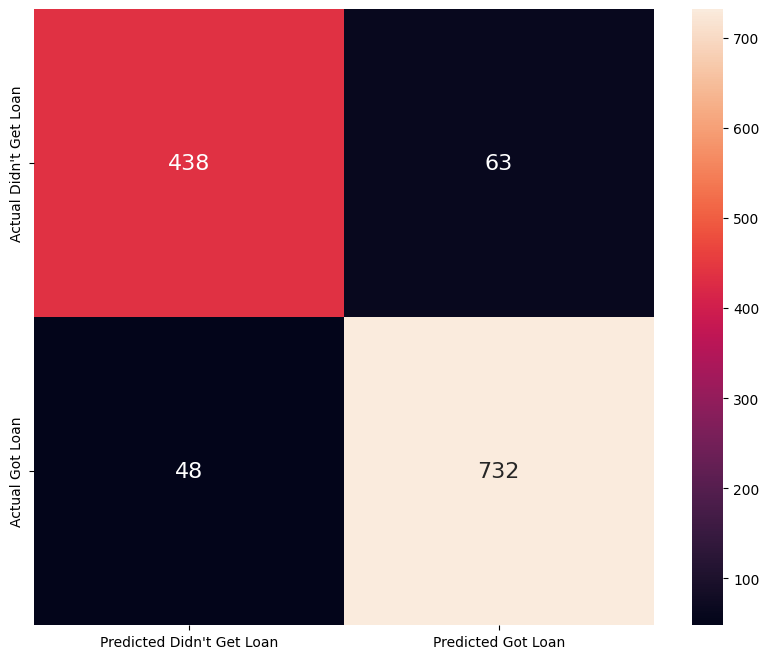

In [ ]:
from sklearn.metrics import confusion_matrix

logistic_conf_mat = confusion_matrix(Y_test, logisticpredictions)

logistic_conf_frame = pd.DataFrame(logistic_conf_mat, columns=['Predicted Didn\'t Get Loan', 'Predicted Got Loan'], index=['Actual Didn\'t Get Loan', 'Actual Got Loan'])

sns.heatmap(logistic_conf_frame, annot=True, fmt='d', annot_kws={"size": 16})
plt.show()

Accuracy Score

In [ ]:
from sklearn.metrics import accuracy_score

lr_accuracy = accuracy_score(Y_test, logisticpredictions)
print('Accuracy:', lr_accuracy*100, '%')

acc = (logistic_conf_mat[0][0] + logistic_conf_mat[1][1]) / (logistic_conf_mat[0][0] + logistic_conf_mat[0][1] + logistic_conf_mat[1][0] + logistic_conf_mat[1][1])
print('Calculated Accuracy:', acc*100, '%')

Accuracy: 91.33489461358315 %
Calculated Accuracy: 91.33489461358315 %


Percision

In [ ]:
from sklearn.metrics import precision_score

lr_precision = precision_score(Y_test, logisticpredictions, average='weighted') #average should be eh? binary returns 90.65? Should it even be the rule cuz in the lab notebook, calc and pre are not the same. Eza I removed the average it would return the same as if it is binary.
print('Precision:', lr_precision*100, '%')

pre = (logistic_conf_mat[0][0]) / (logistic_conf_mat[0][0] + logistic_conf_mat[0][1])
print('Calculated Precision:', pre*100, '%')

Precision: 91.31203729615937 %
Calculated Precision: 87.42514970059881 %


Recall

In [ ]:
from sklearn.metrics import recall_score

lr_recall = recall_score(Y_test, logisticpredictions, average='weighted') #same issue, 93.6467 with no average or binary (default)
print('Recall:', lr_recall*100, '%')

rec = (logistic_conf_mat[0][0]) / (logistic_conf_mat[0][0] + logistic_conf_mat[1][0])
print('Calculated Recall:', rec*100, '%')

Recall: 91.33489461358315 %
Calculated Recall: 90.12345679012346 %


F1-score

In [ ]:
from sklearn.metrics import f1_score

lr_f1 = f1_score(Y_test, logisticpredictions, average='weighted')
print('F1 score:', lr_f1*100, '%')

f1their = 2*((lr_precision*lr_recall) / (lr_precision+lr_recall))
print('Calculated F1 Their:', f1their*100, '%')

f1 = 2*((pre*rec) / (pre+rec))
print('Calculated F1:', f1*100, '%')

F1 score: 91.31031275433091 %
Calculated F1 Their: 91.3234645246338 %
Calculated F1: 88.75379939209726 %


ROC Curve & AUC Score

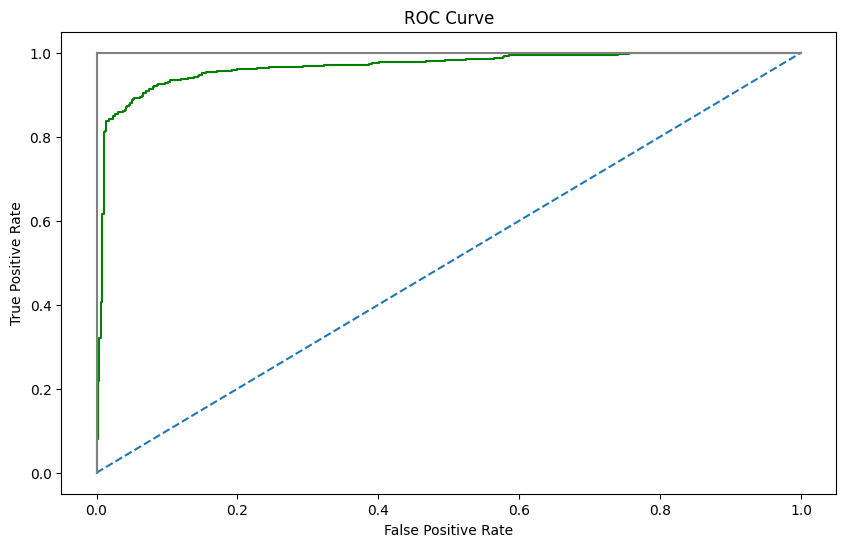

Logistic Regression AUC Score 0.966653871743692


In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
# Get the predicted probabilities
y_pred_prob_LR = log_model.predict_proba(X_test)[:,1]

# Create true and false positive rates
false_positive_rate_LR, true_positive_rate_LR, threshold_LR = roc_curve(Y_test, y_pred_prob_LR)

# Plot ROC curve
plt.figure(figsize=(10,6))
plt.title('ROC Curve')
plt.plot(false_positive_rate_LR, true_positive_rate_LR, c = 'g')
plt.plot([0,1], ls='--')
plt.plot([0,0],[1,0], c='.5')
plt.plot([1,1], c='.5')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# AUC Score
print("Logistic Regression AUC Score", roc_auc_score(Y_test, y_pred_prob_LR))

Decision Boundary

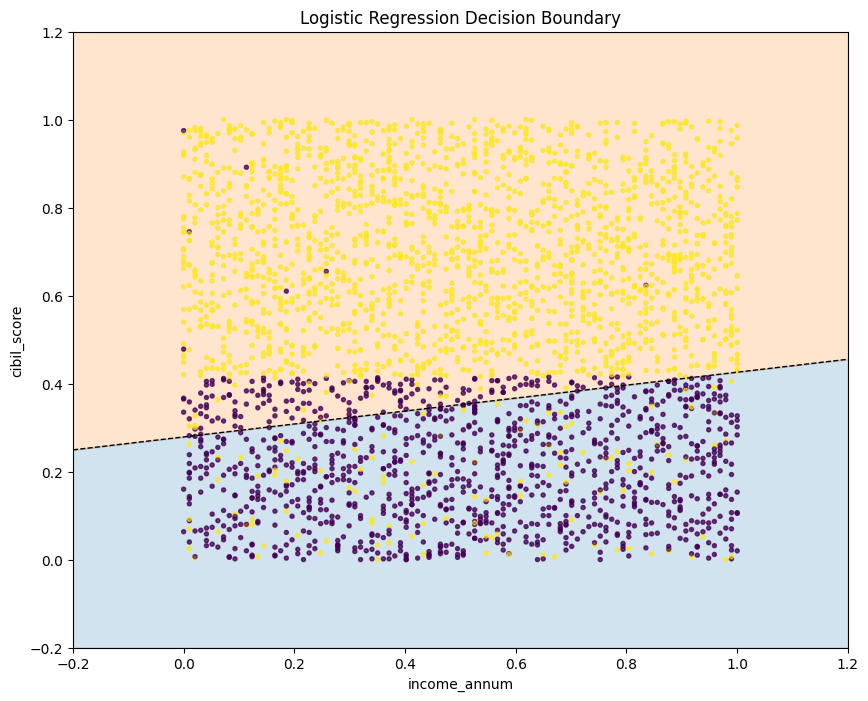

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn.linear_model

X1 = X_train.iloc[:, 3]  # incom_anum
X2 = X_train.iloc[:, 6]  # Cibil score

dataframe = X1.to_frame().reset_index()
X = pd.concat([X1, X2], axis =1)

Y = Y_train.iloc[:].astype('int')  # Class labels (0 or 1)

# Fit the data to a logistic regression model
# clf = sklearn.linear_model.LogisticRegression()
# clf.fit(X, Y)

# Retrieve the model parameters
b = log_model.intercept_[0]
w1= log_model.coef_.T[3]
w2 =  log_model.coef_.T[6]
# b = clf.intercept_[0]
# w1, w2 = clf.coef_.T

# Calculate the intercept and gradient of the decision boundary
c = -b / w2
m = -w1 / w2

# Define the plot boundaries
xmin, xmax = -0.2, 1.2
ymin, ymax = -0.2, 1.2

# Generate the decision boundary line
xd = np.array([xmin, xmax])
yd = m * xd + c

# Plot the data points and decision boundary
plt.plot(xd, yd, 'k', lw=1, ls='--')
plt.fill_between(xd, yd, ymin, color='tab:blue', alpha=0.2)
plt.fill_between(xd, yd, ymax, color='tab:orange', alpha=0.2)
plt.scatter(X.iloc[:, 0] ,X.iloc[:, 1] , c = Y_train.iloc[:],s=8, alpha=0.5)
plt.scatter(X.iloc[:, 0] , X.iloc[:, 1] ,  c = Y_train.iloc[:], s=8, alpha=0.5) #, label='Class 1'
plt.xlim(xmin, xmax)
plt.ylim(ymin, ymax)
plt.xlabel("income_annum")
plt.ylabel("cibil_score")
plt.title('Logistic Regression Decision Boundary')
# plt.legend()
plt.show()

TEST

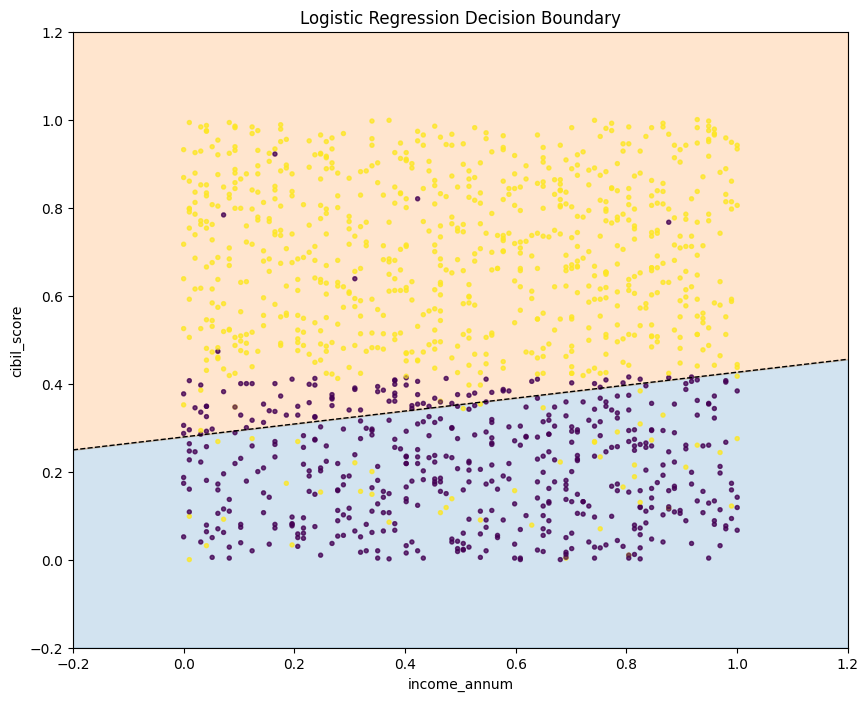

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn.linear_model

X1 = X_test.iloc[:, 3]  # incom_anum
X2 = X_test.iloc[:, 6]  # Cibil score

dataframe = X1.to_frame().reset_index()
X = pd.concat([X1, X2], axis =1)

Y = Y_test.iloc[:].astype('int')  # Class labels (0 or 1)

# Fit the data to a logistic regression model
# clf = sklearn.linear_model.LogisticRegression()
# clf.fit(X, Y)

# Retrieve the model parameters
b = log_model.intercept_[0]
w1= log_model.coef_.T[3]
w2 =  log_model.coef_.T[6]
# b = clf.intercept_[0]
# w1, w2 = clf.coef_.T

# Calculate the intercept and gradient of the decision boundary
c = -b / w2
m = -w1 / w2

# Define the plot boundaries
xmin, xmax = -0.2, 1.2
ymin, ymax = -0.2, 1.2

# Generate the decision boundary line
xd = np.array([xmin, xmax])
yd = m * xd + c

# Plot the data points and decision boundary
plt.plot(xd, yd, 'k', lw=1, ls='--')
plt.fill_between(xd, yd, ymin, color='tab:blue', alpha=0.2)
plt.fill_between(xd, yd, ymax, color='tab:orange', alpha=0.2)
plt.scatter(X.iloc[:, 0] ,X.iloc[:, 1] , c = Y_test.iloc[:],s=8, alpha=0.5)
plt.scatter(X.iloc[:, 0] , X.iloc[:, 1] ,  c = Y_test.iloc[:], s=8, alpha=0.5) #, label='Class 1'
plt.xlim(xmin, xmax)
plt.ylim(ymin, ymax)
plt.xlabel("income_annum")
plt.ylabel("cibil_score")
plt.title('Logistic Regression Decision Boundary')
# plt.legend()
plt.show()

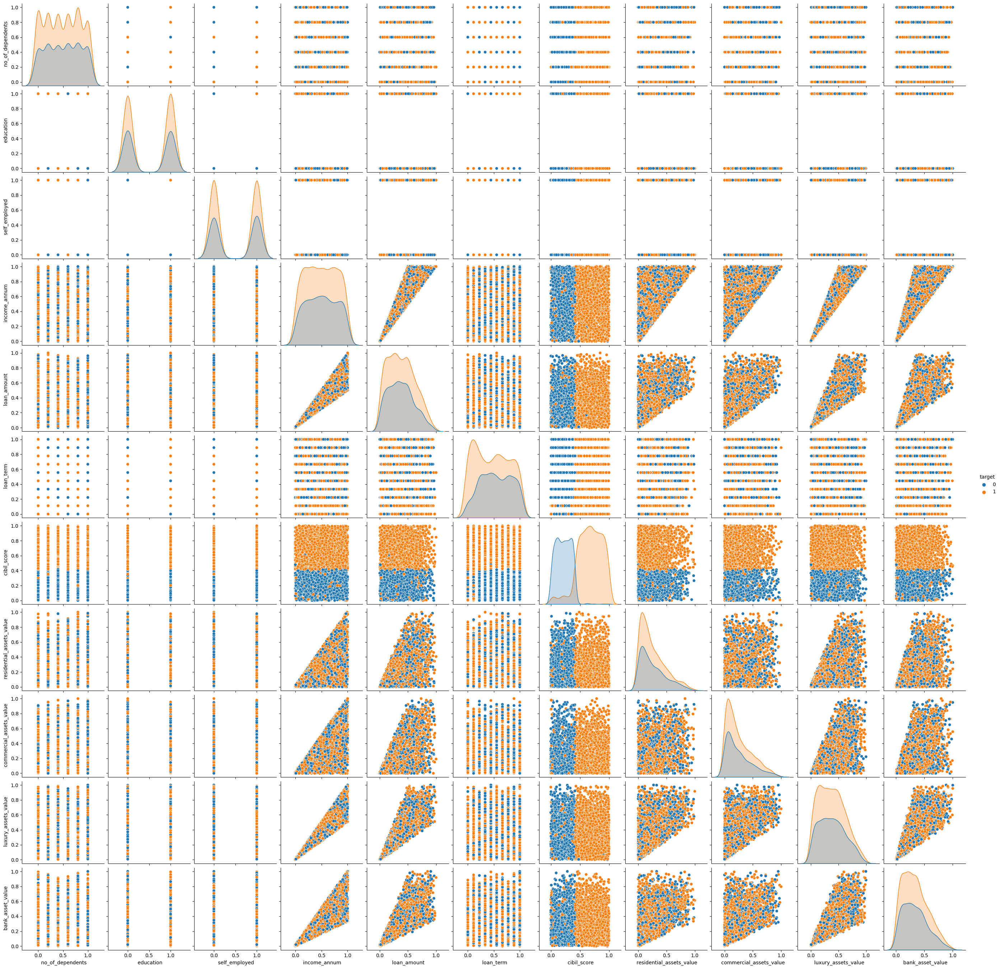

In [ ]:
# Combine features and labels into a DataFrame for pair plot
df_pair_plot = X_train.copy()
df_pair_plot["target"] = Y_train
sns.pairplot(df_pair_plot, hue="target")
plt.show()

## Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB

nb_model = GaussianNB()
nb_model.fit(X_train, Y_train)
naivepredictions = nb_model.predict(X_test)

naivepredictions

array([0, 1, 1, ..., 1, 1, 1])

confusion_matrix

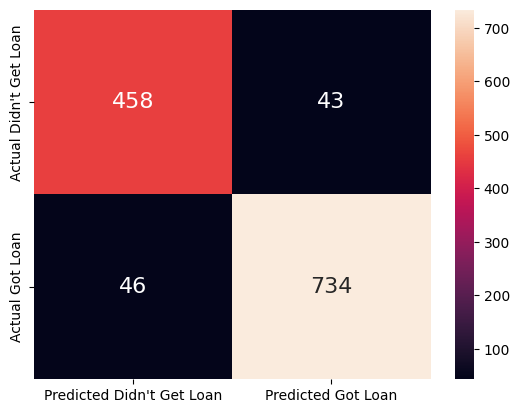

In [ ]:
from sklearn.metrics import confusion_matrix

naive_conf_mat = confusion_matrix(Y_test, naivepredictions)
naive_conf_frame = pd.DataFrame(naive_conf_mat, columns=['Predicted Didn\'t Get Loan', 'Predicted Got Loan'], index=['Actual Didn\'t Get Loan', 'Actual Got Loan'])

sns.heatmap(naive_conf_frame, annot=True, fmt='d', annot_kws={"size": 16})
plt.show()

Accuracy

In [ ]:
from sklearn.metrics import accuracy_score

nb_accuracy = accuracy_score(Y_test, naivepredictions)
print('Accuracy:', nb_accuracy*100, '%')

nacc = (naive_conf_mat[0][0] + naive_conf_mat[1][1]) / (naive_conf_mat[0][0] + naive_conf_mat[0][1] + naive_conf_mat[1][0] + naive_conf_mat[1][1])
print('Calculated Accuracy:', nacc*100, '%')

Accuracy: 93.05230288836846 %
Calculated Accuracy: 93.05230288836846 %


Percision

In [ ]:
from sklearn.metrics import precision_score

nb_precision = precision_score(Y_test, naivepredictions, average='weighted')
print('Precision:', nb_precision*100, '%')

npre = (naive_conf_mat[0][0]) / (naive_conf_mat[0][0] + naive_conf_mat[0][1])
print('Calculated Precision:', npre*100, '%')

Precision: 93.06071712394896 %
Calculated Precision: 91.41716566866268 %


recall

In [ ]:
from sklearn.metrics import recall_score

nb_recall = recall_score(Y_test, naivepredictions, average='weighted')
print('Recall:', nb_recall*100, '%')

nrec = (naive_conf_mat[0][0]) / (naive_conf_mat[0][0] + naive_conf_mat[1][0])
print('Calculated Recall:', nrec*100, '%')

Recall: 93.05230288836846 %
Calculated Recall: 90.87301587301587 %


f1-score

In [ ]:
from sklearn.metrics import f1_score

nb_f1 = f1_score(Y_test, naivepredictions, average='weighted')
print('F1 score:', nb_f1*100, '%')

nf1their = 2 * ((nb_precision * nb_recall) / (nb_precision + nb_recall))
print('Calculated F1 Their:', nf1their*100, '%')

nf1 = 2*((npre*nrec) / (npre+nrec))
print('Calculated F1:', nf1*100, '%')

F1 score: 93.05597923573146 %
Calculated F1 Their: 93.05650981595342 %
Calculated F1: 91.14427860696516 %


ROC Curve & AUC Score

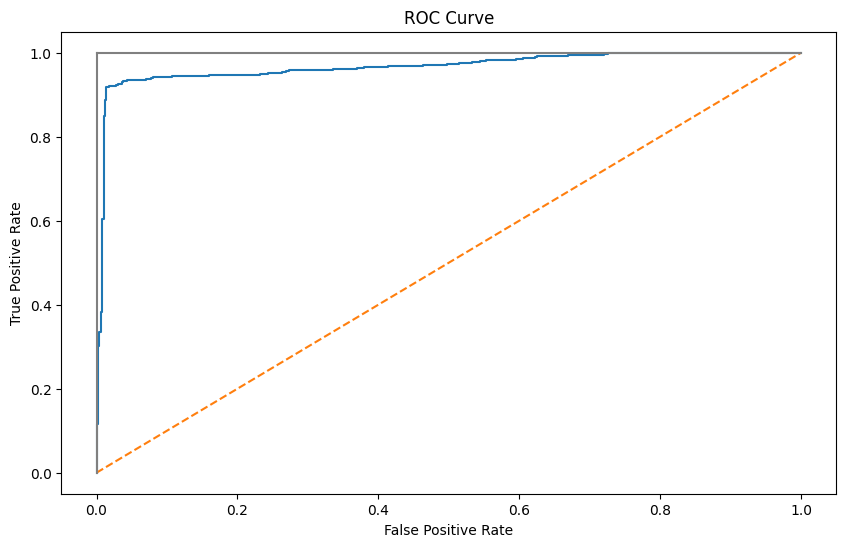

Naive Bayes AUC Score 0.9668227647269564


In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
# Get the predicted probabilities
y_pred_prob_NB = nb_model.predict_proba(X_test)[:,1]

# Create true and false positive rates
false_positive_rate_NB, true_positive_rate_NB, threshold_NB = roc_curve(Y_test, y_pred_prob_NB)

# Plot ROC curve
plt.figure(figsize=(10,6))
plt.title('ROC Curve')
plt.plot(false_positive_rate_NB, true_positive_rate_NB)
plt.plot([0,1], ls='--')
plt.plot([0,0],[1,0], c='.5')
plt.plot([1,1], c='.5')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# AUC Score
print("Naive Bayes AUC Score",roc_auc_score(Y_test, y_pred_prob_NB))

## Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(n_estimators=100, max_depth=2, random_state=42)
rf_model.fit(X_train, Y_train)
forestpredictions = rf_model.predict(X_test)

forestpredictions

array([0, 1, 1, ..., 1, 1, 1])

confusion Matrix

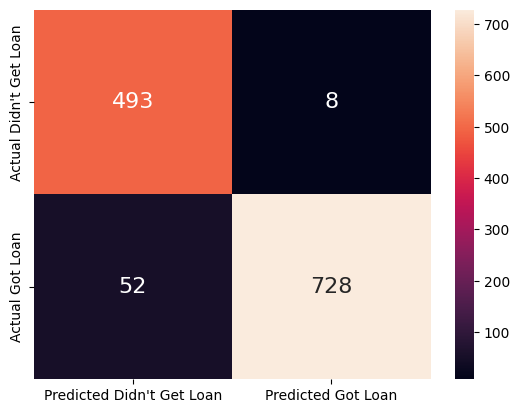

In [ ]:
from sklearn.metrics import confusion_matrix

forest_conf_mat = confusion_matrix(Y_test, forestpredictions)
forest_conf_frame = pd.DataFrame(forest_conf_mat, columns=['Predicted Didn\'t Get Loan', 'Predicted Got Loan'], index=['Actual Didn\'t Get Loan', 'Actual Got Loan'])

sns.heatmap(forest_conf_frame, annot=True, fmt='d', annot_kws={"size": 16})
plt.show()

Accuracy

In [ ]:
from sklearn.metrics import accuracy_score

rf_accuracy = accuracy_score(Y_test, forestpredictions)
print('Accuracy:', rf_accuracy*100, '%')

facc = (forest_conf_mat[0][0] + forest_conf_mat[1][1]) / (forest_conf_mat[0][0] + forest_conf_mat[0][1] + forest_conf_mat[1][0] + forest_conf_mat[1][1])
print('Calculated Accuracy:', facc*100, '%')

Accuracy: 95.31615925058547 %
Calculated Accuracy: 95.31615925058547 %


Percision

In [ ]:
from sklearn.metrics import precision_score

rf_precision = precision_score(Y_test, forestpredictions, average='weighted')
print('Precision:', rf_precision*100, '%')

fpre = (forest_conf_mat[0][0]) / (forest_conf_mat[0][0] + forest_conf_mat[0][1])
print('Calculated Precision:', fpre*100, '%')

Precision: 95.60654990382899 %
Calculated Precision: 98.40319361277446 %


recall

In [ ]:
from sklearn.metrics import recall_score

rf_recall = recall_score(Y_test, forestpredictions, average='weighted')
print('Recall:', rf_recall*100, '%')

frec = (forest_conf_mat[0][0]) / (forest_conf_mat[0][0] + forest_conf_mat[1][0])
print('Calculated Recall:', frec*100, '%')

Recall: 95.31615925058547 %
Calculated Recall: 90.45871559633028 %


f1-score

In [ ]:
from sklearn.metrics import f1_score

rf_f1 = f1_score(Y_test, forestpredictions, average='weighted')
print('F1 score:', rf_f1*100, '%')

ff1their = 2 * ((rf_precision * rf_recall) / (rf_precision + rf_recall))
print('Calculated F1 Their:', ff1their*100, '%')

ff1 = 2*((fpre * frec) / (fpre + frec))
print('Calculated F1:', ff1*100, '%')

F1 score: 95.34670084978542 %
Calculated F1 Their: 95.46113373723522 %
Calculated F1: 94.26386233269598 %


ROC Curve & AUC Score

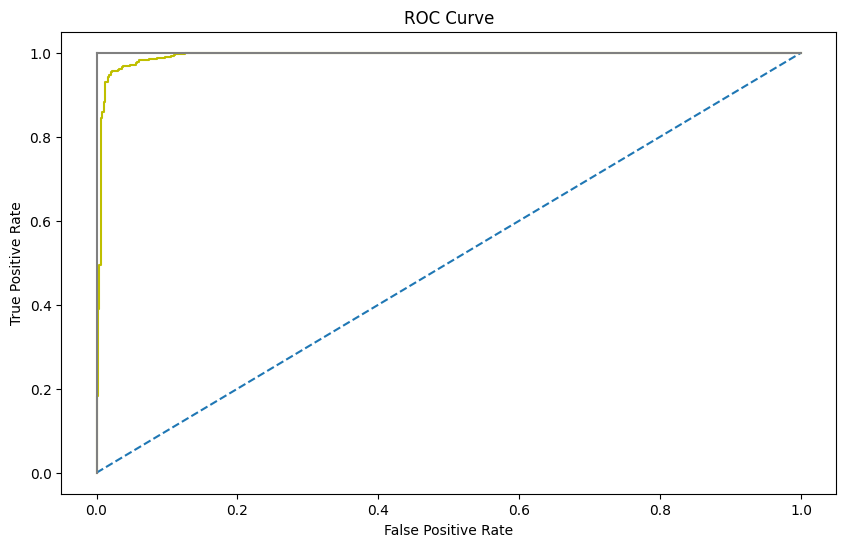

Random Forest AUC Score 0.9927043349199038


In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
# Get the predicted probabilities
y_pred_prob_RF = rf_model.predict_proba(X_test)[:,1]

# Create true and false positive rates
false_positive_rate_RF, true_positive_rate_RF, threshold_RF = roc_curve(Y_test, y_pred_prob_RF)

# Plot ROC curve
plt.figure(figsize=(10,6))
plt.title('ROC Curve')
plt.plot(false_positive_rate_RF, true_positive_rate_RF, c= 'y')
plt.plot([0,1], ls='--')
plt.plot([0,0],[1,0], c='.5')
plt.plot([1,1], c='.5')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# AUC Score
print("Random Forest AUC Score",roc_auc_score(Y_test, y_pred_prob_RF))

## Comparing the Models

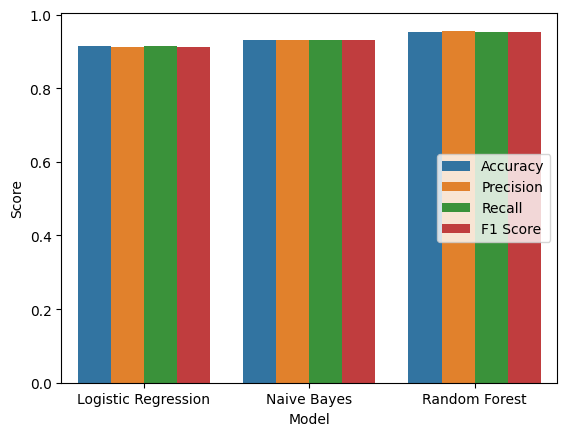

In [ ]:
metrics_df = pd.DataFrame({ 'Model' : ['Logistic Regression', 'Naive Bayes', 'Random Forest', 'Logistic Regression', 'Naive Bayes', 'Random Forest', 'Logistic Regression', 'Naive Bayes', 'Random Forest', 'Logistic Regression', 'Naive Bayes', 'Random Forest'],
                            'Metric' : ['Accuracy', 'Accuracy', 'Accuracy', 'Precision', 'Precision', 'Precision', 'Recall', 'Recall', 'Recall', 'F1 Score', 'F1 Score', 'F1 Score'],
                            'Score' : [lr_accuracy, nb_accuracy, rf_accuracy, lr_precision, nb_precision, rf_precision, lr_recall, nb_recall, rf_recall, lr_f1, nb_f1, rf_f1]})

sns.barplot(x='Model', y='Score', hue='Metric', data=metrics_df)
plt.legend(loc='center right')
plt.show()

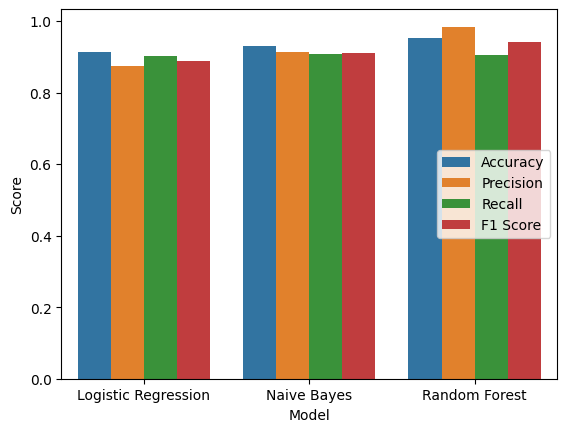

In [ ]:
metrics_df = pd.DataFrame({ 'Model' : ['Logistic Regression', 'Naive Bayes', 'Random Forest', 'Logistic Regression', 'Naive Bayes', 'Random Forest', 'Logistic Regression', 'Naive Bayes', 'Random Forest', 'Logistic Regression', 'Naive Bayes', 'Random Forest'],
                            'Metric' : ['Accuracy', 'Accuracy', 'Accuracy', 'Precision', 'Precision', 'Precision', 'Recall', 'Recall', 'Recall', 'F1 Score', 'F1 Score', 'F1 Score'],
                            'Score' : [acc, nacc, facc, pre, npre, fpre, rec, nrec, frec, f1, nf1, ff1]})

sns.barplot(x='Model', y='Score', hue='Metric', data=metrics_df)
plt.legend(loc='center right')
plt.show()

ROC Curve and AUC Score Comparison

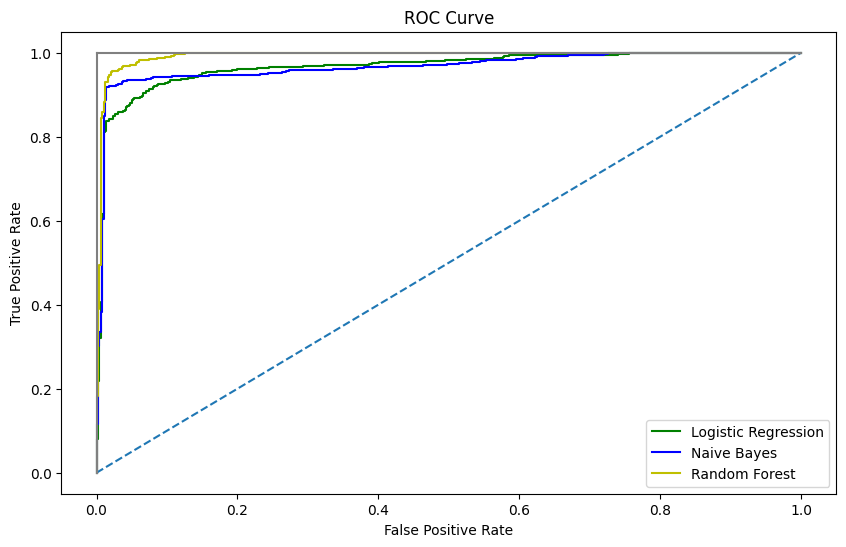

Logistic Regression AUC Score 0.966653871743692
Naive Bayes AUC Score 0.9668227647269564
Random Forest AUC Score 0.9927043349199038


In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

# Plot ROC curve
plt.figure(figsize=(10,6))
plt.title('ROC Curve')
plt.plot(false_positive_rate_LR, true_positive_rate_LR, c = 'g', label= "Logistic Regression")
plt.plot(false_positive_rate_NB, true_positive_rate_NB, c='b', label = "Naive Bayes")
plt.plot(false_positive_rate_RF, true_positive_rate_RF, c= 'y', label = "Random Forest")
plt.legend(loc="lower right")
plt.plot([0,1], ls='--')
plt.plot([0,0],[1,0], c='.5')
plt.plot([1,1], c='.5')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# AUC Scores
print("Logistic Regression AUC Score", roc_auc_score(Y_test, y_pred_prob_LR))
print("Naive Bayes AUC Score",roc_auc_score(Y_test, y_pred_prob_NB))
print("Random Forest AUC Score",roc_auc_score(Y_test, y_pred_prob_RF))

# Classification with PCA

In [ ]:
df_pca_classification = df_copy3.copy()

In [ ]:
df_pca_classification

,PC1,PC2,PC3,PC4,PC5,PC6
0,1.009052,0.004598,0.714347,-0.124848,0.045475,0.313123
1,-1.001219,0.006900,-0.282233,-0.458174,-0.243740,-0.316992
2,1.006831,-0.003265,0.774381,0.025907,0.510866,-0.161479
3,1.007955,-0.003333,0.588522,0.126191,-0.150216,-0.206717
4,-0.994182,-0.004843,0.653235,0.430604,0.548778,-0.358374
...,...,...,...,...,...,...
4264,-0.004461,-0.987998,-0.727510,0.502406,0.127795,-0.469769
4265,-1.004846,0.009506,-0.319349,-0.563341,0.422297,-0.106327
4266,0.001708,1.005022,0.343075,-0.150261,0.358107,-0.245978
4267,-0.001127,1.006945,-0.128179,-0.278810,-0.190280,0.288999


In [ ]:
#Importing the dataset as a pandas dataframe
dataset = '/content/drive/MyDrive/ML Labs/Project/loan_approval_dataset.csv'
df4 = pd.read_csv(dataset)
df4

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
0,1,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved
1,2,0,Not Graduate,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected
2,3,3,Graduate,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected
3,4,3,Graduate,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected
4,5,5,Not Graduate,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4264,4265,5,Graduate,Yes,1000000,2300000,12,317,2800000,500000,3300000,800000,Rejected
4265,4266,0,Not Graduate,Yes,3300000,11300000,20,559,4200000,2900000,11000000,1900000,Approved
4266,4267,2,Not Graduate,No,6500000,23900000,18,457,1200000,12400000,18100000,7300000,Rejected
4267,4268,1,Not Graduate,No,4100000,12800000,8,780,8200000,700000,14100000,5800000,Approved


In [ ]:
df4[ ' education'] = df4[ ' education'].replace({' Graduate': 1, ' Not Graduate': 0})
df4[' self_employed'] = df4[' self_employed'].replace({' No': 0, ' Yes': 1})
df4[' loan_status'] = df4[' loan_status'].replace({' Approved': 1, ' Rejected': 0})

In [ ]:
from sklearn import linear_model
from sklearn import preprocessing
from sklearn import metrics

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split

#Split data into Train/Test
X_train,X_test,Y_train,Y_test = train_test_split(df_pca_classification, df4[' loan_status'] , test_size=0.3)

# Show the first 5 rows of the dataframe
X_train.head()

,PC1,PC2,PC3,PC4,PC5,PC6
229,-1.006060,0.011765,-0.695906,0.100385,0.072952,-0.173421
1647,-1.000688,0.007259,-0.301921,0.321069,-0.114142,0.072721
1805,0.008945,0.993688,1.078590,0.418686,0.561092,-0.021129
2664,-0.005811,1.013860,-0.741920,-0.408150,-0.564648,-0.279275
3061,-1.003132,0.008151,-0.230182,-0.168065,0.391908,0.468899


## Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression

log_model = LogisticRegression()
log_model.fit(X_train, Y_train)
print(log_model.intercept_)
print(log_model.coef_)
# Make predictions on the test data
logisticpredictions = log_model.predict(X_test)

logisticpredictions

[1.38474243]
[[-6.30276566e-03 -3.48527007e-02 -1.77944746e-01 -3.04233557e-02
  -1.71170026e+00  1.14892063e+01]]


array([1, 1, 0, ..., 0, 1, 1])

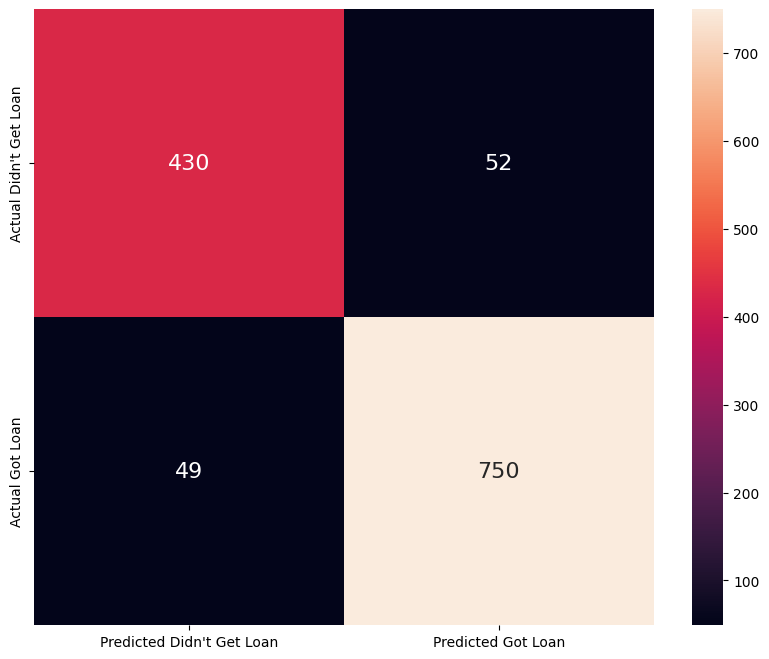

In [ ]:
from sklearn.metrics import confusion_matrix

logistic_conf_mat = confusion_matrix(Y_test, logisticpredictions)

logistic_conf_frame = pd.DataFrame(logistic_conf_mat, columns=['Predicted Didn\'t Get Loan', 'Predicted Got Loan'], index=['Actual Didn\'t Get Loan', 'Actual Got Loan'])

sns.heatmap(logistic_conf_frame, annot=True, fmt='d', annot_kws={"size": 16})
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score

lr_accuracy = accuracy_score(Y_test, logisticpredictions)
print('Accuracy:', lr_accuracy*100, '%')

acc = (logistic_conf_mat[0][0] + logistic_conf_mat[1][1]) / (logistic_conf_mat[0][0] + logistic_conf_mat[0][1] + logistic_conf_mat[1][0] + logistic_conf_mat[1][1])
print('Calculated Accuracy:', acc*100, '%')

Accuracy: 92.11553473848556 %
Calculated Accuracy: 92.11553473848556 %


In [ ]:
from sklearn.metrics import precision_score

lr_precision = precision_score(Y_test, logisticpredictions, average='weighted') #average should be eh? binary returns 90.65? Should it even be the rule cuz in the lab notebook, calc and pre are not the same. Eza I removed the average it would return the same as if it is binary.
print('Precision:', lr_precision*100, '%')

pre = (logistic_conf_mat[0][0]) / (logistic_conf_mat[0][0] + logistic_conf_mat[0][1])
print('Calculated Precision:', pre*100, '%')

Precision: 92.1067622453468 %
Calculated Precision: 89.21161825726142 %


In [ ]:
from sklearn.metrics import recall_score

lr_recall = recall_score(Y_test, logisticpredictions, average='weighted') #same issue, 93.6467 with no average or binary (default)
print('Recall:', lr_recall*100, '%')

rec = (logistic_conf_mat[0][0]) / (logistic_conf_mat[0][0] + logistic_conf_mat[1][0])
print('Calculated Recall:', rec*100, '%')

Recall: 92.11553473848556 %
Calculated Recall: 89.77035490605428 %


In [ ]:
from sklearn.metrics import f1_score

lr_f1 = f1_score(Y_test, logisticpredictions, average='weighted')
print('F1 score:', lr_f1*100, '%')

f1their = 2*((lr_precision*lr_recall) / (lr_precision+lr_recall))
print('Calculated F1 Their:', f1their*100, '%')

f1 = 2*((pre*rec) / (pre+rec))
print('Calculated F1:', f1*100, '%')

F1 score: 92.11061515021377 %
Calculated F1 Their: 92.11114828304724 %
Calculated F1: 89.4901144640999 %


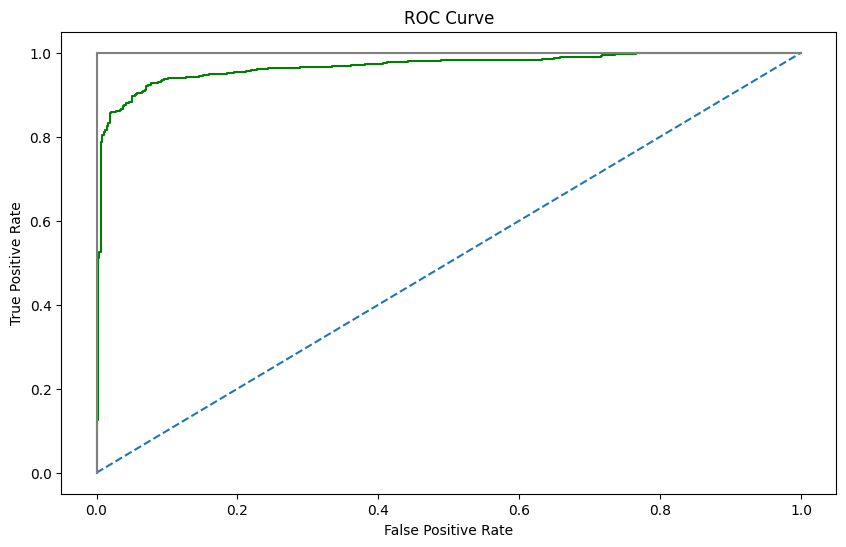

Logistic Regression AUC Score 0.9676774391225547


In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
# Get the predicted probabilities
y_pred_prob_LR = log_model.predict_proba(X_test)[:,1]

# Create true and false positive rates
false_positive_rate_LR, true_positive_rate_LR, threshold_LR = roc_curve(Y_test, y_pred_prob_LR)

# Plot ROC curve
plt.figure(figsize=(10,6))
plt.title('ROC Curve')
plt.plot(false_positive_rate_LR, true_positive_rate_LR, c = 'g')
plt.plot([0,1], ls='--')
plt.plot([0,0],[1,0], c='.5')
plt.plot([1,1], c='.5')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# AUC Score
print("Logistic Regression AUC Score", roc_auc_score(Y_test, y_pred_prob_LR))

decision boundary

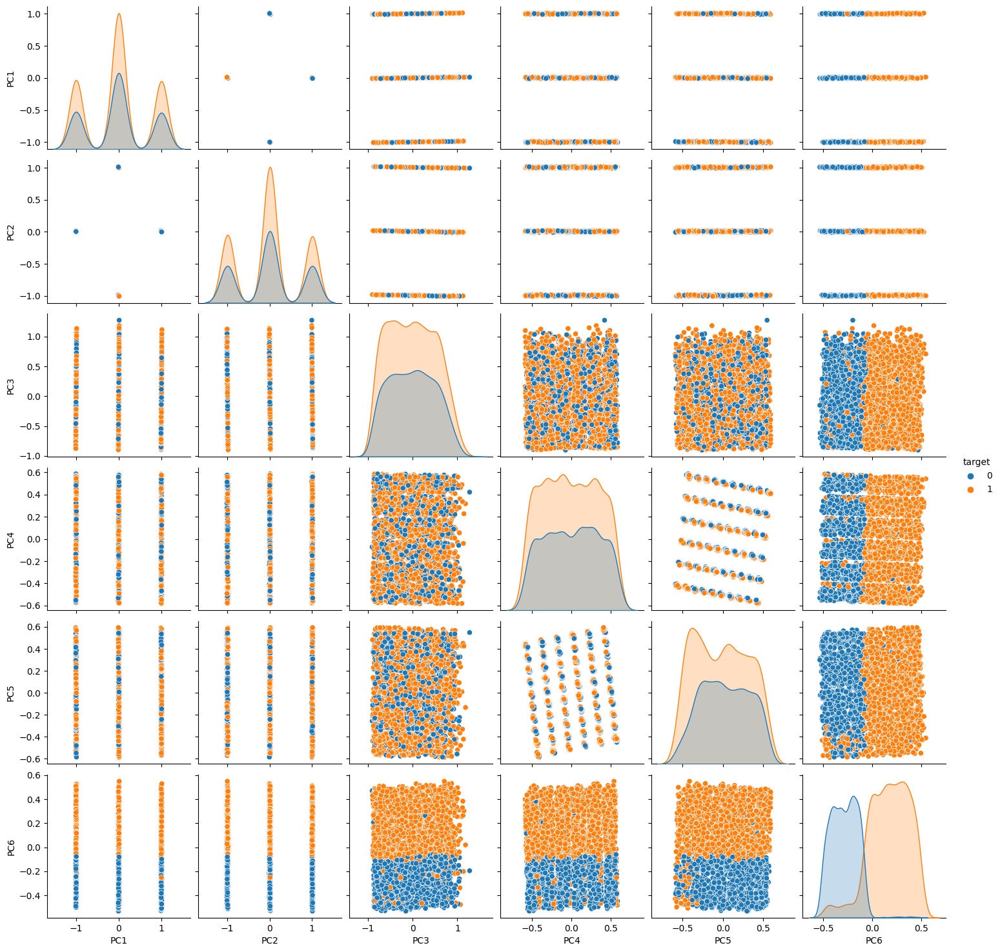

In [ ]:
# Combine features and labels into a DataFrame for pair plot
df_pair_plot = X_train.copy()
df_pair_plot["target"] = Y_train
sns.pairplot(df_pair_plot, hue="target")
plt.show()

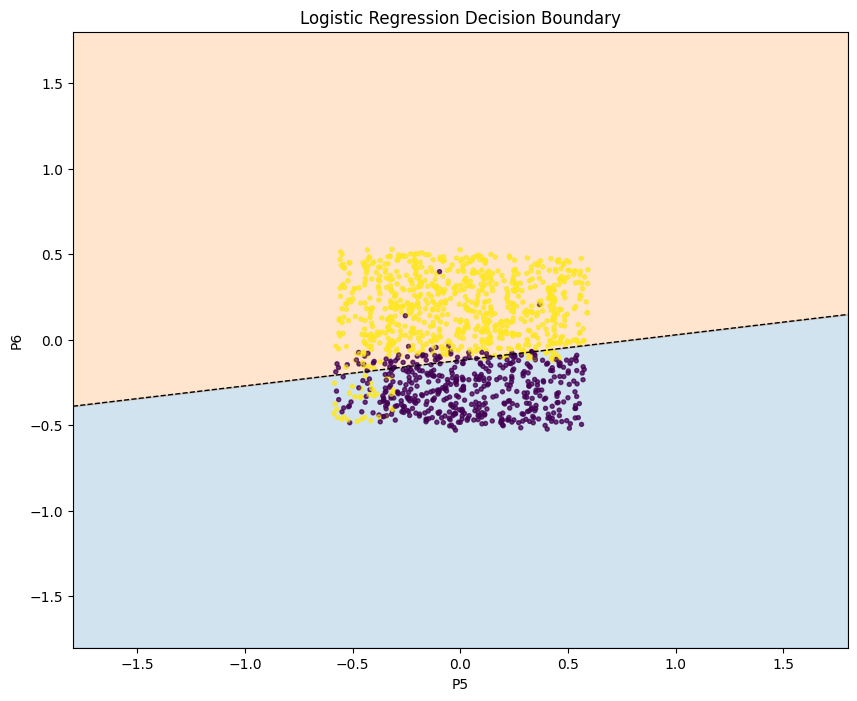

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn.linear_model

X1 = X_test.iloc[:, 4]  # P5
X2 = X_test.iloc[:, 5]  # P6

dataframe = X1.to_frame().reset_index()
X = pd.concat([X1, X2], axis =1)

Y = Y_test.iloc[:].astype('int')  # Class labels (0 or 1)

# Fit the data to a logistic regression model
# clf = sklearn.linear_model.LogisticRegression()
# clf.fit(X, Y)

# Retrieve the model parameters
b = log_model.intercept_[0]
w1= log_model.coef_.T[4]
w2 =  log_model.coef_.T[5]
# b = clf.intercept_[0]
# w1, w2 = clf.coef_.T

# Calculate the intercept and gradient of the decision boundary
c = -b / w2
m = -w1 / w2

# Define the plot boundaries
xmin, xmax = -1.8, 1.8
ymin, ymax = -1.8, 1.8

# Generate the decision boundary line
xd = np.array([xmin, xmax])
yd = m * xd + c

# Plot the data points and decision boundary
plt.plot(xd, yd, 'k', lw=1, ls='--')
plt.fill_between(xd, yd, ymin, color='tab:blue', alpha=0.2)
plt.fill_between(xd, yd, ymax, color='tab:orange', alpha=0.2)
plt.scatter(X.iloc[:, 0] ,X.iloc[:, 1] , c = Y_test.iloc[:],s=8, alpha=0.5)
plt.scatter(X.iloc[:, 0] , X.iloc[:, 1] ,  c = Y_test.iloc[:], s=8, alpha=0.5) #, label='Class 1'
plt.xlim(xmin, xmax)
plt.ylim(ymin, ymax)
plt.xlabel("P5")
plt.ylabel("P6")
plt.title('Logistic Regression Decision Boundary')
# plt.legend()
plt.show()

## Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB

nb_model = GaussianNB()
nb_model.fit(X_train, Y_train)
naivepredictions = nb_model.predict(X_test)

naivepredictions

array([1, 0, 0, ..., 0, 1, 1])

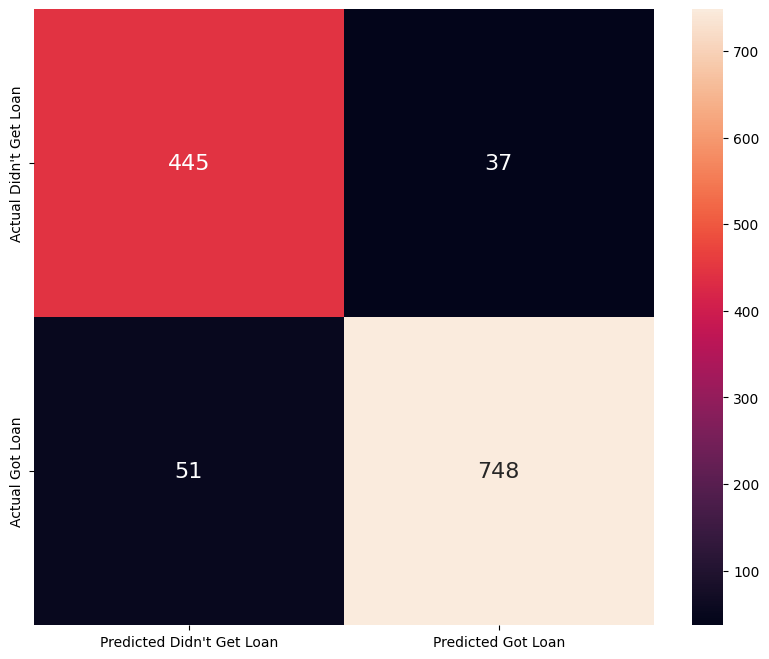

In [ ]:
from sklearn.metrics import confusion_matrix

naive_conf_mat = confusion_matrix(Y_test, naivepredictions)
naive_conf_frame = pd.DataFrame(naive_conf_mat, columns=['Predicted Didn\'t Get Loan', 'Predicted Got Loan'], index=['Actual Didn\'t Get Loan', 'Actual Got Loan'])

sns.heatmap(naive_conf_frame, annot=True, fmt='d', annot_kws={"size": 16})
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score

nb_accuracy = accuracy_score(Y_test, naivepredictions)
print('Accuracy:', nb_accuracy*100, '%')

nacc = (naive_conf_mat[0][0] + naive_conf_mat[1][1]) / (naive_conf_mat[0][0] + naive_conf_mat[0][1] + naive_conf_mat[1][0] + naive_conf_mat[1][1])
print('Calculated Accuracy:', nacc*100, '%')

Accuracy: 93.1303669008587 %
Calculated Accuracy: 93.1303669008587 %


In [ ]:
from sklearn.metrics import precision_score

nb_precision = precision_score(Y_test, naivepredictions, average='weighted')
print('Precision:', nb_precision*100, '%')

npre = (naive_conf_mat[0][0]) / (naive_conf_mat[0][0] + naive_conf_mat[0][1])
print('Calculated Precision:', npre*100, '%')

Precision: 93.19122900215203 %
Calculated Precision: 92.32365145228216 %


In [ ]:
from sklearn.metrics import recall_score

nb_recall = recall_score(Y_test, naivepredictions, average='weighted')
print('Recall:', nb_recall*100, '%')

nrec = (naive_conf_mat[0][0]) / (naive_conf_mat[0][0] + naive_conf_mat[1][0])
print('Calculated Recall:', nrec*100, '%')

Recall: 93.1303669008587 %
Calculated Recall: 89.71774193548387 %


In [ ]:
from sklearn.metrics import f1_score

nb_f1 = f1_score(Y_test, naivepredictions, average='weighted')
print('F1 score:', nb_f1*100, '%')

nf1their = 2 * ((nb_precision * nb_recall) / (nb_precision + nb_recall))
print('Calculated F1 Their:', nf1their*100, '%')

nf1 = 2*((npre*nrec) / (npre+nrec))
print('Calculated F1:', nf1*100, '%')

F1 score: 93.14917782684051 %
Calculated F1 Their: 93.16078801117784 %
Calculated F1: 91.00204498977506 %


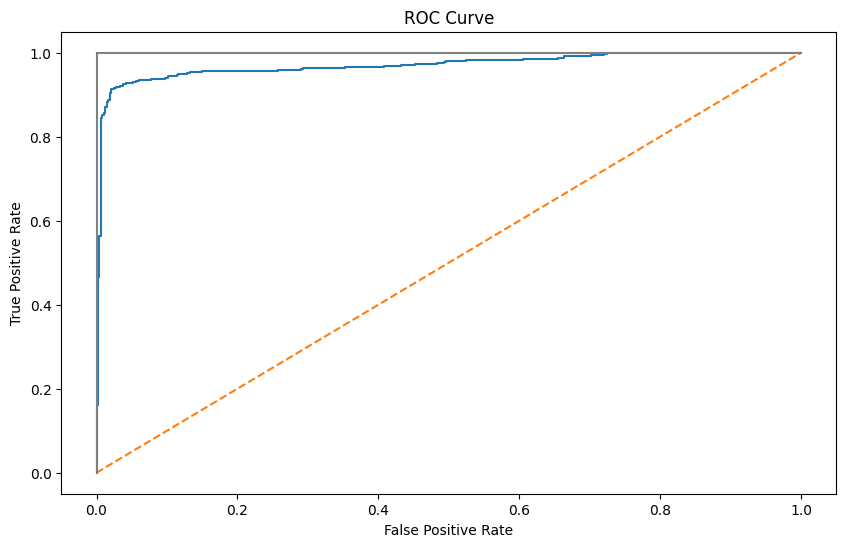

Naive Bayes AUC Score 0.9704220524618429


In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
# Get the predicted probabilities
y_pred_prob_NB = nb_model.predict_proba(X_test)[:,1]

# Create true and false positive rates
false_positive_rate_NB, true_positive_rate_NB, threshold_NB = roc_curve(Y_test, y_pred_prob_NB)

# Plot ROC curve
plt.figure(figsize=(10,6))
plt.title('ROC Curve')
plt.plot(false_positive_rate_NB, true_positive_rate_NB)
plt.plot([0,1], ls='--')
plt.plot([0,0],[1,0], c='.5')
plt.plot([1,1], c='.5')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# AUC Score
print("Naive Bayes AUC Score",roc_auc_score(Y_test, y_pred_prob_NB))

## Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(n_estimators=100, max_depth=2, random_state=42)
rf_model.fit(X_train, Y_train)
forestpredictions = rf_model.predict(X_test)

forestpredictions

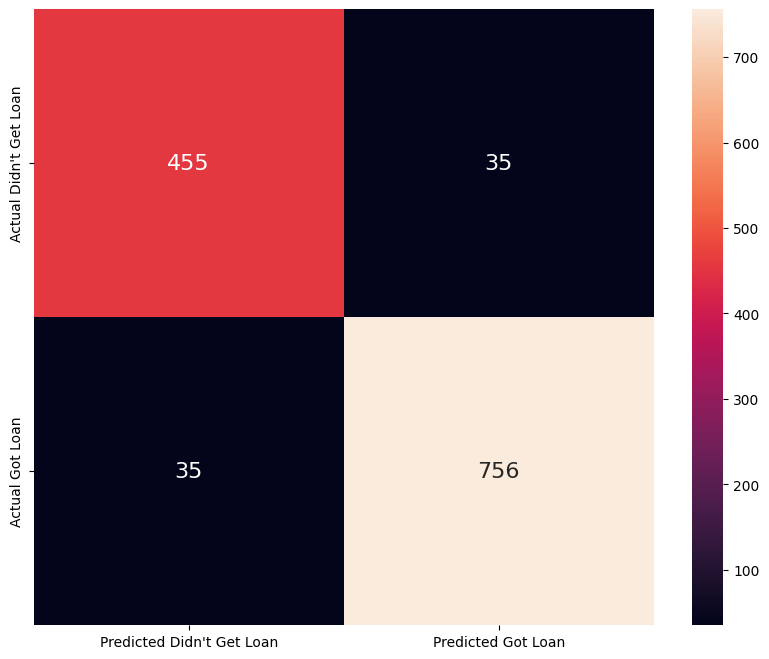

In [ ]:
from sklearn.metrics import confusion_matrix

forest_conf_mat = confusion_matrix(Y_test, forestpredictions)
forest_conf_frame = pd.DataFrame(forest_conf_mat, columns=['Predicted Didn\'t Get Loan', 'Predicted Got Loan'], index=['Actual Didn\'t Get Loan', 'Actual Got Loan'])

sns.heatmap(forest_conf_frame, annot=True, fmt='d', annot_kws={"size": 16})
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score

rf_accuracy = accuracy_score(Y_test, forestpredictions)
print('Accuracy:', rf_accuracy*100, '%')

facc = (forest_conf_mat[0][0] + forest_conf_mat[1][1]) / (forest_conf_mat[0][0] + forest_conf_mat[0][1] + forest_conf_mat[1][0] + forest_conf_mat[1][1])
print('Calculated Accuracy:', facc*100, '%')

Accuracy: 94.53551912568307 %
Calculated Accuracy: 94.53551912568307 %


In [ ]:
from sklearn.metrics import precision_score

rf_precision = precision_score(Y_test, forestpredictions, average='weighted')
print('Precision:', rf_precision*100, '%')

fpre = (forest_conf_mat[0][0]) / (forest_conf_mat[0][0] + forest_conf_mat[0][1])
print('Calculated Precision:', fpre*100, '%')

Precision: 94.53551912568307 %
Calculated Precision: 92.85714285714286 %


In [ ]:
from sklearn.metrics import recall_score

rf_recall = recall_score(Y_test, forestpredictions, average='weighted')
print('Recall:', rf_recall*100, '%')

frec = (forest_conf_mat[0][0]) / (forest_conf_mat[0][0] + forest_conf_mat[1][0])
print('Calculated Recall:', frec*100, '%')

Recall: 94.53551912568307 %
Calculated Recall: 92.85714285714286 %


In [ ]:
from sklearn.metrics import f1_score

rf_f1 = f1_score(Y_test, forestpredictions, average='weighted')
print('F1 score:', rf_f1*100, '%')

ff1their = 2 * ((rf_precision * rf_recall) / (rf_precision + rf_recall))
print('Calculated F1 Their:', ff1their*100, '%')

ff1 = 2*((fpre * frec) / (fpre + frec))
print('Calculated F1:', ff1*100, '%')

F1 score: 94.53551912568307 %
Calculated F1 Their: 94.53551912568307 %
Calculated F1: 92.85714285714286 %


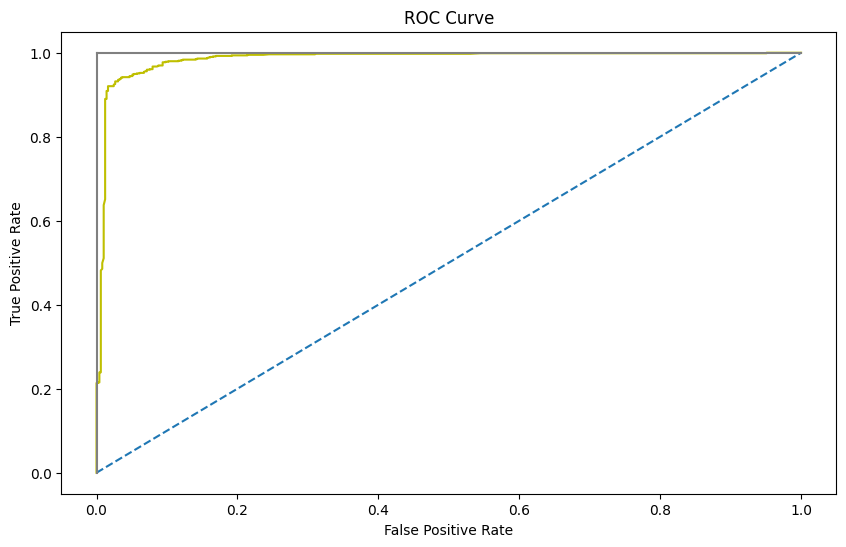

Random Forest AUC Score 0.9849415619598029


In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
# Get the predicted probabilities
y_pred_prob_RF = rf_model.predict_proba(X_test)[:,1]

# Create true and false positive rates
false_positive_rate_RF, true_positive_rate_RF, threshold_RF = roc_curve(Y_test, y_pred_prob_RF)

# Plot ROC curve
plt.figure(figsize=(10,6))
plt.title('ROC Curve')
plt.plot(false_positive_rate_RF, true_positive_rate_RF, c= 'y')
plt.plot([0,1], ls='--')
plt.plot([0,0],[1,0], c='.5')
plt.plot([1,1], c='.5')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# AUC Score
print("Random Forest AUC Score",roc_auc_score(Y_test, y_pred_prob_RF))

## Comparing the Models

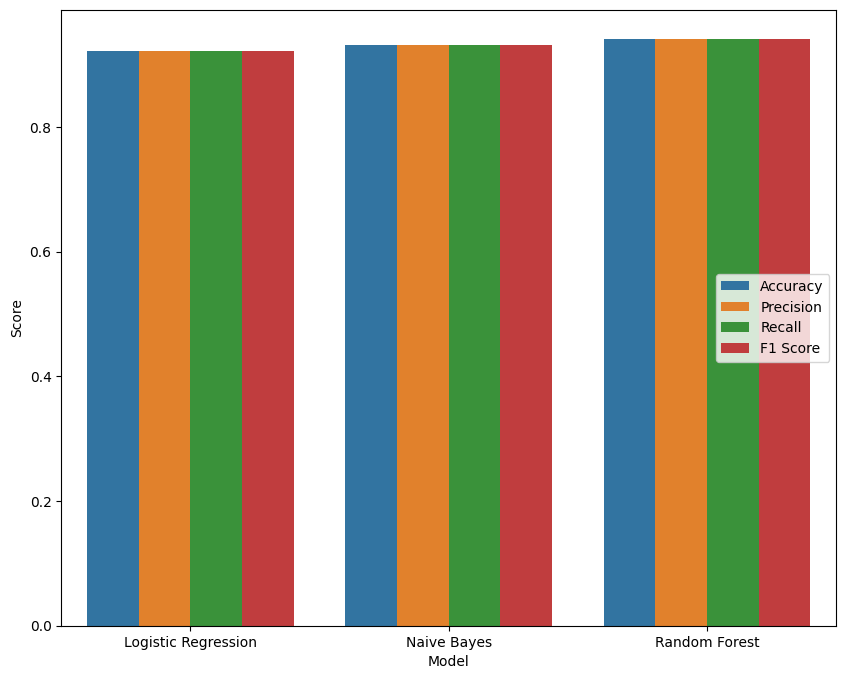

In [ ]:
metrics_df = pd.DataFrame({ 'Model' : ['Logistic Regression', 'Naive Bayes', 'Random Forest', 'Logistic Regression', 'Naive Bayes', 'Random Forest', 'Logistic Regression', 'Naive Bayes', 'Random Forest', 'Logistic Regression', 'Naive Bayes', 'Random Forest'],
                            'Metric' : ['Accuracy', 'Accuracy', 'Accuracy', 'Precision', 'Precision', 'Precision', 'Recall', 'Recall', 'Recall', 'F1 Score', 'F1 Score', 'F1 Score'],
                            'Score' : [lr_accuracy, nb_accuracy, rf_accuracy, lr_precision, nb_precision, rf_precision, lr_recall, nb_recall, rf_recall, lr_f1, nb_f1, rf_f1]})

sns.barplot(x='Model', y='Score', hue='Metric', data=metrics_df)
plt.legend(loc='center right')
plt.show()

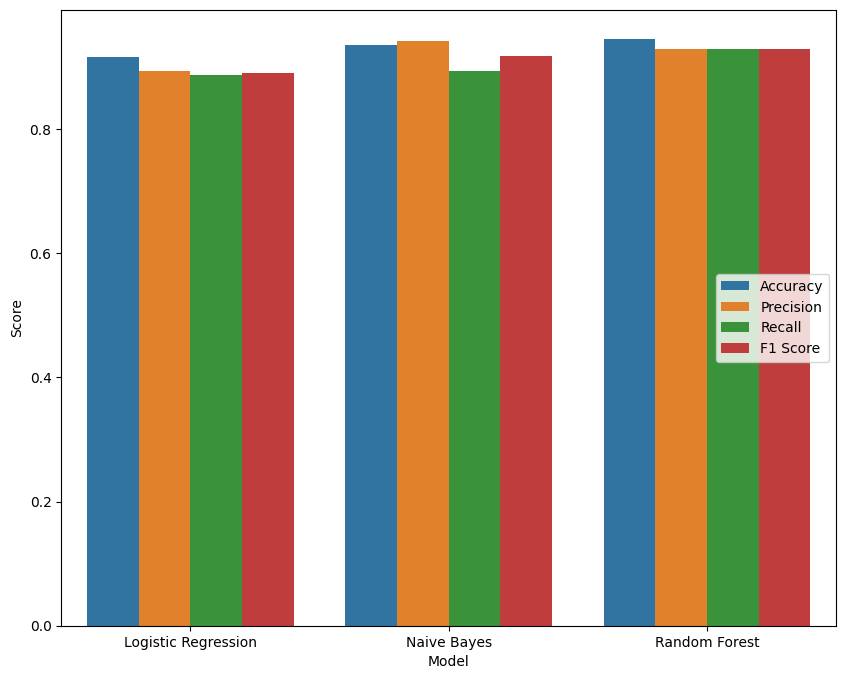

In [ ]:
metrics_df = pd.DataFrame({ 'Model' : ['Logistic Regression', 'Naive Bayes', 'Random Forest', 'Logistic Regression', 'Naive Bayes', 'Random Forest', 'Logistic Regression', 'Naive Bayes', 'Random Forest', 'Logistic Regression', 'Naive Bayes', 'Random Forest'],
                            'Metric' : ['Accuracy', 'Accuracy', 'Accuracy', 'Precision', 'Precision', 'Precision', 'Recall', 'Recall', 'Recall', 'F1 Score', 'F1 Score', 'F1 Score'],
                            'Score' : [acc, nacc, facc, pre, npre, fpre, rec, nrec, frec, f1, nf1, ff1]})

sns.barplot(x='Model', y='Score', hue='Metric', data=metrics_df)
plt.legend(loc='center right')
plt.show()

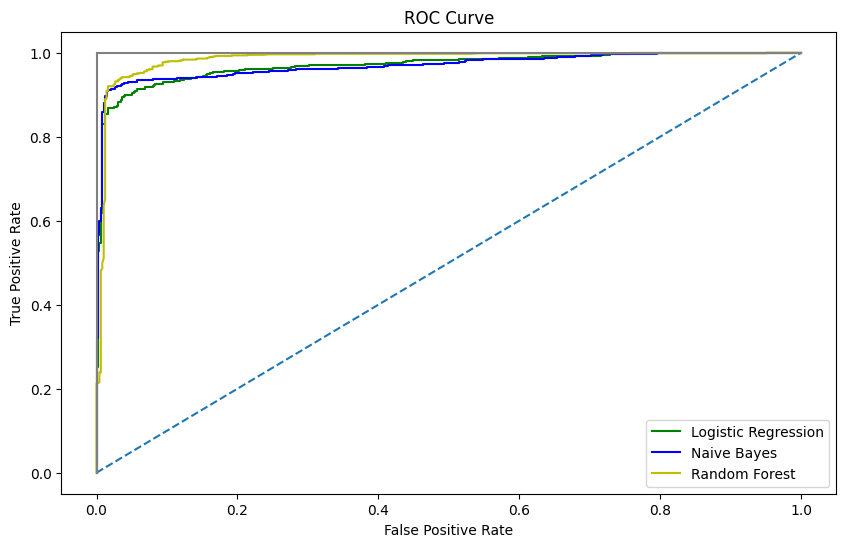

Logistic Regression AUC Score 0.9696638200159963
Naive Bayes AUC Score 0.9692922934028225
Random Forest AUC Score 0.9849415619598029


In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

# Plot ROC curve
plt.figure(figsize=(10,6))
plt.title('ROC Curve')
plt.plot(false_positive_rate_LR, true_positive_rate_LR, c = 'g', label= "Logistic Regression")
plt.plot(false_positive_rate_NB, true_positive_rate_NB, c='b', label = "Naive Bayes")
plt.plot(false_positive_rate_RF, true_positive_rate_RF, c= 'y', label = "Random Forest")
plt.legend(loc="lower right")
plt.plot([0,1], ls='--')
plt.plot([0,0],[1,0], c='.5')
plt.plot([1,1], c='.5')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# AUC Scores
print("Logistic Regression AUC Score", roc_auc_score(Y_test, y_pred_prob_LR))
print("Naive Bayes AUC Score",roc_auc_score(Y_test, y_pred_prob_NB))
print("Random Forest AUC Score",roc_auc_score(Y_test, y_pred_prob_RF))

# Classification with the reduced features version

In [ ]:
df_features_reduced

,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value
0,0.4,1,0,0.969072,0.755102,0.555556,0.796667,0.082474,0.907216
1,0.0,0,1,0.402062,0.303571,0.333333,0.195000,0.092784,0.113402
2,0.6,1,0,0.917526,0.750000,1.000000,0.343333,0.243986,0.231959
3,0.6,1,0,0.824742,0.775510,0.333333,0.278333,0.625430,0.170103
4,1.0,0,1,0.989691,0.609694,1.000000,0.136667,0.426117,0.422680
...,...,...,...,...,...,...,...,...,...
4264,1.0,1,1,0.082474,0.051020,0.555556,0.028333,0.096220,0.025773
4265,0.0,0,1,0.319588,0.280612,1.000000,0.431667,0.144330,0.149485
4266,0.4,0,0,0.649485,0.602041,0.888889,0.261667,0.041237,0.639175
4267,0.2,0,0,0.402062,0.318878,0.333333,0.800000,0.281787,0.036082


In [ ]:
from sklearn import linear_model
from sklearn import preprocessing
from sklearn import metrics

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split

#Split data into Train/Test
X_train,X_test,Y_train,Y_test = train_test_split(df_features_reduced, df4[' loan_status'] , test_size=0.3)

# Show the first 5 rows of the dataframe
X_train.head()

,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value
3191,0.2,1,0,0.742268,0.403061,0.111111,0.591667,0.756014,0.664948
4019,0.0,1,1,0.546392,0.456633,0.111111,0.053333,0.278351,0.206186
77,0.0,1,0,0.907216,0.846939,0.333333,0.835000,0.398625,0.458763
2728,0.0,1,1,0.577320,0.316327,0.555556,0.380000,0.288660,0.376289
39,0.6,0,1,0.134021,0.122449,0.222222,0.086667,0.003436,0.010309


## Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression

log_model = LogisticRegression()
log_model.fit(X_train, Y_train)
print(log_model.intercept_)
print(log_model.coef_)
# Make predictions on the test data
logisticpredictions = log_model.predict(X_test)

logisticpredictions

[-3.1842607]
[[-0.28176171  0.10570052 -0.03992802 -1.84315189  2.47145645 -2.21468818
  11.61857876  0.10971844 -0.06288254]]


array([1, 0, 1, ..., 0, 1, 0])

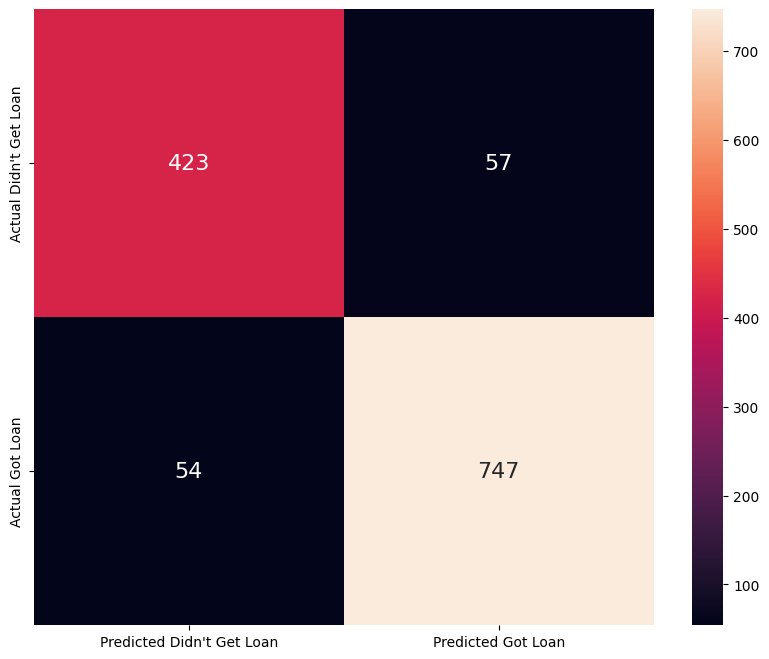

In [ ]:
from sklearn.metrics import confusion_matrix

logistic_conf_mat = confusion_matrix(Y_test, logisticpredictions)

logistic_conf_frame = pd.DataFrame(logistic_conf_mat, columns=['Predicted Didn\'t Get Loan', 'Predicted Got Loan'], index=['Actual Didn\'t Get Loan', 'Actual Got Loan'])

sns.heatmap(logistic_conf_frame, annot=True, fmt='d', annot_kws={"size": 16})
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score

lr_accuracy = accuracy_score(Y_test, logisticpredictions)
print('Accuracy:', lr_accuracy*100, '%')

acc = (logistic_conf_mat[0][0] + logistic_conf_mat[1][1]) / (logistic_conf_mat[0][0] + logistic_conf_mat[0][1] + logistic_conf_mat[1][0] + logistic_conf_mat[1][1])
print('Calculated Accuracy:', acc*100, '%')

Accuracy: 91.33489461358315 %
Calculated Accuracy: 91.33489461358315 %


In [ ]:
from sklearn.metrics import precision_score

lr_precision = precision_score(Y_test, logisticpredictions, average='weighted') #average should be eh? binary returns 90.65? Should it even be the rule cuz in the lab notebook, calc and pre are not the same. Eza I removed the average it would return the same as if it is binary.
print('Precision:', lr_precision*100, '%')

pre = (logistic_conf_mat[0][0]) / (logistic_conf_mat[0][0] + logistic_conf_mat[0][1])
print('Calculated Precision:', pre*100, '%')

Precision: 91.31458161931863 %
Calculated Precision: 87.35177865612648 %


In [ ]:
from sklearn.metrics import recall_score

lr_recall = recall_score(Y_test, logisticpredictions, average='weighted') #same issue, 93.6467 with no average or binary (default)
print('Recall:', lr_recall*100, '%')

rec = (logistic_conf_mat[0][0]) / (logistic_conf_mat[0][0] + logistic_conf_mat[1][0])
print('Calculated Recall:', rec*100, '%')

Recall: 91.33489461358315 %
Calculated Recall: 88.67924528301887 %


In [ ]:
from sklearn.metrics import f1_score

lr_f1 = f1_score(Y_test, logisticpredictions, average='weighted')
print('F1 score:', lr_f1*100, '%')

f1their = 2*((lr_precision*lr_recall) / (lr_precision+lr_recall))
print('Calculated F1 Their:', f1their*100, '%')

f1 = 2*((pre*rec) / (pre+rec))
print('Calculated F1:', f1*100, '%')

F1 score: 91.30787390545491 %
Calculated F1 Their: 91.32473698691648 %
Calculated F1: 88.84422110552764 %


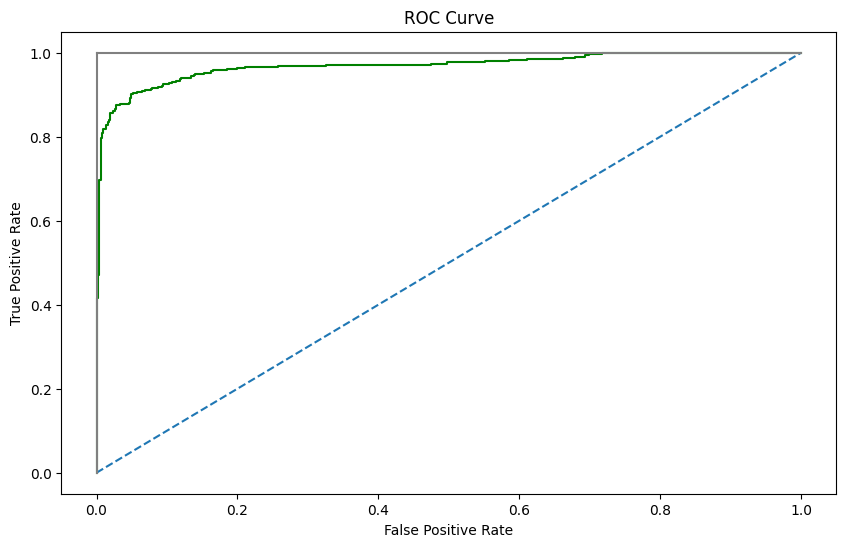

Logistic Regression AUC Score 0.9687874537804411


In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
# Get the predicted probabilities
y_pred_prob_LR = log_model.predict_proba(X_test)[:,1]

# Create true and false positive rates
false_positive_rate_LR, true_positive_rate_LR, threshold_LR = roc_curve(Y_test, y_pred_prob_LR)

# Plot ROC curve
plt.figure(figsize=(10,6))
plt.title('ROC Curve')
plt.plot(false_positive_rate_LR, true_positive_rate_LR, c = 'g')
plt.plot([0,1], ls='--')
plt.plot([0,0],[1,0], c='.5')
plt.plot([1,1], c='.5')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# AUC Score
print("Logistic Regression AUC Score", roc_auc_score(Y_test, y_pred_prob_LR))

decision boundary

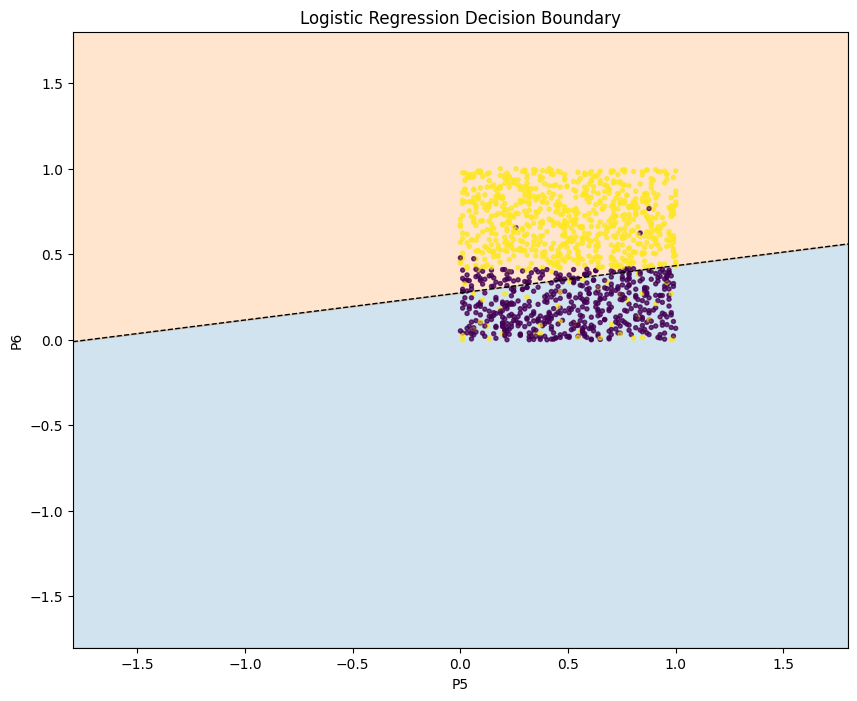

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn.linear_model

X1 = X_test.iloc[:, 3]  # income_annum
X2 = X_test.iloc[:, 6]  # cibil_score

dataframe = X1.to_frame().reset_index()
X = pd.concat([X1, X2], axis =1)

Y = Y_test.iloc[:].astype('int')  # Class labels (0 or 1)

# Fit the data to a logistic regression model
# clf = sklearn.linear_model.LogisticRegression()
# clf.fit(X, Y)

# Retrieve the model parameters
b = log_model.intercept_[0]
w1= log_model.coef_.T[3]
w2 =  log_model.coef_.T[6]
# b = clf.intercept_[0]
# w1, w2 = clf.coef_.T

# Calculate the intercept and gradient of the decision boundary
c = -b / w2
m = -w1 / w2

# Define the plot boundaries
xmin, xmax = -1.2, 1.2
ymin, ymax = -1.8, 1.8

# Generate the decision boundary line
xd = np.array([xmin, xmax])
yd = m * xd + c

# Plot the data points and decision boundary
plt.plot(xd, yd, 'k', lw=1, ls='--')
plt.fill_between(xd, yd, ymin, color='tab:blue', alpha=0.2)
plt.fill_between(xd, yd, ymax, color='tab:orange', alpha=0.2)
plt.scatter(X.iloc[:, 0] ,X.iloc[:, 1] , c = Y_test.iloc[:],s=8, alpha=0.5)
plt.scatter(X.iloc[:, 0] , X.iloc[:, 1] ,  c = Y_test.iloc[:], s=8, alpha=0.5) #, label='Class 1'
plt.xlim(xmin, xmax)
plt.ylim(ymin, ymax)
plt.xlabel("P5")
plt.ylabel("P6")
plt.title('Logistic Regression Decision Boundary')
# plt.legend()
plt.show()

## Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB

nb_model = GaussianNB()
nb_model.fit(X_train, Y_train)
naivepredictions = nb_model.predict(X_test)

naivepredictions

array([0, 1, 1, ..., 1, 1, 0])

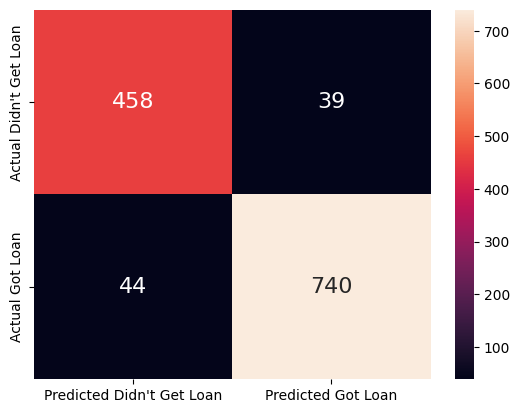

In [ ]:
from sklearn.metrics import confusion_matrix

naive_conf_mat = confusion_matrix(Y_test, naivepredictions)
naive_conf_frame = pd.DataFrame(naive_conf_mat, columns=['Predicted Didn\'t Get Loan', 'Predicted Got Loan'], index=['Actual Didn\'t Get Loan', 'Actual Got Loan'])

sns.heatmap(naive_conf_frame, annot=True, fmt='d', annot_kws={"size": 16})
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score

nb_accuracy = accuracy_score(Y_test, naivepredictions)
print('Accuracy:', nb_accuracy*100, '%')

nacc = (naive_conf_mat[0][0] + naive_conf_mat[1][1]) / (naive_conf_mat[0][0] + naive_conf_mat[0][1] + naive_conf_mat[1][0] + naive_conf_mat[1][1])
print('Calculated Accuracy:', nacc*100, '%')

Accuracy: 93.52068696330991 %
Calculated Accuracy: 93.52068696330991 %


In [ ]:
from sklearn.metrics import precision_score

nb_precision = precision_score(Y_test, naivepredictions, average='weighted')
print('Precision:', nb_precision*100, '%')

npre = (naive_conf_mat[0][0]) / (naive_conf_mat[0][0] + naive_conf_mat[0][1])
print('Calculated Precision:', npre*100, '%')

Precision: 93.53535722776661 %
Calculated Precision: 92.15291750503019 %


In [ ]:
from sklearn.metrics import recall_score

nb_recall = recall_score(Y_test, naivepredictions, average='weighted')
print('Recall:', nb_recall*100, '%')

nrec = (naive_conf_mat[0][0]) / (naive_conf_mat[0][0] + naive_conf_mat[1][0])
print('Calculated Recall:', nrec*100, '%')

Recall: 93.52068696330991 %
Calculated Recall: 91.23505976095618 %


In [ ]:
from sklearn.metrics import f1_score

nb_f1 = f1_score(Y_test, naivepredictions, average='weighted')
print('F1 score:', nb_f1*100, '%')

nf1their = 2 * ((nb_precision * nb_recall) / (nb_precision + nb_recall))
print('Calculated F1 Their:', nf1their*100, '%')

nf1 = 2*((npre*nrec) / (npre+nrec))
print('Calculated F1:', nf1*100, '%')

F1 score: 93.52653787588706 %
Calculated F1 Their: 93.52802152026507 %
Calculated F1: 91.69169169169169 %


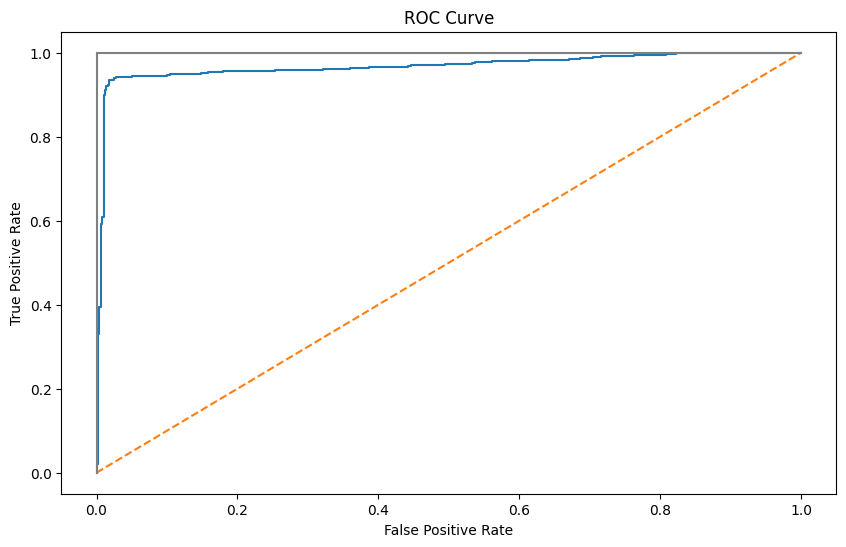

Naive Bayes AUC Score 0.9675553319919518


In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
# Get the predicted probabilities
y_pred_prob_NB = nb_model.predict_proba(X_test)[:,1]

# Create true and false positive rates
false_positive_rate_NB, true_positive_rate_NB, threshold_NB = roc_curve(Y_test, y_pred_prob_NB)

# Plot ROC curve
plt.figure(figsize=(10,6))
plt.title('ROC Curve')
plt.plot(false_positive_rate_NB, true_positive_rate_NB)
plt.plot([0,1], ls='--')
plt.plot([0,0],[1,0], c='.5')
plt.plot([1,1], c='.5')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# AUC Score
print("Naive Bayes AUC Score",roc_auc_score(Y_test, y_pred_prob_NB))

## Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(n_estimators=100, max_depth=2, random_state=42)
rf_model.fit(X_train, Y_train)
forestpredictions = rf_model.predict(X_test)

forestpredictions

array([0, 1, 1, ..., 1, 1, 0])

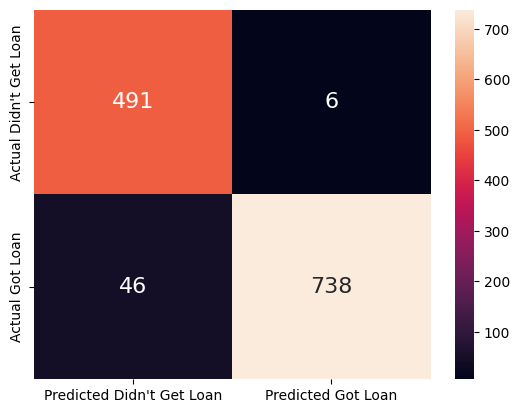

In [ ]:
from sklearn.metrics import confusion_matrix

forest_conf_mat = confusion_matrix(Y_test, forestpredictions)
forest_conf_frame = pd.DataFrame(forest_conf_mat, columns=['Predicted Didn\'t Get Loan', 'Predicted Got Loan'], index=['Actual Didn\'t Get Loan', 'Actual Got Loan'])

sns.heatmap(forest_conf_frame, annot=True, fmt='d', annot_kws={"size": 16})
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score

rf_accuracy = accuracy_score(Y_test, forestpredictions)
print('Accuracy:', rf_accuracy*100, '%')

facc = (forest_conf_mat[0][0] + forest_conf_mat[1][1]) / (forest_conf_mat[0][0] + forest_conf_mat[0][1] + forest_conf_mat[1][0] + forest_conf_mat[1][1])
print('Calculated Accuracy:', facc*100, '%')

Accuracy: 95.94067135050742 %
Calculated Accuracy: 95.94067135050742 %


In [ ]:
from sklearn.metrics import precision_score

rf_precision = precision_score(Y_test, forestpredictions, average='weighted')
print('Precision:', rf_precision*100, '%')

fpre = (forest_conf_mat[0][0]) / (forest_conf_mat[0][0] + forest_conf_mat[0][1])
print('Calculated Precision:', fpre*100, '%')

Precision: 96.18297131598892 %
Calculated Precision: 98.79275653923541 %


In [ ]:
from sklearn.metrics import recall_score

rf_recall = recall_score(Y_test, forestpredictions, average='weighted')
print('Recall:', rf_recall*100, '%')

frec = (forest_conf_mat[0][0]) / (forest_conf_mat[0][0] + forest_conf_mat[1][0])
print('Calculated Recall:', frec*100, '%')

Recall: 95.94067135050742 %
Calculated Recall: 91.43389199255121 %


In [ ]:
from sklearn.metrics import f1_score

rf_f1 = f1_score(Y_test, forestpredictions, average='weighted')
print('F1 score:', rf_f1*100, '%')

ff1their = 2 * ((rf_precision * rf_recall) / (rf_precision + rf_recall))
print('Calculated F1 Their:', ff1their*100, '%')

ff1 = 2*((fpre * frec) / (fpre + frec))
print('Calculated F1:', ff1*100, '%')

F1 score: 95.96605577171576 %
Calculated F1 Their: 96.06166854290842 %
Calculated F1: 94.97098646034814 %


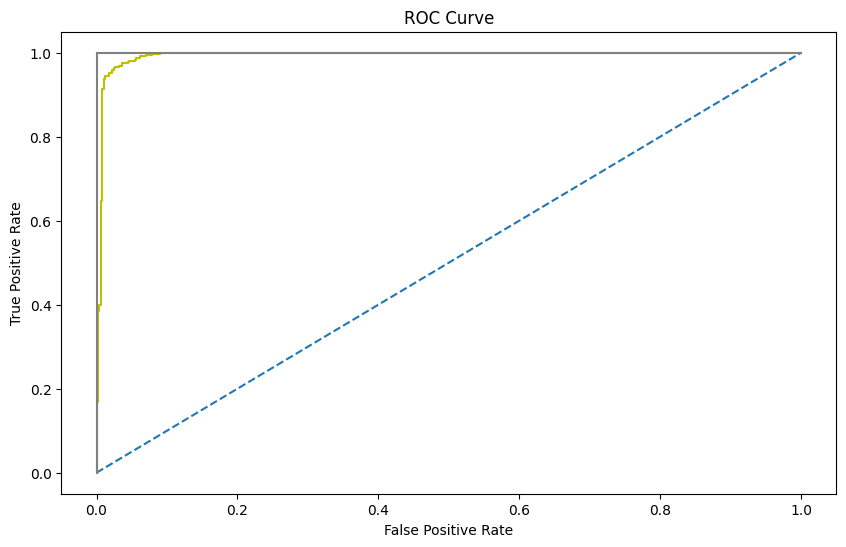

Random Forest AUC Score 0.9931758920872171


In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
# Get the predicted probabilities
y_pred_prob_RF = rf_model.predict_proba(X_test)[:,1]

# Create true and false positive rates
false_positive_rate_RF, true_positive_rate_RF, threshold_RF = roc_curve(Y_test, y_pred_prob_RF)

# Plot ROC curve
plt.figure(figsize=(10,6))
plt.title('ROC Curve')
plt.plot(false_positive_rate_RF, true_positive_rate_RF, c= 'y')
plt.plot([0,1], ls='--')
plt.plot([0,0],[1,0], c='.5')
plt.plot([1,1], c='.5')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# AUC Score
print("Random Forest AUC Score",roc_auc_score(Y_test, y_pred_prob_RF))

## Comparing the Models

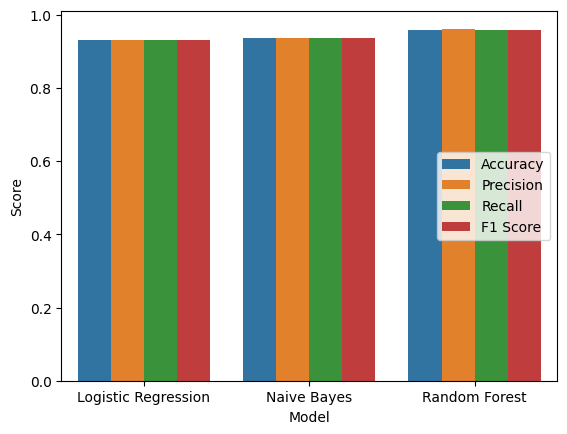

In [ ]:
metrics_df = pd.DataFrame({ 'Model' : ['Logistic Regression', 'Naive Bayes', 'Random Forest', 'Logistic Regression', 'Naive Bayes', 'Random Forest', 'Logistic Regression', 'Naive Bayes', 'Random Forest', 'Logistic Regression', 'Naive Bayes', 'Random Forest'],
                            'Metric' : ['Accuracy', 'Accuracy', 'Accuracy', 'Precision', 'Precision', 'Precision', 'Recall', 'Recall', 'Recall', 'F1 Score', 'F1 Score', 'F1 Score'],
                            'Score' : [lr_accuracy, nb_accuracy, rf_accuracy, lr_precision, nb_precision, rf_precision, lr_recall, nb_recall, rf_recall, lr_f1, nb_f1, rf_f1]})

sns.barplot(x='Model', y='Score', hue='Metric', data=metrics_df)
plt.legend(loc='center right')
plt.show()

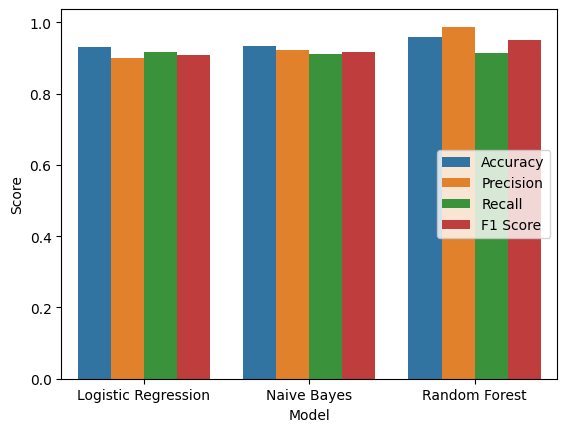

In [ ]:
metrics_df = pd.DataFrame({ 'Model' : ['Logistic Regression', 'Naive Bayes', 'Random Forest', 'Logistic Regression', 'Naive Bayes', 'Random Forest', 'Logistic Regression', 'Naive Bayes', 'Random Forest', 'Logistic Regression', 'Naive Bayes', 'Random Forest'],
                            'Metric' : ['Accuracy', 'Accuracy', 'Accuracy', 'Precision', 'Precision', 'Precision', 'Recall', 'Recall', 'Recall', 'F1 Score', 'F1 Score', 'F1 Score'],
                            'Score' : [acc, nacc, facc, pre, npre, fpre, rec, nrec, frec, f1, nf1, ff1]})

sns.barplot(x='Model', y='Score', hue='Metric', data=metrics_df)
plt.legend(loc='center right')
plt.show()

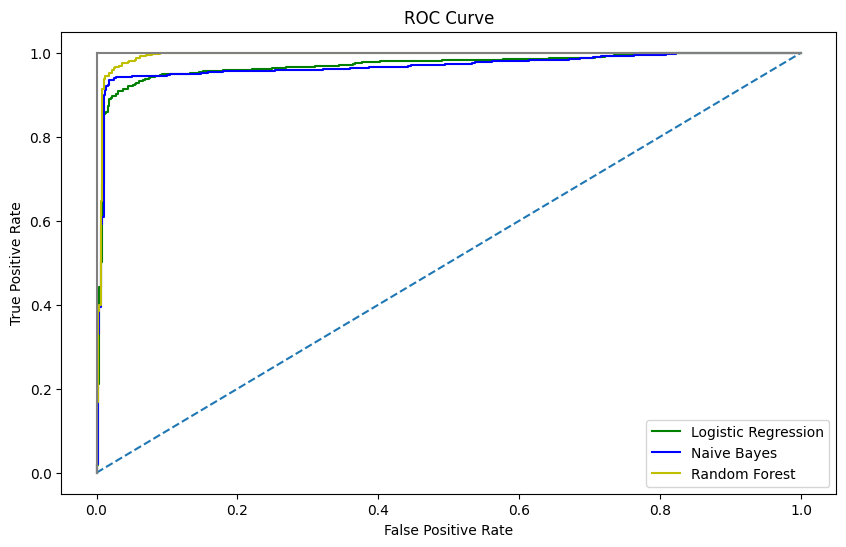

Logistic Regression AUC Score 0.9699164373999096
Naive Bayes AUC Score 0.9675553319919518
Random Forest AUC Score 0.9931758920872171


In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

# Plot ROC curve
plt.figure(figsize=(10,6))
plt.title('ROC Curve')
plt.plot(false_positive_rate_LR, true_positive_rate_LR, c = 'g', label= "Logistic Regression")
plt.plot(false_positive_rate_NB, true_positive_rate_NB, c='b', label = "Naive Bayes")
plt.plot(false_positive_rate_RF, true_positive_rate_RF, c= 'y', label = "Random Forest")
plt.legend(loc="lower right")
plt.plot([0,1], ls='--')
plt.plot([0,0],[1,0], c='.5')
plt.plot([1,1], c='.5')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# AUC Scores
print("Logistic Regression AUC Score", roc_auc_score(Y_test, y_pred_prob_LR))
print("Naive Bayes AUC Score",roc_auc_score(Y_test, y_pred_prob_NB))
print("Random Forest AUC Score",roc_auc_score(Y_test, y_pred_prob_RF))